In [1]:
import pandas
import numpy
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy import signal

# Funciones:

A continuación, se construyen funciones para ajustar los modelos SARIMAX con distintas configuraciones.

In [2]:
def mysarimax(Matriz,Y,order=(0,0,0),trend='c',seasonal_order=(0,0,0,12)):
    mod = sm.tsa.statespace.SARIMAX(Y,
                                    order=order,
                                    trend=trend,
                                    exog=numpy.asarray(Matriz),
                                    seasonal_order=seasonal_order)
    res = mod.fit(disp=False)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=40, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:2000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:2000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:200].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:200].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

In [3]:
def mysarima(Y,order=(0,0,0),trend='c',seasonal_order=(0,0,0,12)):
    # Fit the model
    mod = sm.tsa.statespace.SARIMAX(Y,order=order,trend=trend,seasonal_order=seasonal_order)
    res = mod.fit(disp=False)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=40, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:2000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:2000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:200].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:200].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

In [4]:
def mysarimax2(Matriz,Y,order=(0,0,0),trend='c',seasonal_order=(0,0,0,12),restriccion={}):
    mod = sm.tsa.statespace.SARIMAX(Y,
                                    order=order,
                                    trend=trend,
                                    exog=numpy.asarray(Matriz),
                                    seasonal_order=seasonal_order,
                                    enforce_stationarity=False,
                                    enforce_invertibility=False)
    res = mod.fit_constrained(restriccion)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=40, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:1000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:1000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:300].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:300].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

In [5]:
def mysarima2(Y,order=(0,0,0),trend='c',restriccion={},seasonal_order=(0,0,0,12)):
    # Fit the model
    mod = sm.tsa.statespace.SARIMAX(Y,order=order,trend=trend,
                                    enforce_stationarity=False,
                                    enforce_invertibility=False,
                                    seasonal_order=seasonal_order)
    res = mod.fit_constrained(restriccion)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=80, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=80, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:2000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:2000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:200].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:200].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

A continuación, se construyen funciones para validar con datos fuera del periodo de ajuste los modelos SARIMAX con distintas configuraciones.

In [6]:
def predecir_1(Resultados,Exog,Endog,limite):
    updated_res = Resultados.extend(exog=Exog,endog=Endog)
    pred = updated_res.get_prediction(start=0, dynamic=False)
    pred_ci = pred.conf_int()
    ax = Matriz_Resultados['ts'].plot(label='observed', figsize=(15, 10))
    pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)
    ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
    ax.set_xlabel('Dato')
    ax.set_ylabel('Temperatura °C')
    ax.set_ylim([-5,30])
    ax.set_xlim([limite-100,limite+150])
    plt.legend()
    plt.show()
    updated_res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(updated_res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    print(updated_res.summary())
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=40, ax=axes[1])

In [7]:
def predecir_2(Resultados,Endog,limite):
    updated_res = Resultados.extend(endog=Endog)
    pred = updated_res.get_prediction(start=0, dynamic=False)
    pred_ci = pred.conf_int()
    ax = Matriz_Resultados['ts'].plot(label='observed', figsize=(15, 10))
    pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)
    ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
    ax.set_xlabel('Dato')
    ax.set_ylabel('Temperatura °C')
    ax.set_ylim([-5,30])
    ax.set_xlim([limite-100,limite+150])
    plt.legend()
    plt.show()
    updated_res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(updated_res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    print(updated_res.summary())
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=40, ax=axes[1])

In [8]:
def predecir_3(Resultados,Exog,Endog,limite):
    updated_res = Resultados.extend(exog=Exog,endog=Endog)
    Error=pandas.DataFrame()
    Error['temp']=Endog.loc[:]
    Error['Resid']=pandas.DataFrame(updated_res.resid)
    Error['Más de 1 °C']=abs(Error['Resid'])>1
    Error['Más de 2 °C']=abs(Error['Resid'])>2
    Error['Más de 3 °C']=abs(Error['Resid'])>3
    print(Error)
    Error_medio=abs(Error['Resid']).mean()
    print('Promedio Valor Absoluto Error: '+str(Error_medio))
    Error['Resid'].plot()
    Porcentajemayor=pandas.DataFrame()
    Porcentajemayor.loc[0,'Más de 1 °C']=Error['Más de 1 °C'].mean()
    Porcentajemayor.loc[0,'Más de 2 °C']=Error['Más de 2 °C'].mean()
    Porcentajemayor.loc[0,'Más de 3 °C']=Error['Más de 3 °C'].mean()
    print('Porcentaje Error Mayor a 1, 2 y 3 °C: ')
    print(str(Porcentajemayor*100))
    plt.show()

In [9]:
def predecir_4(Resultados,Endog,limite):
    updated_res = Resultados.extend(endog=Endog)
    Error=pandas.DataFrame()
    Error['temp']=Endog.loc[:]
    Error['Resid']=pandas.DataFrame(updated_res.resid)
    Error['Más de 1 °C']=abs(Error['Resid'])>1
    Error['Más de 2 °C']=abs(Error['Resid'])>2
    Error['Más de 3 °C']=abs(Error['Resid'])>3
    print(Error)
    Error_medio=abs(Error['Resid']).mean()
    print('Promedio Valor Absoluto Error: '+str(Error_medio))
    Error['Resid'].plot()
    Porcentajemayor=pandas.DataFrame()
    Porcentajemayor.loc[0,'Más de 1 °C']=Error['Más de 1 °C'].mean()
    Porcentajemayor.loc[0,'Más de 2 °C']=Error['Más de 2 °C'].mean()
    Porcentajemayor.loc[0,'Más de 3 °C']=Error['Más de 3 °C'].mean()
    print('Porcentaje Error Mayor a 1, 2 y 3 °C: ')
    print(str(Porcentajemayor*100))
    plt.show()

# Ejecución:

In [10]:
Matriz=pandas.read_csv('Pichilemu.csv',sep='|')
Matriz

,Unnamed: 0,momento,rrInst,rr6Horas,rr24Horas,hr,p0,qfe1,qff,qnh,...,td,tMin12Horas,tMax12Horas,Anno,Mes,Dia,Hora,Minuto,Hora_Min_t,Hora_Max_t
0,0,2018-01-10 02:31:00,0.0,0.0,0.0,92.6,1010.4,1010.5,1014.1,1014.1,...,13.6,15.5,16.6,2018,1,10,2,31,23,22
1,1,2018-01-10 02:32:00,0.0,0.0,0.0,92.5,1010.4,1010.5,1014.1,1014.1,...,13.6,15.5,16.6,2018,1,10,2,32,23,22
2,2,2018-01-10 02:33:00,0.0,0.0,0.0,92.6,1010.3,1010.5,1014.1,1014.1,...,13.6,15.5,16.6,2018,1,10,2,33,23,22
3,3,2018-01-10 02:34:00,0.0,0.0,0.0,92.5,1010.3,1010.4,1014.0,1014.0,...,13.6,15.5,16.6,2018,1,10,2,34,23,22
4,4,2018-01-10 02:35:00,0.0,0.0,0.0,92.5,1010.4,1010.4,1014.0,1014.0,...,13.6,15.5,16.6,2018,1,10,2,35,23,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1034028,1034574,2019-12-31 23:56:00,0.0,0.0,0.0,84.9,1009.5,1009.7,1013.3,1013.3,...,12.9,10.9,15.0,2019,12,31,23,56,9,0
1034029,1034575,2019-12-31 23:57:00,0.0,0.0,0.0,85.0,1009.5,1009.6,1013.2,1013.2,...,13.0,10.9,15.0,2019,12,31,23,57,9,0
1034030,1034576,2019-12-31 23:58:00,0.0,0.0,0.0,85.0,1009.5,1009.7,1013.3,1013.3,...,12.9,10.9,15.0,2019,12,31,23,58,9,0
1034031,1034577,2019-12-31 23:59:00,0.0,0.0,0.0,84.9,1009.5,1009.7,1013.3,1013.3,...,12.8,10.9,15.0,2019,12,31,23,59,9,0


In [11]:
Matriz_Resultados=Matriz.loc[:,'ts']

In [12]:
Matriz_Informacion_general=Matriz.loc[:,['rr6Horas','rr24Horas','radiacionGlobalAcumulada24Horas',
                                  'tMin12Horas','tMax12Horas','Mes','Dia','Hora','Minuto','Hora_Min_t','Hora_Max_t']]

In [13]:
Matriz_Informacion_general['Sen_hora']=numpy.sin(Matriz['Hora']*2*numpy.pi/24 + Matriz['Minuto']/60*2*numpy.pi/24)
Matriz_Informacion_general['Cos_hora']=numpy.cos(Matriz['Hora']*2*numpy.pi/24 + Matriz['Minuto']/60*2*numpy.pi/24)
Matriz_Informacion_general['Sen_Mes']=numpy.sin((Matriz['Mes']-1)*2*numpy.pi/12)
Matriz_Informacion_general['Cos_Mes']=numpy.cos((Matriz['Mes']-1)*2*numpy.pi/12)

In [14]:
Intervalo=40#cada cuantos minutos consideramos valor

In [15]:
Matriz_Informacion_general=Matriz_Informacion_general.loc[range(0,len(Matriz_Resultados),Intervalo),:].reset_index().drop('index',axis=1)
Matriz_Resultados=Matriz_Resultados.loc[range(0,len(Matriz_Resultados),Intervalo)].reset_index().drop('index',axis=1)

In [16]:
IG=pandas.DataFrame()
IG['rr6Horas']=1*(Matriz_Informacion_general['rr6Horas'])
IG['rr24Horas']=1*(Matriz_Informacion_general['rr24Horas'])
IG['radiacionGlobalAcumulada24Horas']=1*(Matriz_Informacion_general['radiacionGlobalAcumulada24Horas'])
IG['tMin12Horas']=1*(Matriz_Informacion_general['tMin12Horas'])
IG['tMax12Horas']=1*(Matriz_Informacion_general['tMax12Horas'])
IG['Hora_Min_t']=1*(Matriz_Informacion_general['Hora_Min_t'])
IG['Hora_Max_t']=1*(Matriz_Informacion_general['Hora_Max_t'])
IG['Sen_hora']=1*(Matriz_Informacion_general['Sen_hora'])
IG['Cos_hora']=1*(Matriz_Informacion_general['Cos_hora'])
IG['Sen_Mes']=1*(Matriz_Informacion_general['Sen_Mes'])
IG['Cos_Mes']=1*(Matriz_Informacion_general['Cos_Mes'])
IG['avg_Day']=1*((Matriz_Informacion_general['tMin12Horas']+Matriz_Informacion_general['tMax12Horas'])/2)

In [17]:
for col in IG.columns:
    IG[col]=(IG[col]-IG[col].mean())/IG[col].std()

In [18]:
limite=round(len(IG)*0.7)
limite

18096

In [19]:
IG_Ajuste=IG.iloc[0:limite]
IG_Ajuste

,rr6Horas,rr24Horas,radiacionGlobalAcumulada24Horas,tMin12Horas,tMax12Horas,Hora_Min_t,Hora_Max_t,Sen_hora,Cos_hora,Sen_Mes,Cos_Mes,avg_Day
0,-0.095514,-0.132400,-2.047342,1.613064,0.535402,2.147931,1.498761,0.866413,1.117142,0.002560,1.449643,1.128029
1,-0.095514,-0.132400,-2.047342,1.613064,0.535402,2.147931,1.498761,1.047437,0.949818,0.002560,1.449643,1.128029
2,-0.095514,-0.132400,-2.047342,1.613064,0.535402,2.147931,1.498761,1.196653,0.753603,0.002560,1.449643,1.128029
3,-0.095514,-0.132400,-2.047342,1.613064,0.535402,2.147931,1.498761,1.309527,0.534461,0.002560,1.449643,1.128029
4,-0.095514,-0.132400,-2.047342,1.613064,0.535402,2.147931,1.498761,1.382629,0.299048,0.002560,1.449643,1.128029
...,...,...,...,...,...,...,...,...,...,...,...,...
18091,0.247875,0.879812,-1.921020,0.471254,-0.067396,0.255224,0.749006,0.895388,1.094096,1.220718,-0.683988,0.214190
18092,0.247875,0.879812,-1.921020,0.471254,-0.067396,0.255224,0.749006,1.071969,0.922091,1.220718,-0.683988,0.214190
18093,0.247875,0.879812,-1.921020,0.471254,-0.067396,0.255224,0.749006,1.215997,0.722038,1.220718,-0.683988,0.214190
18094,0.419570,0.936046,-1.921020,0.471254,-0.067396,0.255224,0.749006,1.323096,0.500016,1.220718,-0.683988,0.214190


In [20]:
IG_Test=IG.iloc[limite:]
IG_Test

,rr6Horas,rr24Horas,radiacionGlobalAcumulada24Horas,tMin12Horas,tMax12Horas,Hora_Min_t,Hora_Max_t,Sen_hora,Cos_hora,Sen_Mes,Cos_Mes,avg_Day
18096,0.591265,0.992280,-1.921020,0.471254,-0.067396,0.255224,0.749006,1.414709,0.017510,1.220718,-0.683988,0.214190
18097,-0.095514,0.992280,-1.921020,0.471254,-0.067396,0.255224,0.749006,1.396440,-0.228312,1.220718,-0.683988,0.214190
18098,-0.095514,0.992280,-1.921020,0.471254,-0.067396,0.255224,0.749006,1.335759,-0.467227,1.220718,-0.683988,0.214190
18099,0.076180,1.048514,-1.921020,0.471254,-0.067396,0.255224,0.749006,1.234509,-0.691977,1.220718,-0.683988,0.214190
18100,0.076180,1.048514,-1.921020,0.471254,-0.067396,0.255224,0.749006,1.095768,-0.895731,1.220718,-0.683988,0.214190
...,...,...,...,...,...,...,...,...,...,...,...,...
25846,-0.095514,-0.132400,1.775735,0.021450,-0.031938,-0.501859,-1.250341,-1.050391,0.945242,-0.700743,1.259075,-0.005131
25847,-0.095514,-0.132400,1.775735,0.021450,-0.031938,-0.501859,-1.250341,-0.870099,1.113354,-0.700743,1.259075,-0.005131
25848,-0.095514,-0.132400,1.775735,0.021450,-0.031938,-0.501859,-1.250341,-0.663352,1.247608,-0.700743,1.259075,-0.005131
25849,-0.095514,-0.132400,1.775735,0.021450,-0.031938,-0.501859,-1.250341,-0.436431,1.343923,-0.700743,1.259075,-0.005131


In [21]:
Y_Ajuste=Matriz_Resultados['ts'].iloc[0:limite]
Y_Ajuste

0        14.7
1        14.8
2        14.5
3        14.3
4        14.3
         ... 
18091    13.2
18092    13.2
18093    13.2
18094    12.6
18095    13.2
Name: ts, Length: 18096, dtype: float64

In [22]:
Y_Test=Matriz_Resultados['ts'].iloc[limite:]
Y_Test

18096    14.3
18097    14.6
18098    14.6
18099    14.3
18100    14.9
         ... 
25846    16.5
25847    16.9
25848    16.7
25849    16.5
25850    15.9
Name: ts, Length: 7755, dtype: float64

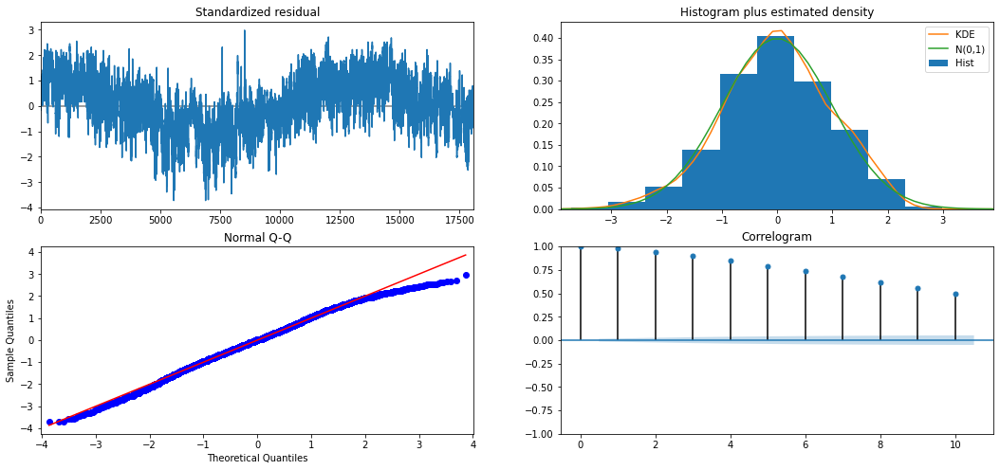

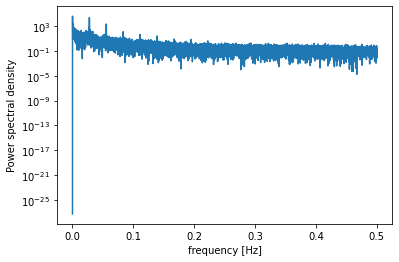

          freq           pow         delay
1     0.000055  38835.442482  18096.000000
502   0.027741  22789.603892     36.047809
2     0.000111  22159.472015   9048.000000
503   0.027796  10348.272030     35.976143
501   0.027686   4445.507034     36.119760
3     0.000166   3594.521679   6032.000000
9     0.000497   2728.523200   2010.666667
7     0.000387   2217.584244   2585.142857
1005  0.055537   2164.771702     18.005970
4     0.000221   1903.206300   4524.000000
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:                        SARIMAX   Log Likelihood              -45636.031
Date:                Tue, 17 Nov 2020   AIC                          91276.061
Time:                        11:44:32   BIC                          91291.668
Sample:                             0   HQIC                         91281.192
                              - 18096                

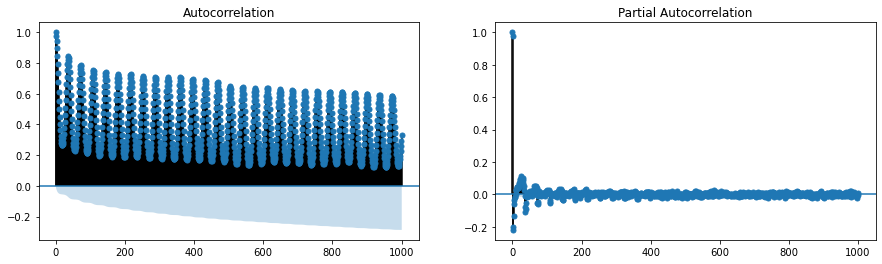

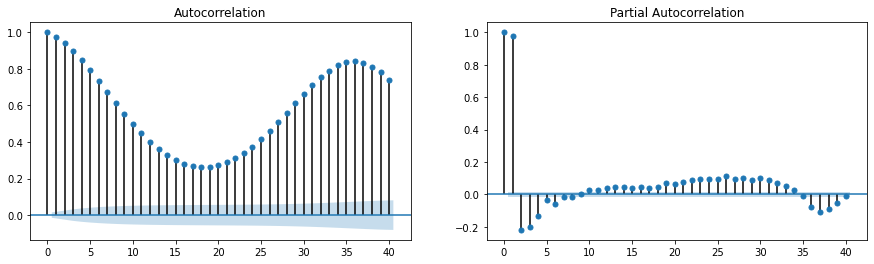

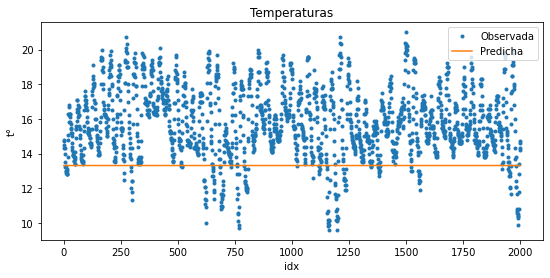

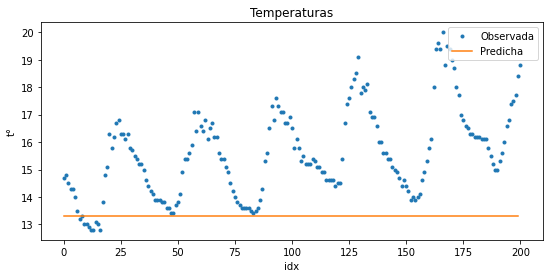

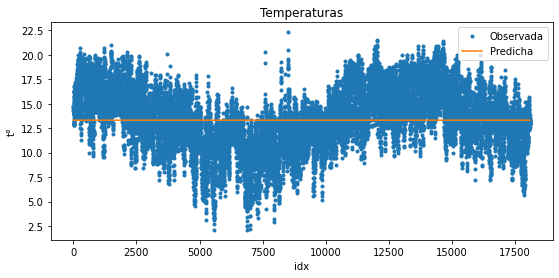

In [23]:
mysarima(Y=Y_Ajuste)

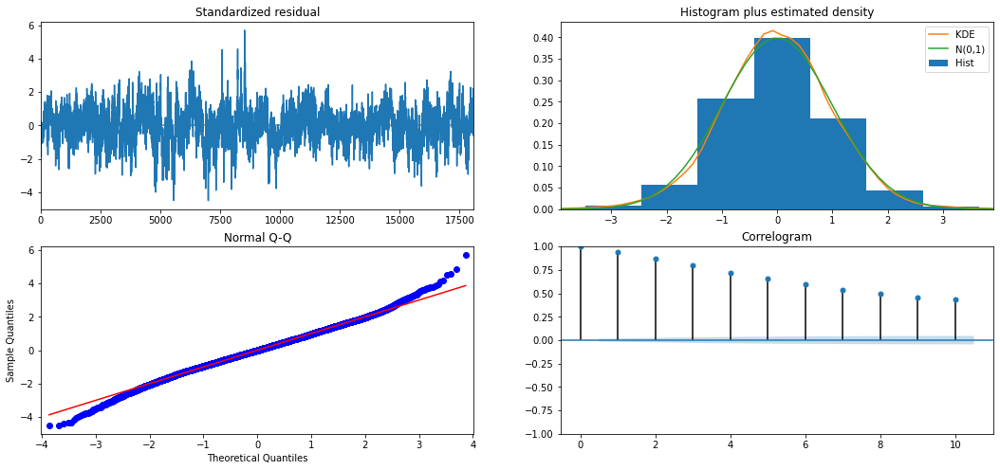

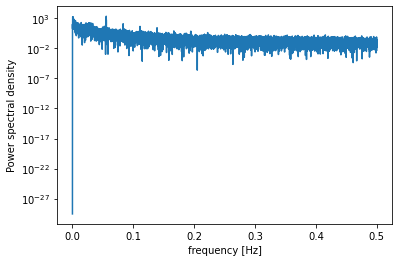

          freq          pow        delay
1005  0.055537  2117.730456    18.005970
18    0.000995  1676.318391  1005.333333
7     0.000387  1601.966428  2585.142857
9     0.000497  1558.413400  2010.666667
43    0.002376   696.527068   420.837209
6     0.000332   634.854196  3016.000000
19    0.001050   572.475920   952.421053
8     0.000442   570.541986  2262.000000
1007  0.055648   545.296337    17.970209
35    0.001934   544.075936   517.028571
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:                        SARIMAX   Log Likelihood              -35111.880
Date:                Fri, 09 Oct 2020   AIC                          70235.761
Time:                        19:15:01   BIC                          70282.581
Sample:                             0   HQIC                         70251.153
                              - 18096                                      

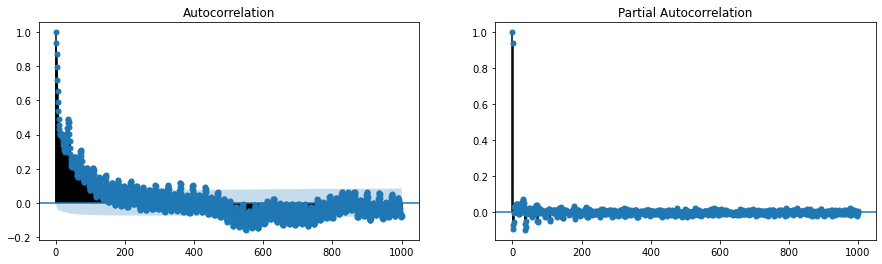

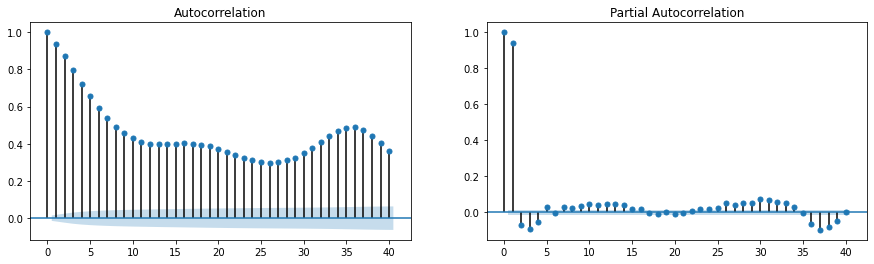

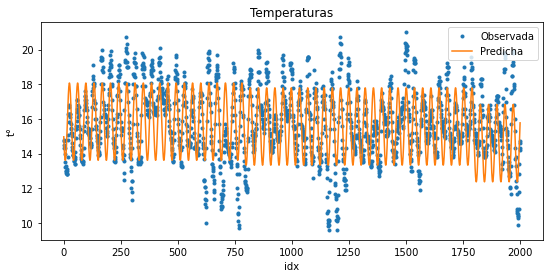

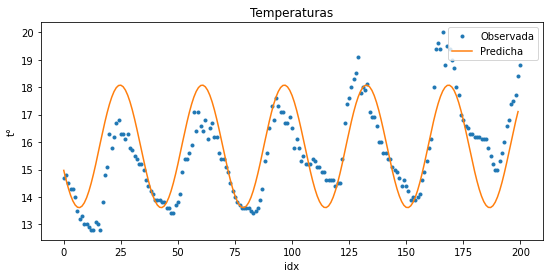

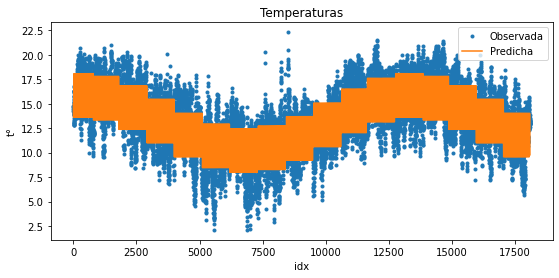

In [22]:
mysarimax(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [23]:
#Estacionalidad:

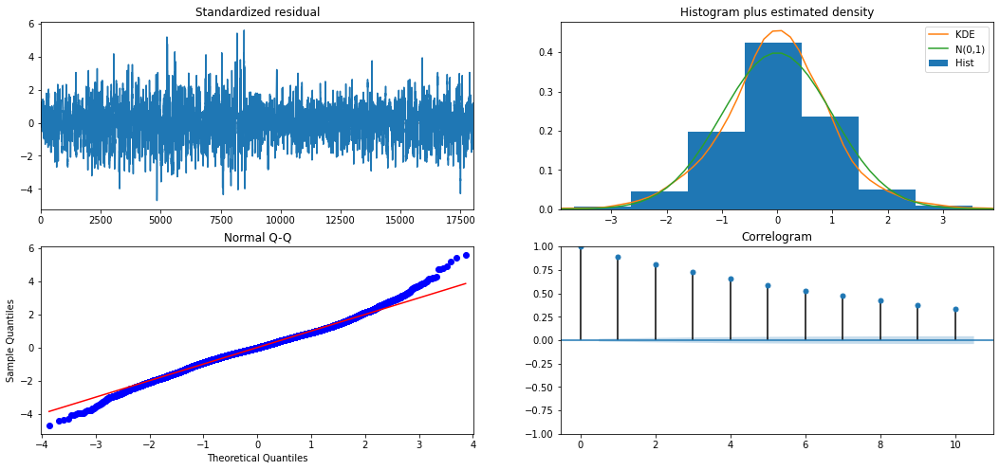

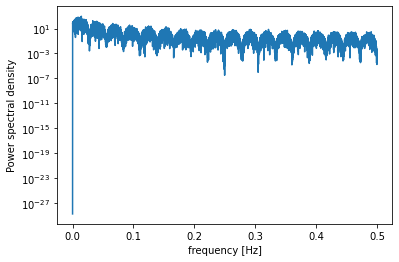

         freq         pow       delay
260  0.014368  955.828883   69.600000
233  0.012876  658.076565   77.665236
175  0.009671  650.266112  103.405714
148  0.008179  627.849594  122.270270
108  0.005968  529.627323  167.555556
208  0.011494  472.715801   87.000000
199  0.010997  426.389652   90.934673
236  0.013042  410.844044   76.677966
106  0.005858  381.210268  170.716981
89   0.004918  380.447074  203.325843
                                SARIMAX Results                                 
Dep. Variable:                       ts   No. Observations:                18096
Model:             SARIMAX(0, 1, 0, 36)   Log Likelihood              -35000.516
Date:                  Fri, 09 Oct 2020   AIC                          70013.032
Time:                          19:15:30   BIC                          70059.841
Sample:                               0   HQIC                         70028.422
                                - 18096                                         
Covariance Type

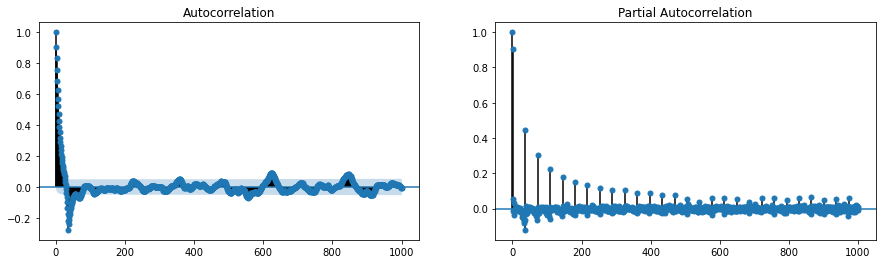

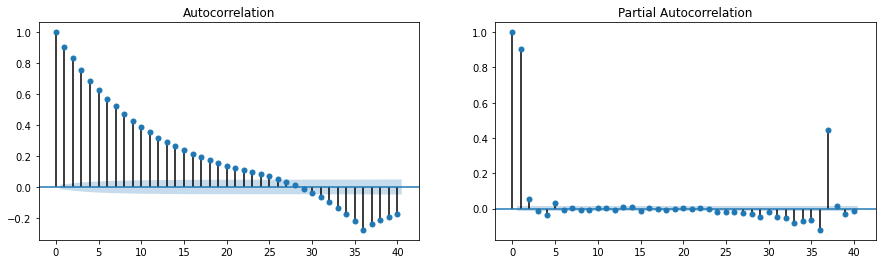

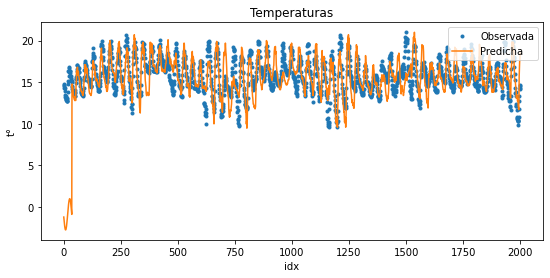

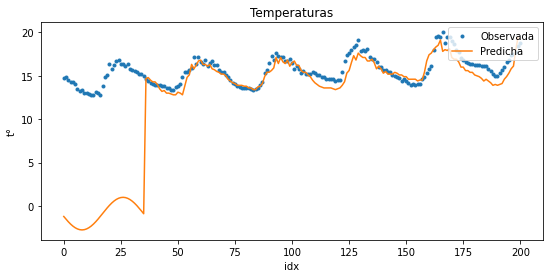

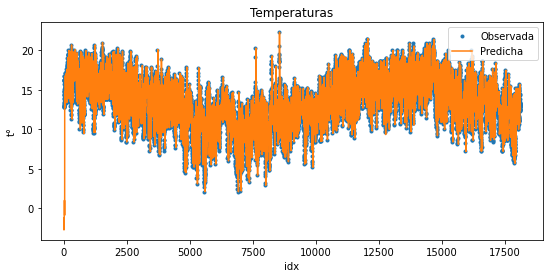

In [24]:
mysarimax(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,1,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

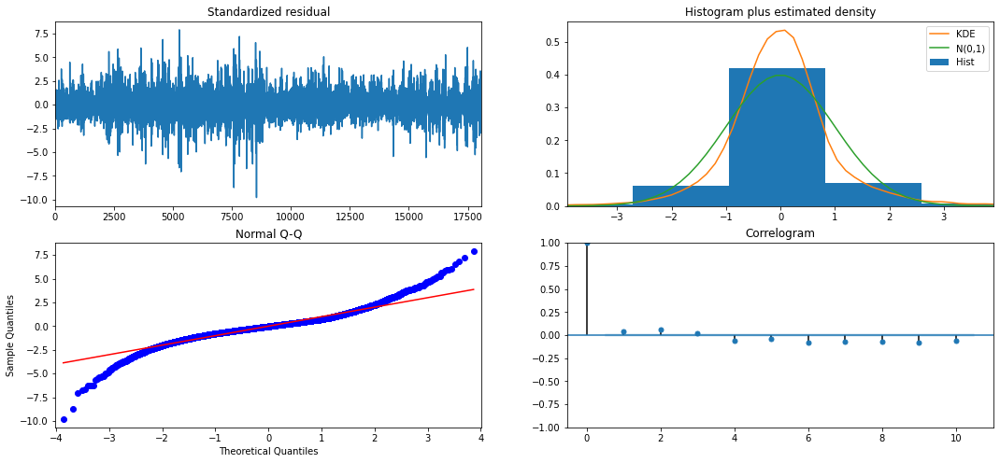

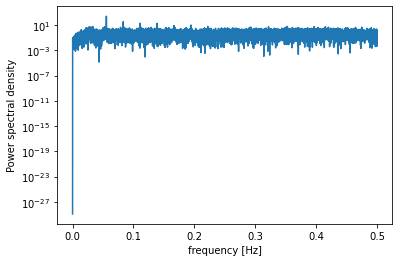

          freq         pow      delay
1005  0.055537  260.847853  18.005970
1007  0.055648   63.804829  17.970209
1507  0.083278   34.852849  12.007963
1506  0.083223   23.788036  12.015936
1008  0.055703   19.703355  17.952381
1510  0.083444   19.438463  11.984106
2013  0.111240   19.318540   8.989568
2515  0.138981   19.270446   7.195229
2010  0.111074   18.444256   9.002985
2512  0.138815   15.400371   7.203822
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:               SARIMAX(0, 1, 0)   Log Likelihood              -16185.391
Date:                Fri, 09 Oct 2020   AIC                          32382.782
Time:                        19:15:45   BIC                          32429.603
Sample:                             0   HQIC                         32398.175
                              - 18096                                         
Covariance Type:             

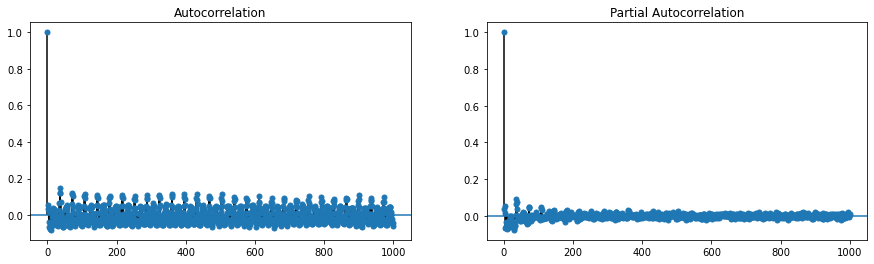

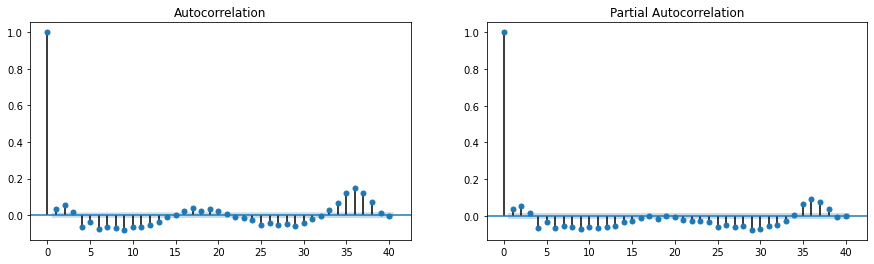

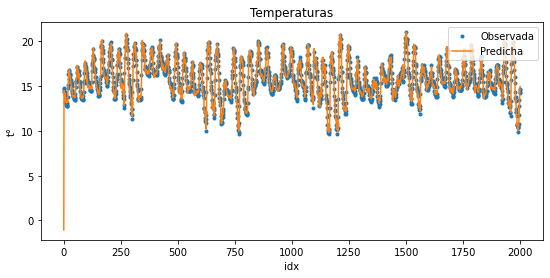

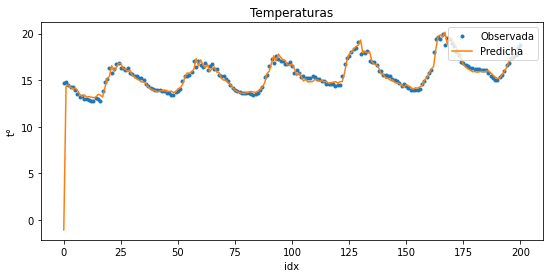

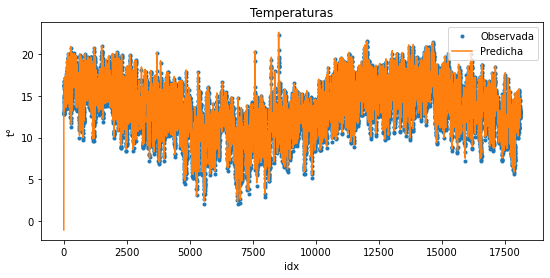

In [25]:
mysarimax(Y=Y_Ajuste,
         order=(0,1,0),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [26]:
#AR o MA 1

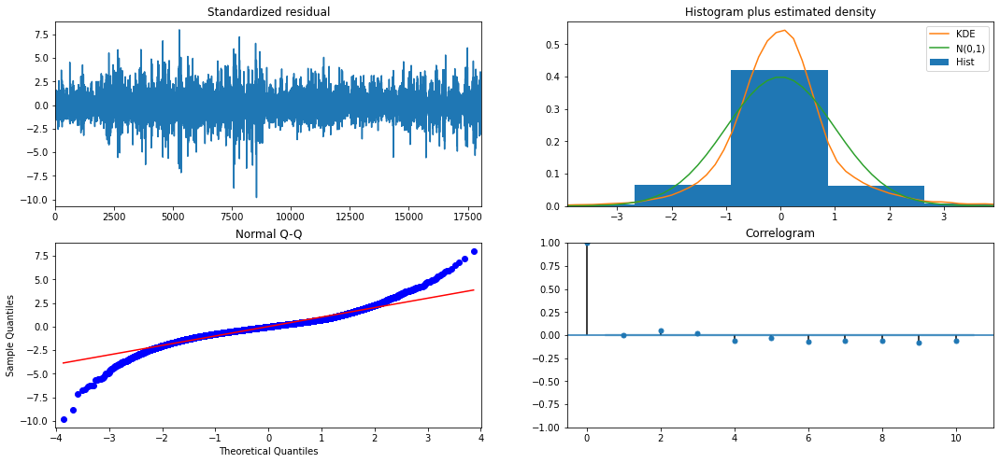

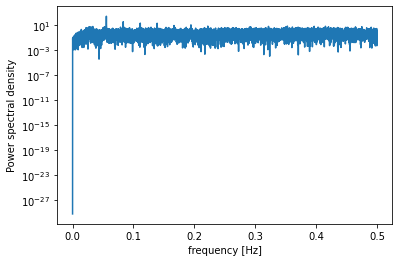

          freq         pow      delay
1005  0.055537  243.734659  18.005970
1007  0.055648   59.496034  17.970209
1507  0.083278   32.805086  12.007963
1506  0.083223   22.400576  12.015936
2515  0.138981   18.416015   7.195229
1008  0.055703   18.388531  17.952381
2013  0.111240   18.313339   8.989568
1510  0.083444   18.306764  11.984106
2010  0.111074   17.403218   9.002985
2512  0.138815   14.697579   7.203822
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:               SARIMAX(1, 1, 0)   Log Likelihood              -16173.766
Date:                Fri, 09 Oct 2020   AIC                          32361.532
Time:                        19:16:01   BIC                          32416.156
Sample:                             0   HQIC                         32379.490
                              - 18096                                         
Covariance Type:             

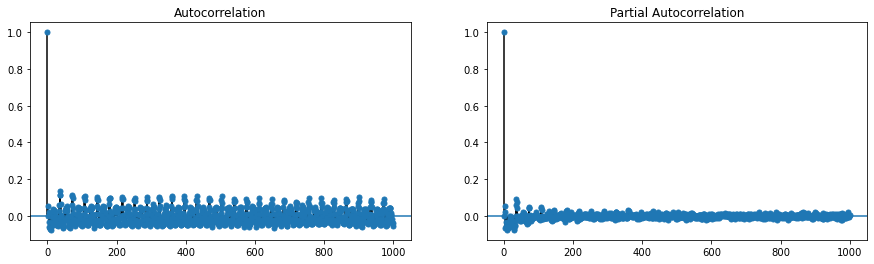

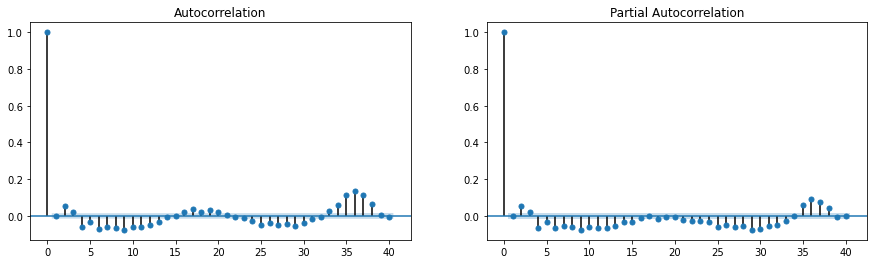

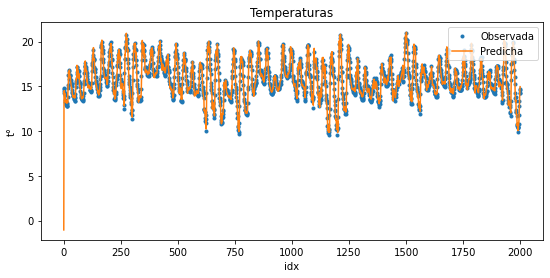

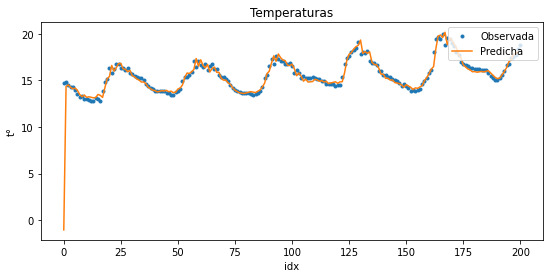

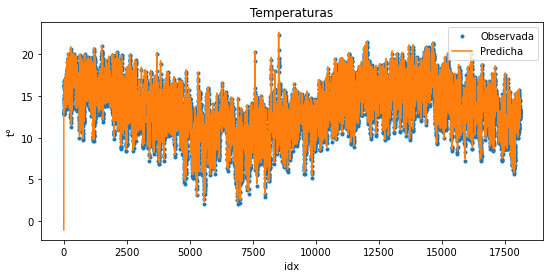

In [27]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

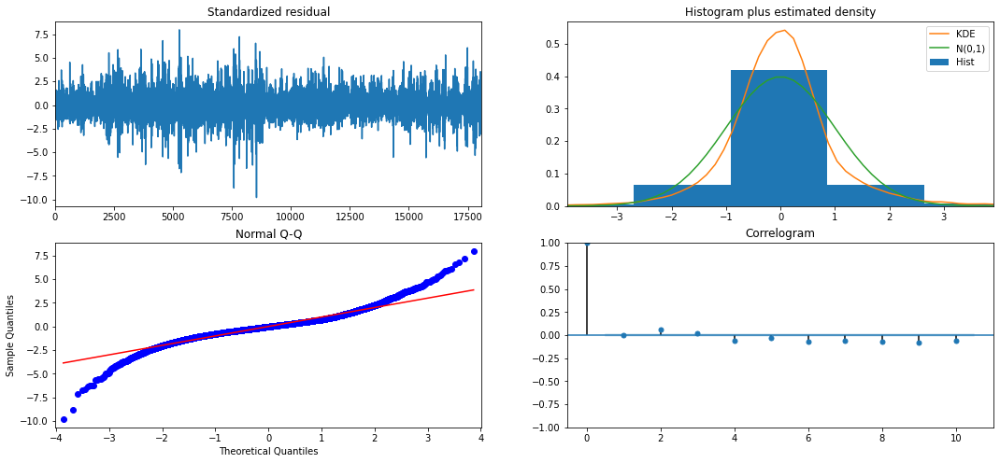

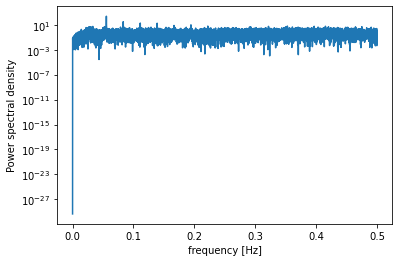

          freq         pow      delay
1005  0.055537  245.786943  18.005970
1007  0.055648   60.012571  17.970209
1507  0.083278   33.036415  12.007963
1506  0.083223   22.557174  12.015936
1008  0.055703   18.545482  17.952381
2515  0.138981   18.492661   7.195229
1510  0.083444   18.434129  11.984106
2013  0.111240   18.417368   8.989568
2010  0.111074   17.511295   9.002985
2512  0.138815   14.761275   7.203822
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:               SARIMAX(0, 1, 1)   Log Likelihood              -16174.922
Date:                Fri, 09 Oct 2020   AIC                          32363.844
Time:                        19:16:18   BIC                          32418.467
Sample:                             0   HQIC                         32381.802
                              - 18096                                         
Covariance Type:             

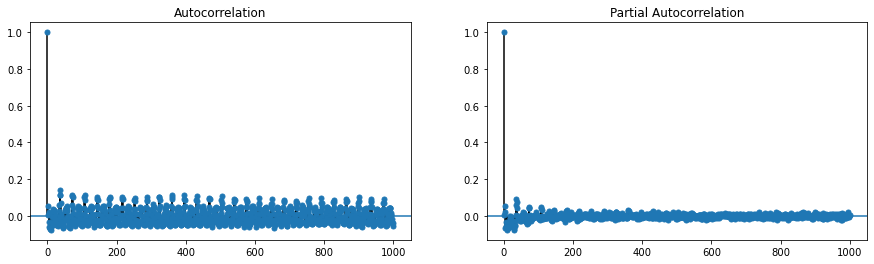

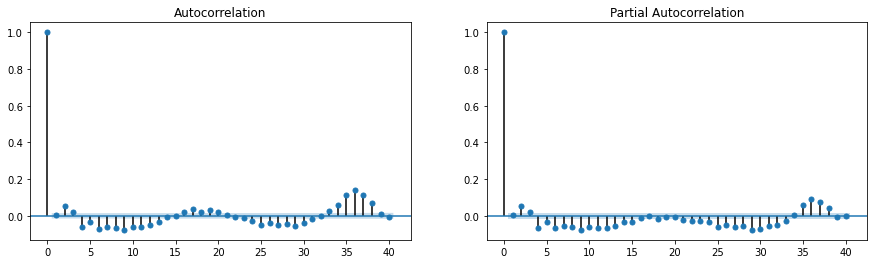

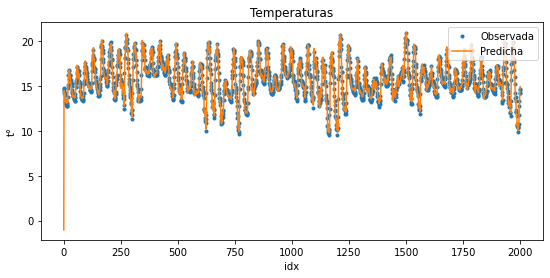

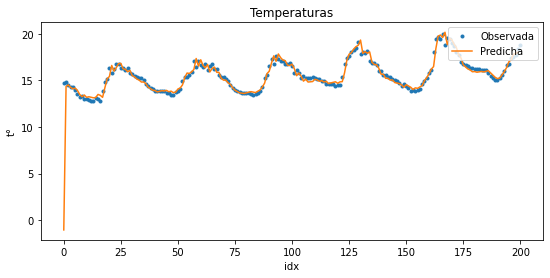

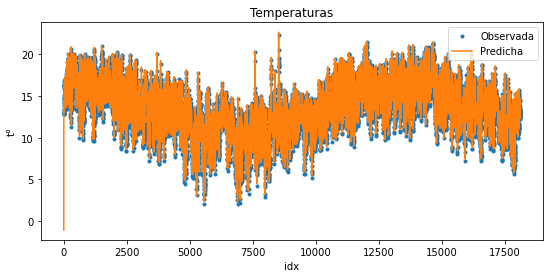

In [28]:
mysarimax(Y=Y_Ajuste,
         order=(0,1,1),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

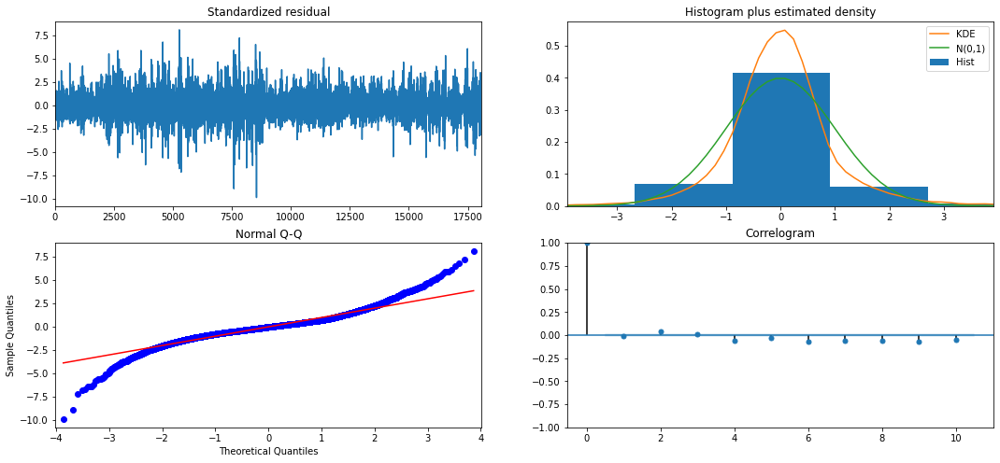

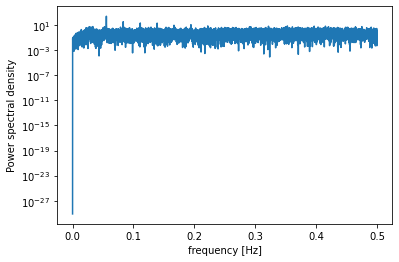

          freq         pow      delay
1005  0.055537  231.785597  18.005970
1007  0.055648   56.489739  17.970209
1507  0.083278   31.945273  12.007963
1506  0.083223   21.823112  12.015936
2515  0.138981   18.578964   7.195229
2013  0.111240   18.183204   8.989568
1510  0.083444   17.847127  11.984106
1008  0.055703   17.494740  17.952381
2010  0.111074   17.255045   9.002985
2512  0.138815   14.815811   7.203822
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:               SARIMAX(1, 1, 1)   Log Likelihood              -16163.018
Date:                Fri, 09 Oct 2020   AIC                          32342.035
Time:                        19:16:47   BIC                          32404.462
Sample:                             0   HQIC                         32362.559
                              - 18096                                         
Covariance Type:             

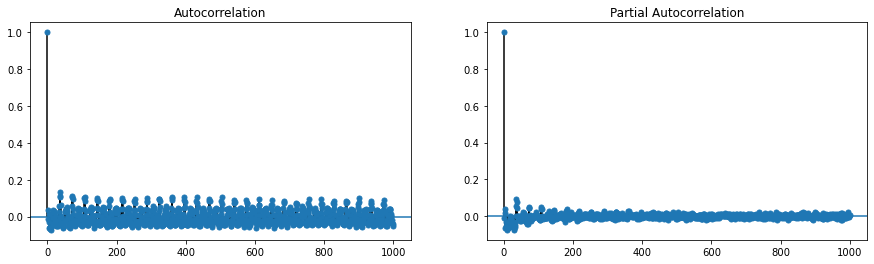

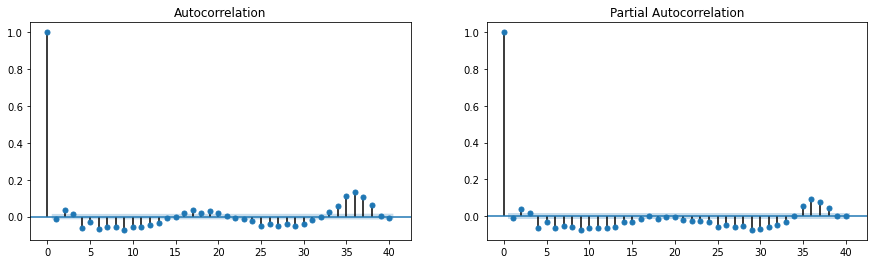

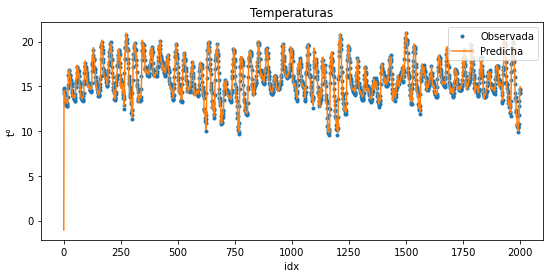

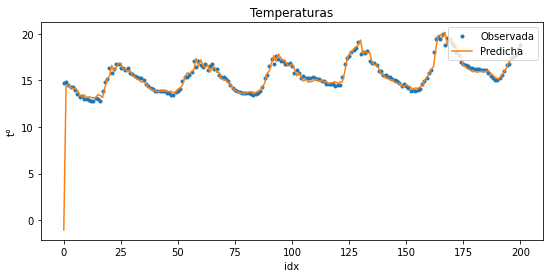

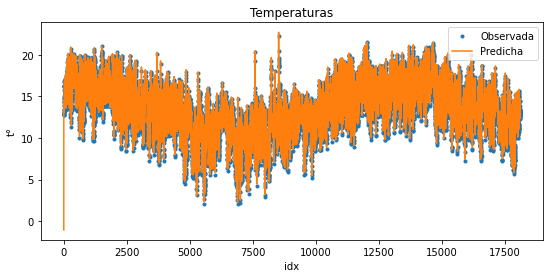

In [29]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [30]:
#Componente 24h

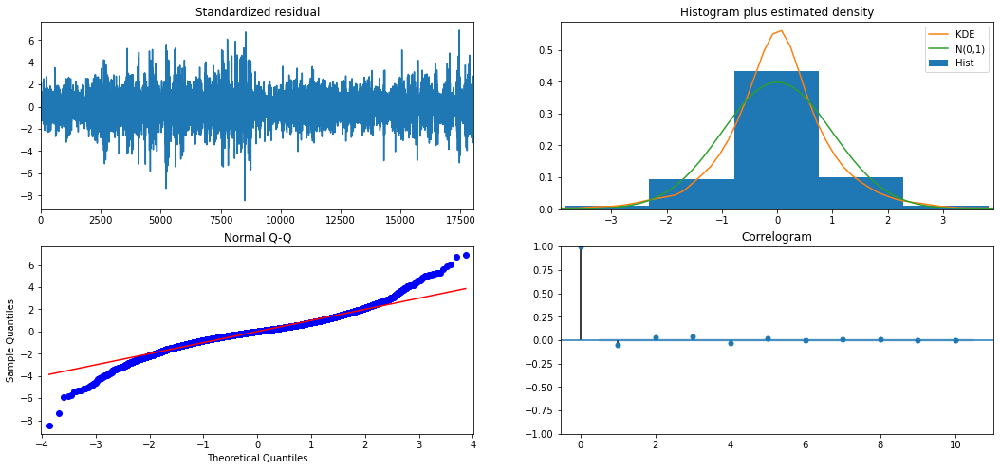

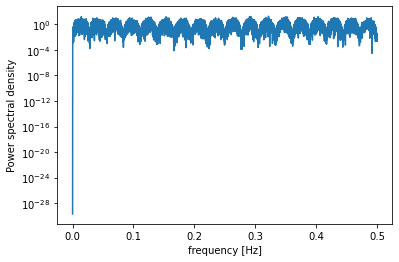

          freq        pow      delay
5824  0.321839  18.615061   3.107143
5288  0.292219  17.109623   3.422088
260   0.014368  16.054533  69.600000
5259  0.290617  15.368041   3.440958
7299  0.403349  15.342726   2.479244
2778  0.153515  15.050599   6.514039
6332  0.349912  14.647041   2.857865
5305  0.293159  14.457661   3.411122
6385  0.352840  14.106864   2.834143
2260  0.124889  13.909273   8.007080
                                      SARIMAX Results                                      
Dep. Variable:                                  ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(0, 1, [], 36)   Log Likelihood              -20475.904
Date:                             Fri, 09 Oct 2020   AIC                          40967.808
Time:                                     19:23:04   BIC                          41030.219
Sample:                                          0   HQIC                         40988.328
                                         

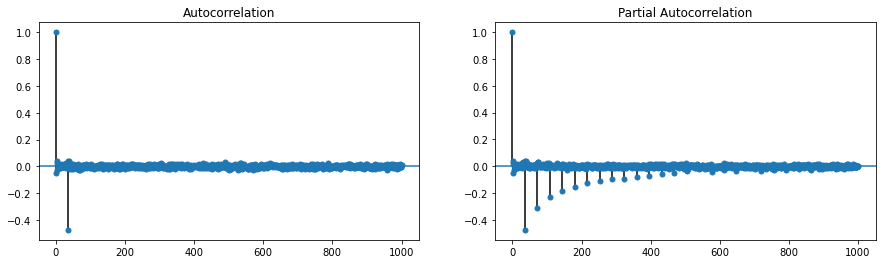

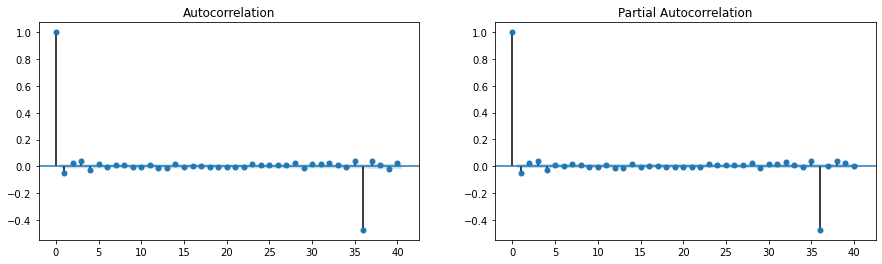

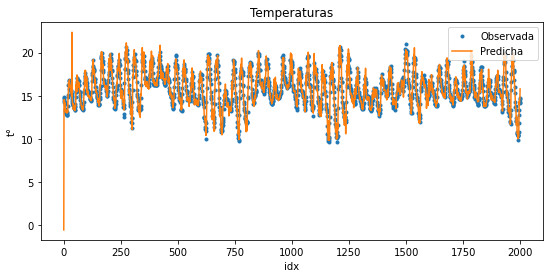

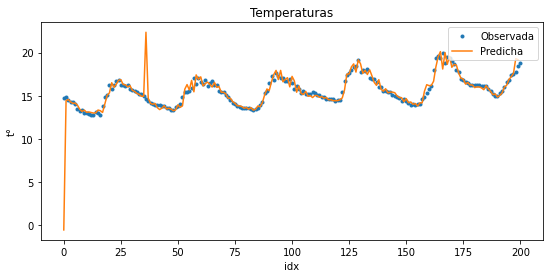

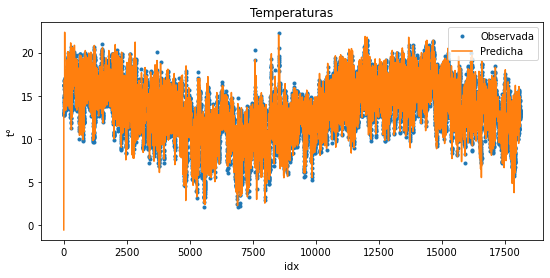

In [31]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,1,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


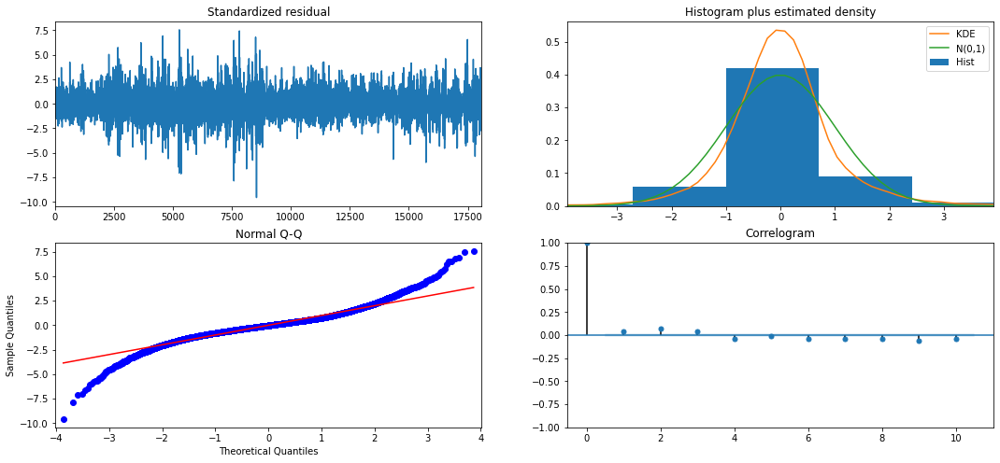

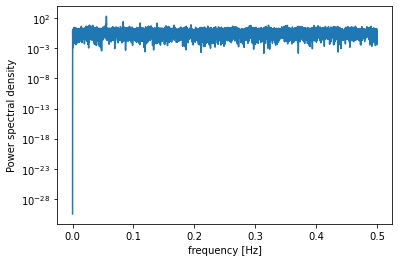

          freq         pow      delay
1005  0.055537  200.977470  18.005970
1007  0.055648   49.105154  17.970209
1507  0.083278   26.130012  12.007963
1506  0.083223   17.787080  12.015936
1008  0.055703   14.702041  17.952381
1510  0.083444   14.409181  11.984106
2515  0.138981   14.343294   7.195229
2013  0.111240   14.304486   8.989568
2010  0.111074   13.405342   9.002985
2512  0.138815   11.508408   7.203822
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(0, 0, 1, 36)   Log Likelihood              -15691.530
Date:                            Fri, 09 Oct 2020   AIC                          31401.059
Time:                                    19:31:54   BIC                          31471.290
Sample:                                         0   HQIC                         31424.148
                                    

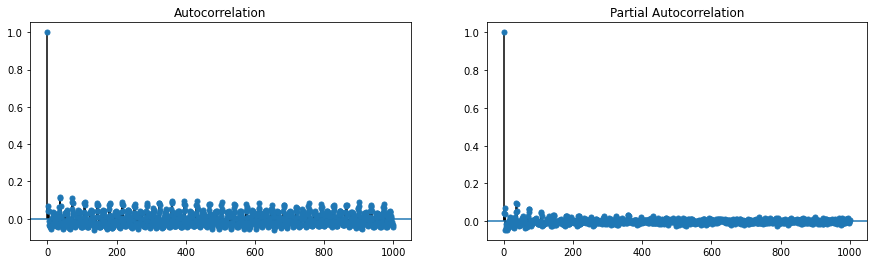

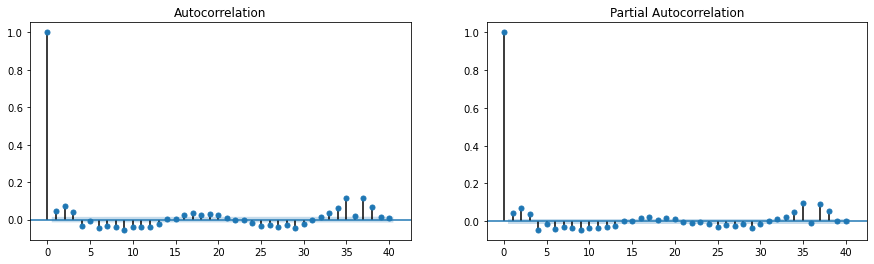

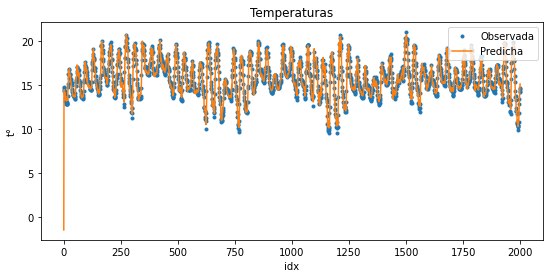

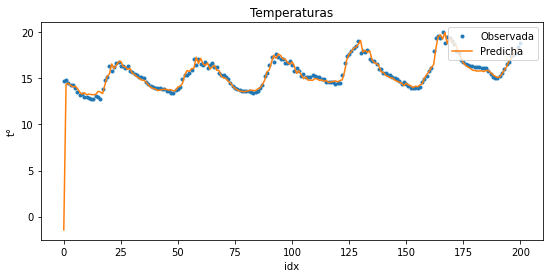

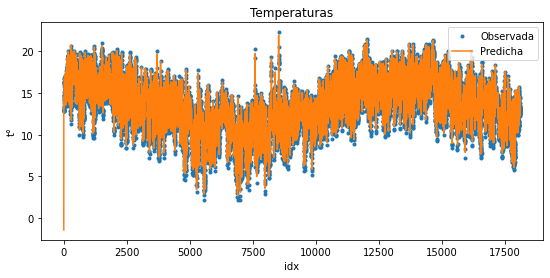

In [32]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

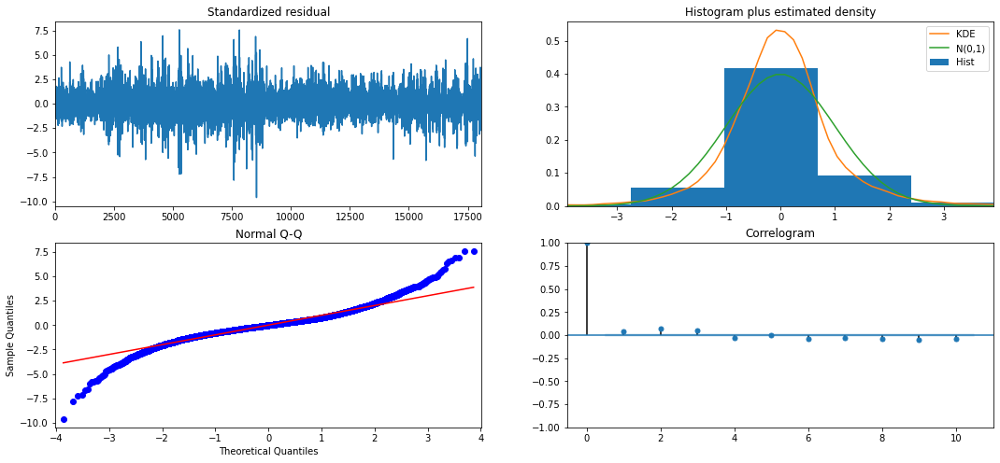

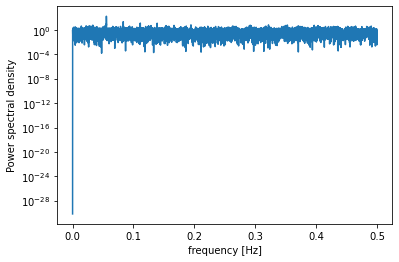

          freq         pow      delay
1005  0.055537  180.067105  18.005970
1007  0.055648   43.863442  17.970209
1507  0.083278   23.410896  12.007963
1506  0.083223   15.953620  12.015936
1008  0.055703   13.113035  17.952381
1510  0.083444   12.918355  11.984106
2515  0.138981   12.872189   7.195229
2013  0.111240   12.870987   8.989568
2010  0.111074   11.970239   9.002985
2512  0.138815   10.307606   7.203822
                                      SARIMAX Results                                      
Dep. Variable:                                  ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(1, 0, [], 36)   Log Likelihood              -15644.300
Date:                             Fri, 09 Oct 2020   AIC                          31306.601
Time:                                     19:40:43   BIC                          31376.832
Sample:                                          0   HQIC                         31329.690
                              

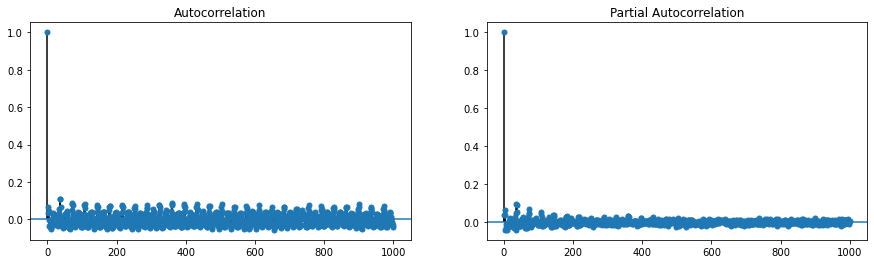

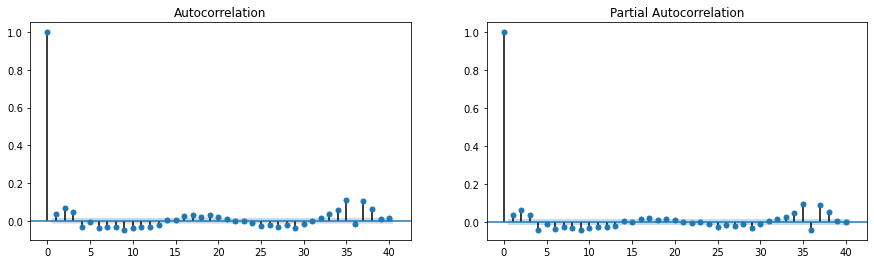

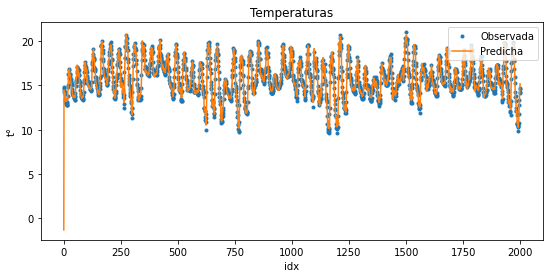

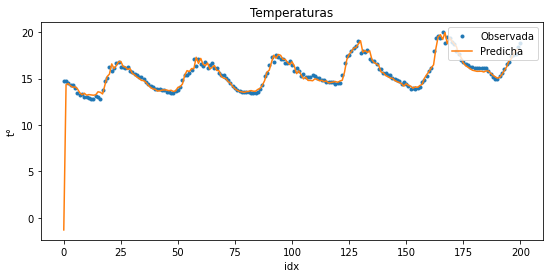

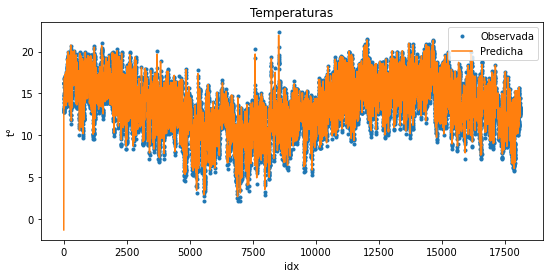

In [33]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


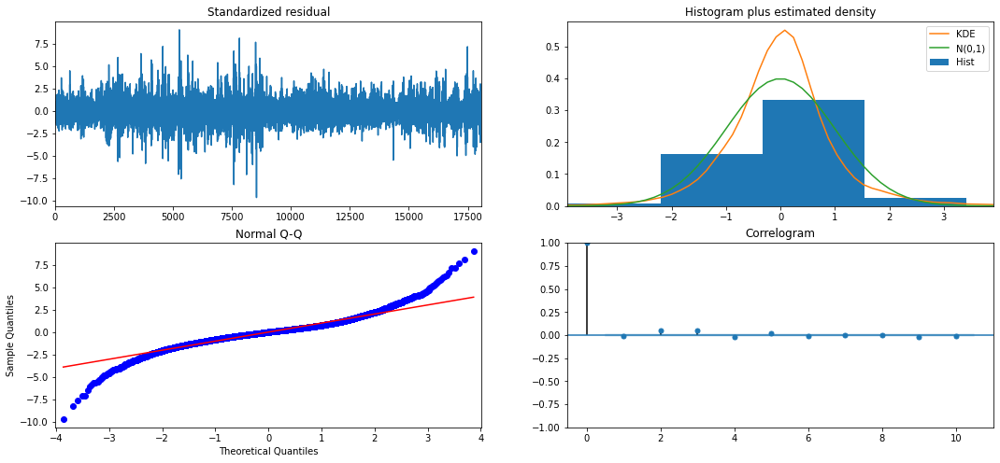

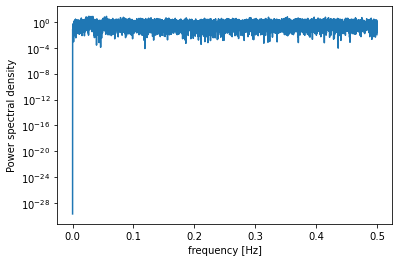

          freq       pow      delay
485   0.026802  7.666440  37.311340
1007  0.055648  7.394963  17.970209
601   0.033212  7.240775  30.109817
548   0.030283  7.065495  33.021898
494   0.027299  6.228336  36.631579
6385  0.352840  6.201739   2.834143
404   0.022325  6.126840  44.792079
543   0.030007  6.028245  33.325967
948   0.052387  5.918096  19.088608
462   0.025531  5.787863  39.168831
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood              -15171.124
Date:                            Fri, 09 Oct 2020   AIC                          30362.248
Time:                                    19:50:15   BIC                          30440.282
Sample:                                         0   HQIC                         30387.902
                                          - 18096         

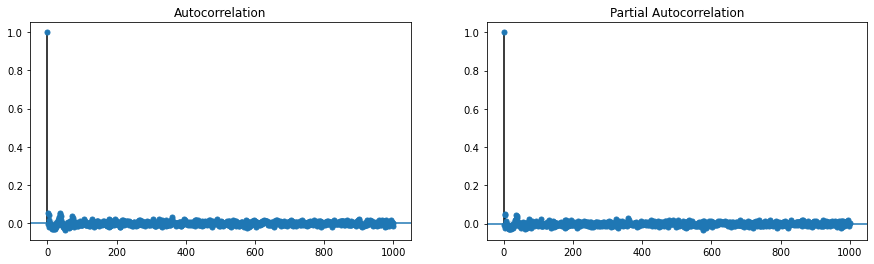

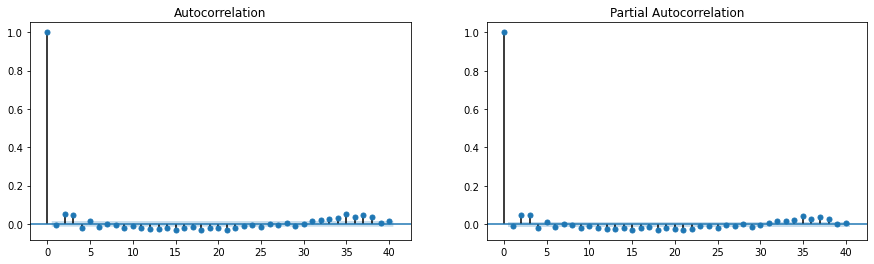

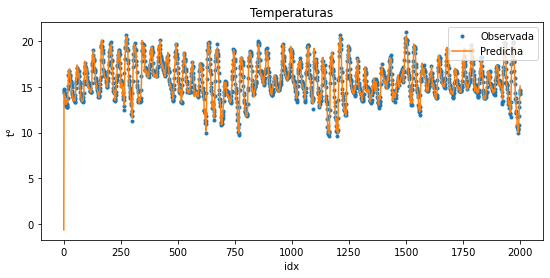

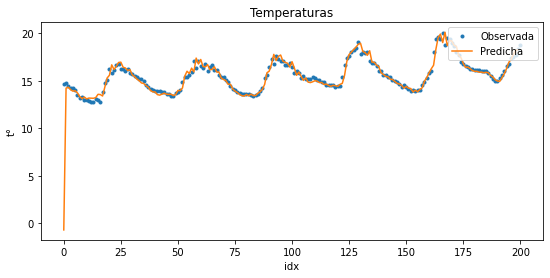

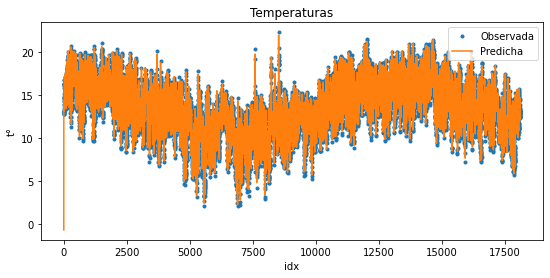

In [34]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [35]:
#Retiramos variables no significativas:

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


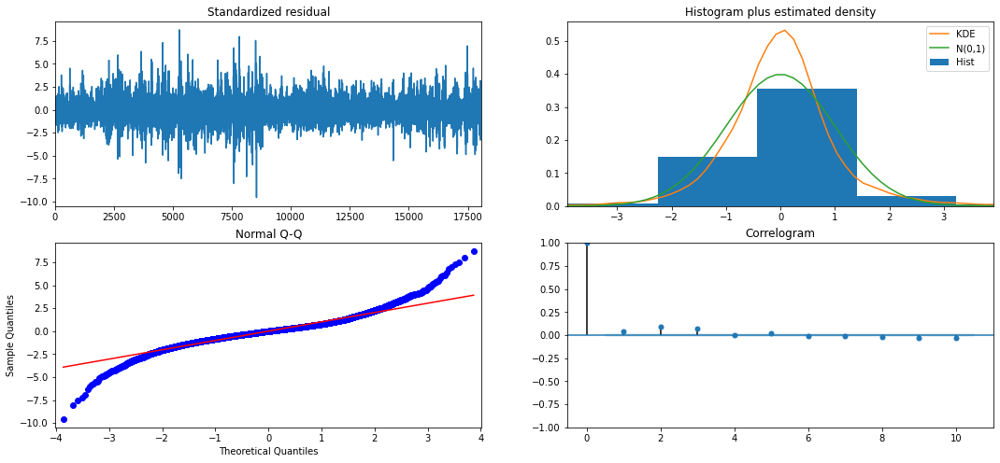

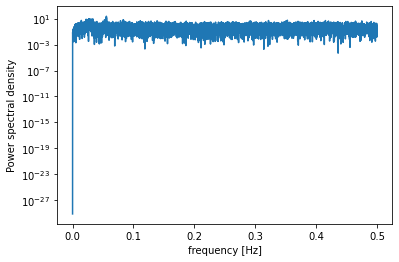

          freq        pow      delay
1005  0.055537  23.915672  18.005970
1007  0.055648  15.134034  17.970209
485   0.026802   9.797248  37.311340
601   0.033212   9.439506  30.109817
548   0.030283   9.262063  33.021898
404   0.022325   8.294445  44.792079
502   0.027741   8.246224  36.047809
543   0.030007   7.620845  33.325967
494   0.027299   7.526408  36.631579
462   0.025531   7.496138  39.168831
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood              -15300.414
Date:                            Sat, 10 Oct 2020   AIC                          30618.828
Time:                                    16:59:15   BIC                          30689.058
Sample:                                         0   HQIC                         30641.917
                                          - 180

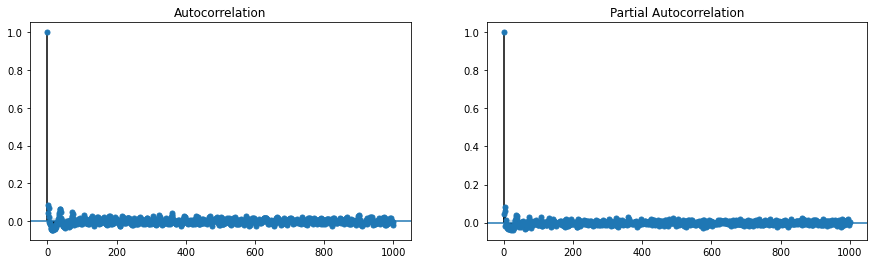

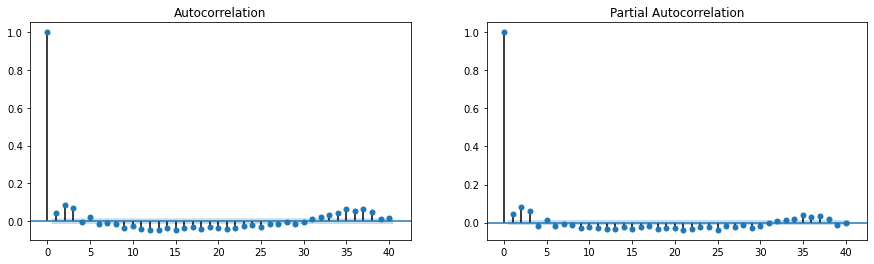

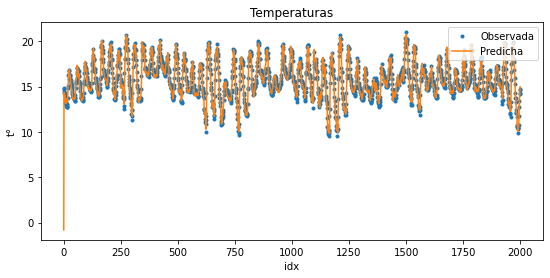

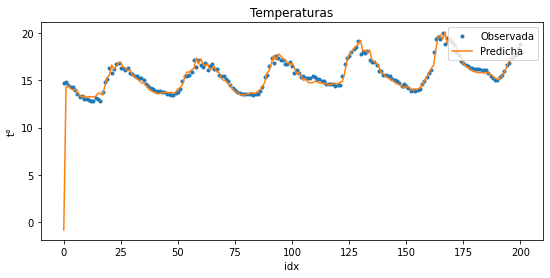

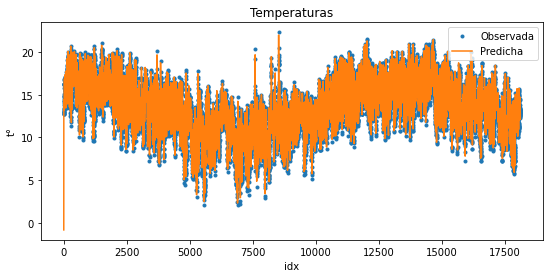

In [41]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Cos_Mes']])

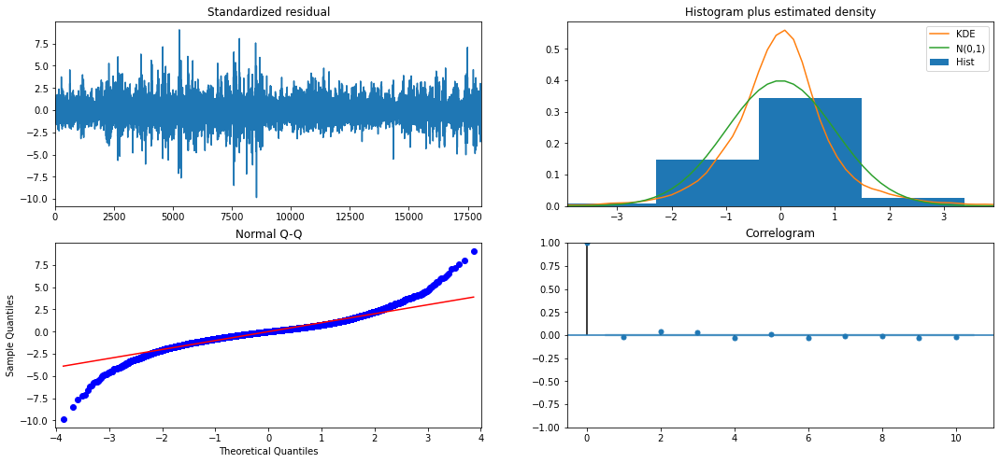

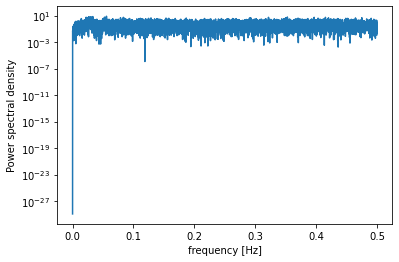

          freq       pow      delay
1007  0.055648  8.117382  17.970209
601   0.033212  7.210698  30.109817
485   0.026802  6.995117  37.311340
548   0.030283  6.704184  33.021898
6385  0.352840  6.247087   2.834143
948   0.052387  5.908793  19.088608
543   0.030007  5.757890  33.325967
404   0.022325  5.737418  44.792079
5824  0.321839  5.586365   3.107143
1510  0.083444  5.563669  11.984106
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood              -15197.790
Date:                            Fri, 09 Oct 2020   AIC                          30411.581
Time:                                    20:06:43   BIC                          30474.008
Sample:                                         0   HQIC                         30432.104
                                          - 18096         

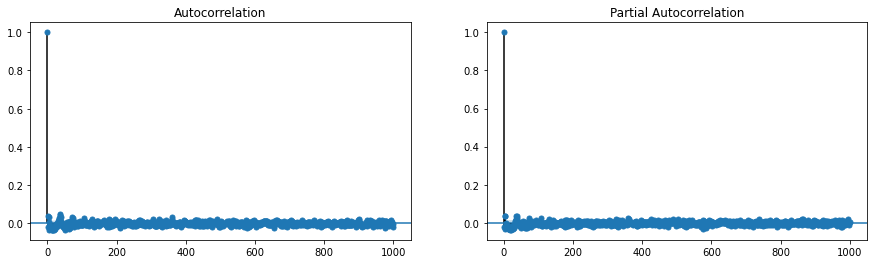

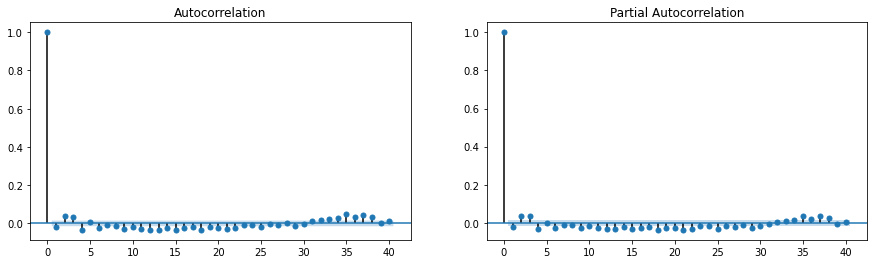

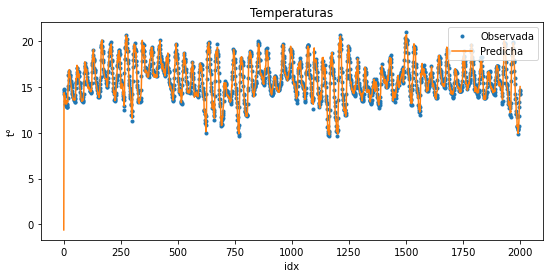

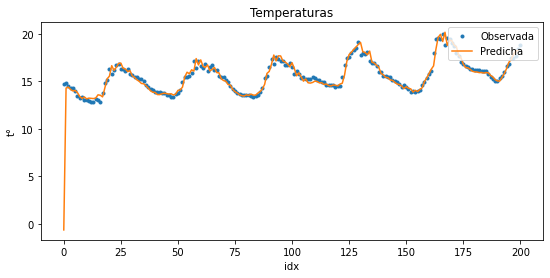

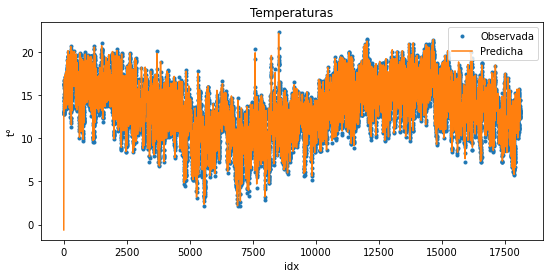

In [37]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

In [38]:
#AR o MA 18

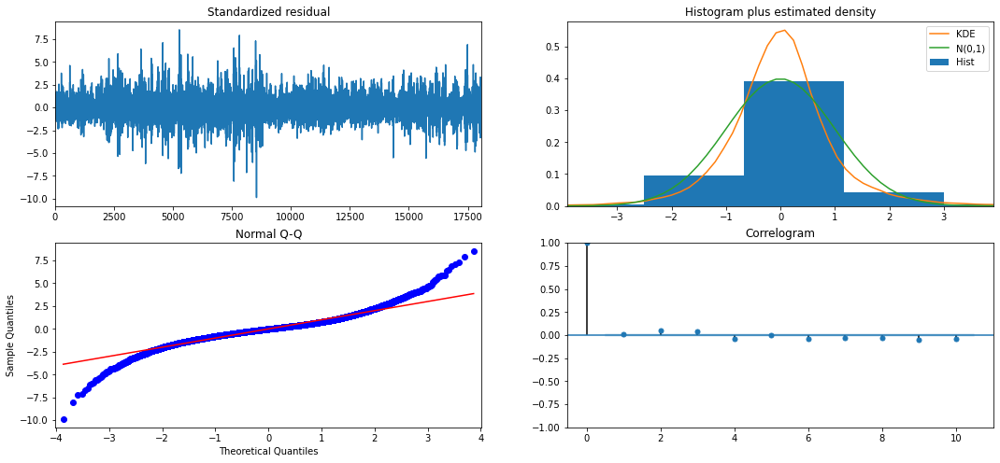

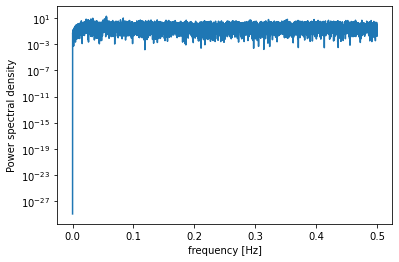

          freq        pow      delay
1005  0.055537  18.277896  18.005970
1007  0.055648  13.907374  17.970209
1507  0.083278   9.776912  12.007963
601   0.033212   9.007375  30.109817
1000  0.055261   7.386978  18.096000
948   0.052387   7.220158  19.088608
548   0.030283   6.976090  33.021898
1506  0.083223   6.808369  12.015936
404   0.022325   6.581814  44.792079
6385  0.352840   6.249919   2.834143
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -15370.444
Date:                                 Fri, 09 Oct 2020   AIC                          30760.888
Time:                                         20:18:07   BIC                          30838.922
Sample:                                              0   HQIC                         30786.542
                 

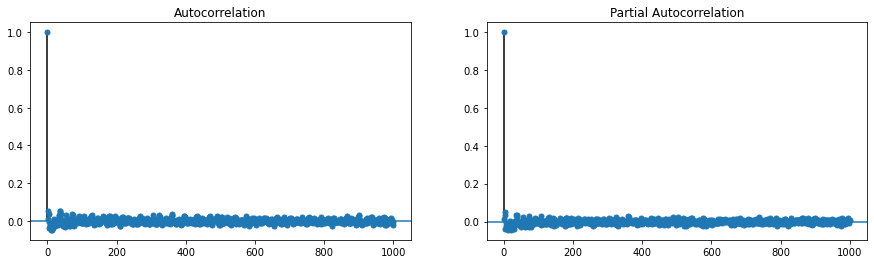

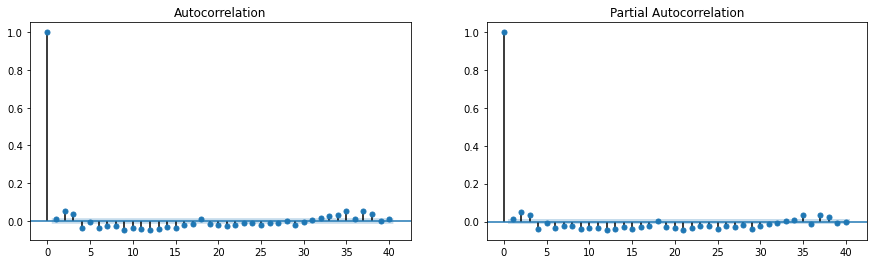

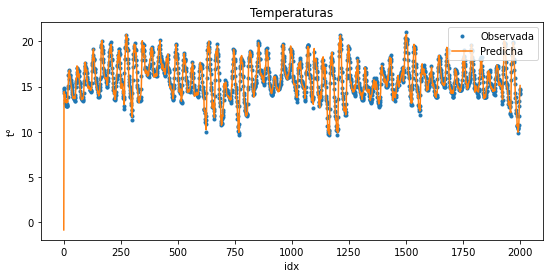

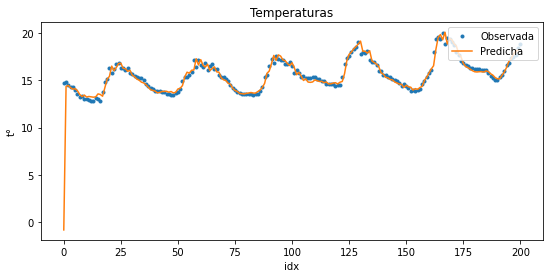

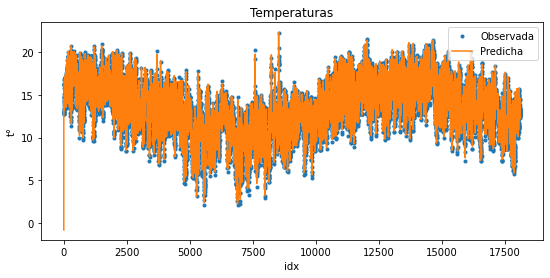

In [39]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

In [43]:
# Se opta por: 

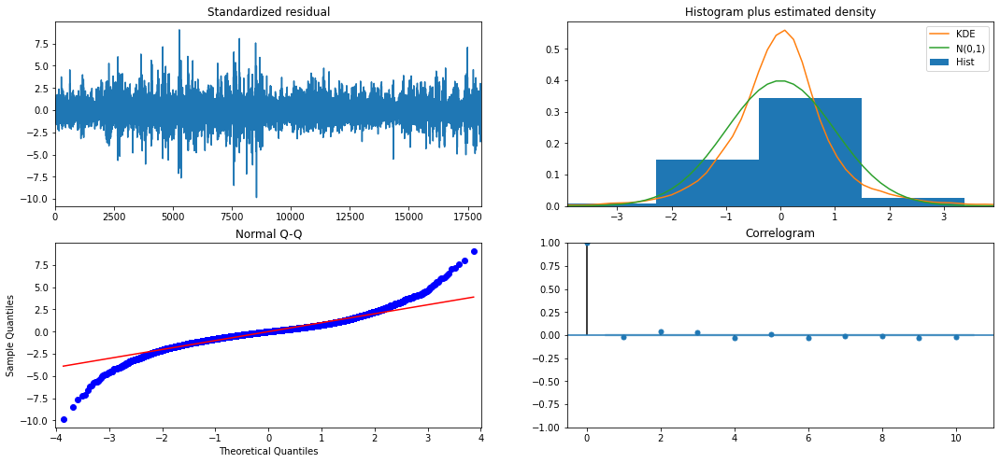

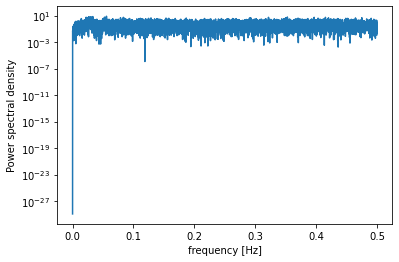

          freq       pow      delay
1007  0.055648  8.117382  17.970209
601   0.033212  7.210698  30.109817
485   0.026802  6.995117  37.311340
548   0.030283  6.704184  33.021898
6385  0.352840  6.247087   2.834143
948   0.052387  5.908793  19.088608
543   0.030007  5.757890  33.325967
404   0.022325  5.737418  44.792079
5824  0.321839  5.586365   3.107143
1510  0.083444  5.563669  11.984106
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood              -15197.790
Date:                            Tue, 17 Nov 2020   AIC                          30411.581
Time:                                    11:51:54   BIC                          30474.008
Sample:                                         0   HQIC                         30432.104
                                          - 18096         

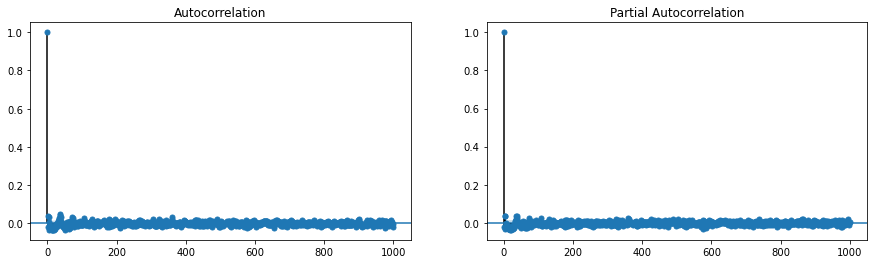

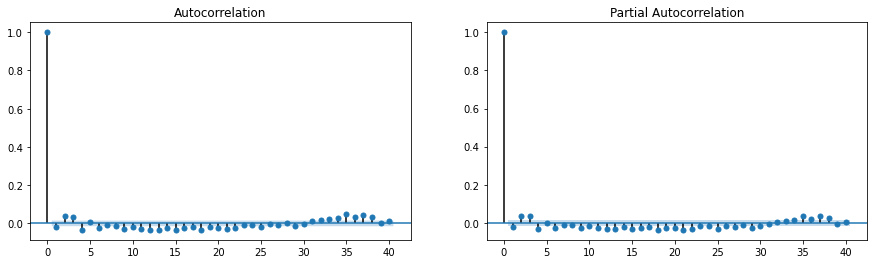

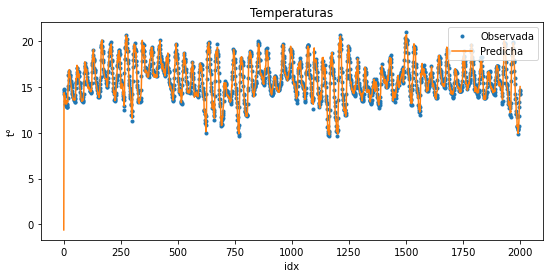

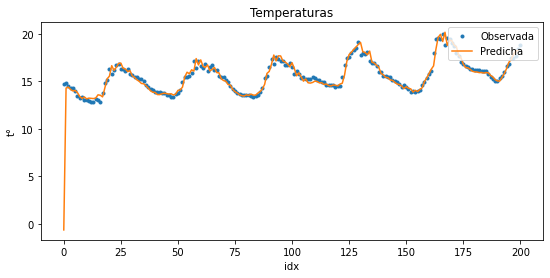

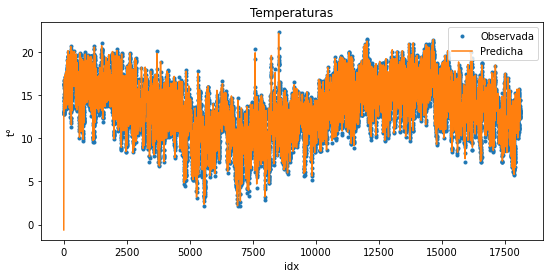

In [24]:
Res1=mysarimax(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

In [25]:
#Para Validar:

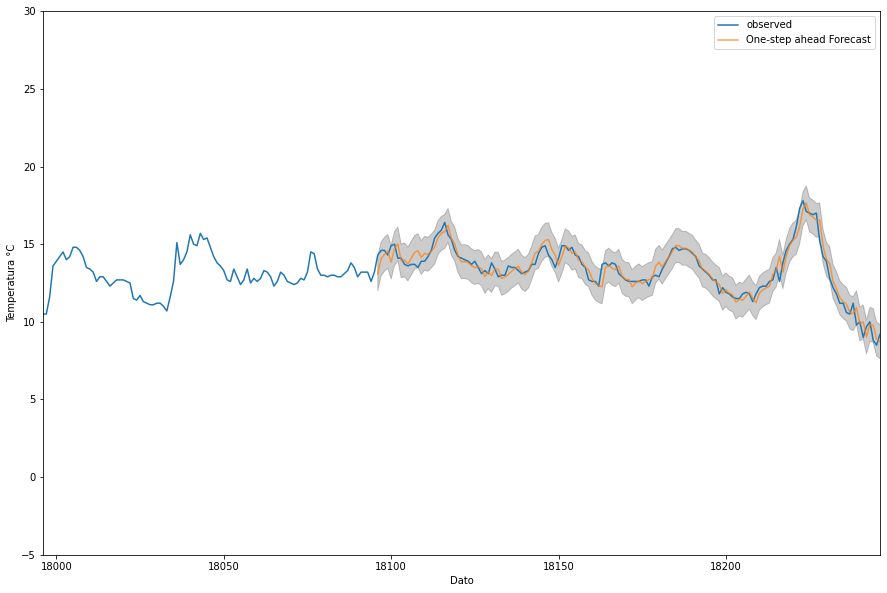

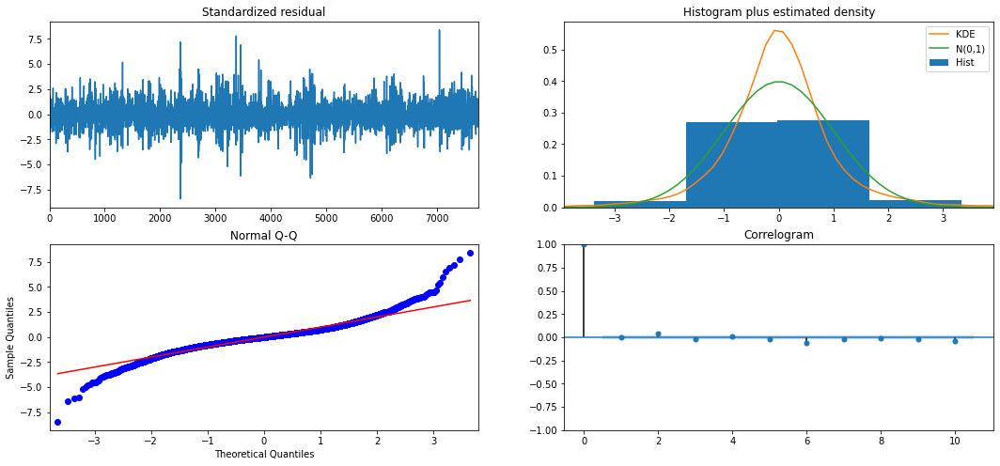

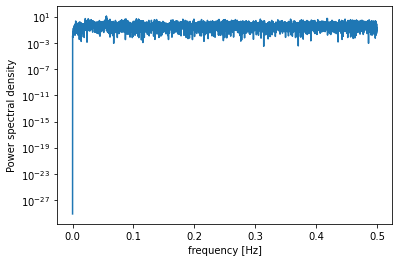

                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                 7755
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood               -6441.965
Date:                            Tue, 17 Nov 2020   AIC                          12899.930
Time:                                    11:52:08   BIC                          12955.577
Sample:                                         0   HQIC                         12919.007
                                           - 7755                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    1.25e-07   9.34e-06      0.013      0.989   -1.82e-05    1.84e-05
Sen_hora      -1.6353      0.059   

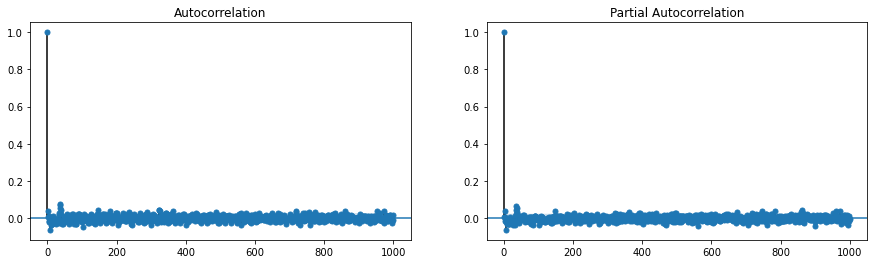

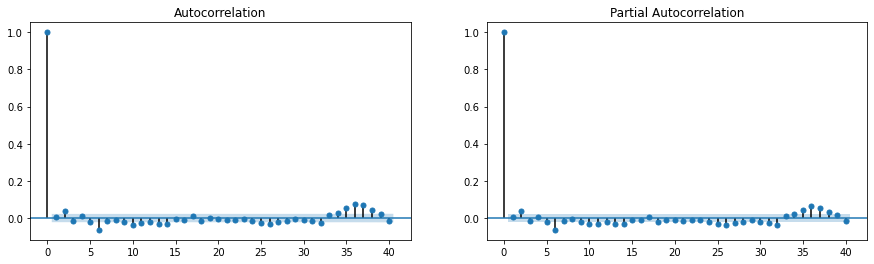

In [26]:
predecir_1(Res1,IG_Test.loc[:,['Sen_hora','Cos_hora']],Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
18096  14.3  1.211439         True        False        False
18097  14.6  0.554346        False        False        False
18098  14.6  0.256217        False        False        False
18099  14.3 -0.234289        False        False        False
18100  14.9  1.057554         True        False        False
...     ...       ...          ...          ...          ...
25846  16.5  0.075412        False        False        False
25847  16.9  0.756671        False        False        False
25848  16.7  0.257386        False        False        False
25849  16.5  0.312808        False        False        False
25850  15.9  0.036658        False        False        False

[7755 rows x 5 columns]
Promedio Valor Absoluto Error: 0.3852665227137147
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0     7.182463     0.825274     0.141844


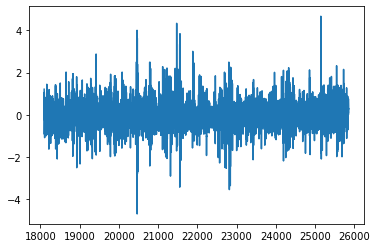

In [27]:
predecir_3(Res1,IG_Test.loc[:,['Sen_hora','Cos_hora']],Y_Test,limite)

In [47]:
#Comenzando denuevo:

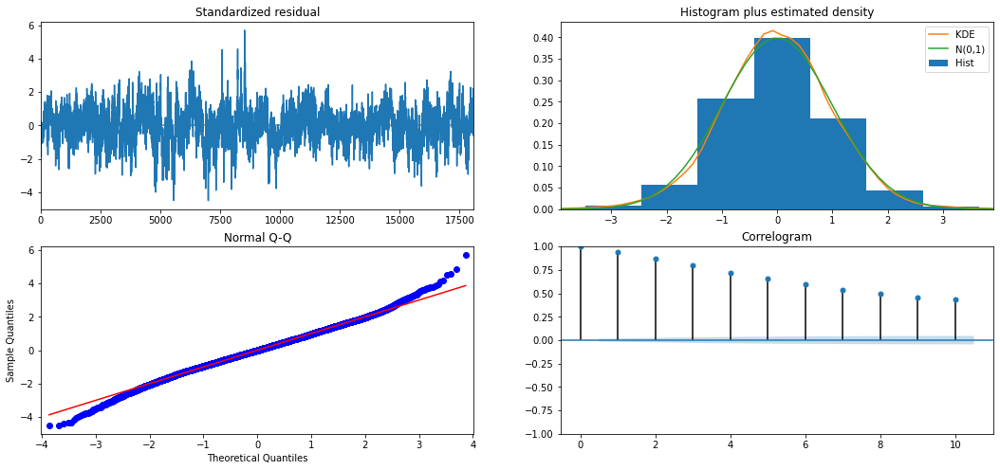

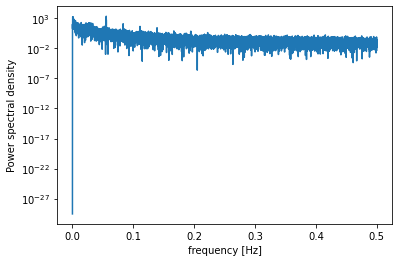

          freq          pow        delay
1005  0.055537  2117.730456    18.005970
18    0.000995  1676.318391  1005.333333
7     0.000387  1601.966428  2585.142857
9     0.000497  1558.413400  2010.666667
43    0.002376   696.527068   420.837209
6     0.000332   634.854196  3016.000000
19    0.001050   572.475920   952.421053
8     0.000442   570.541986  2262.000000
1007  0.055648   545.296337    17.970209
35    0.001934   544.075936   517.028571
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:                        SARIMAX   Log Likelihood              -35111.880
Date:                Fri, 09 Oct 2020   AIC                          70235.761
Time:                        20:48:26   BIC                          70282.581
Sample:                             0   HQIC                         70251.153
                              - 18096                                      

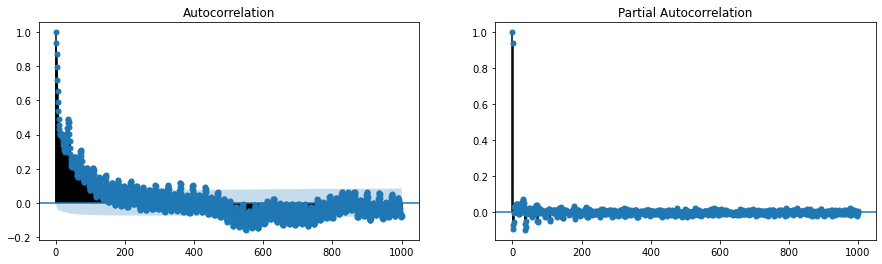

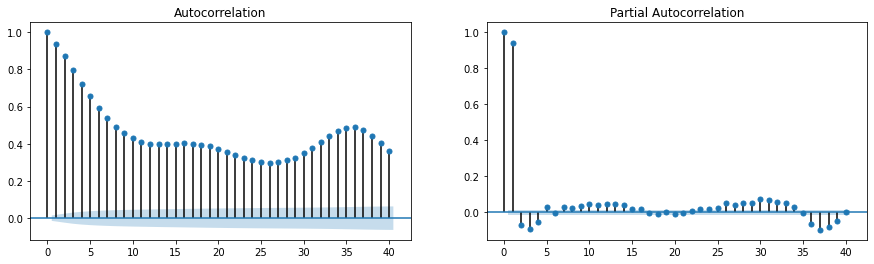

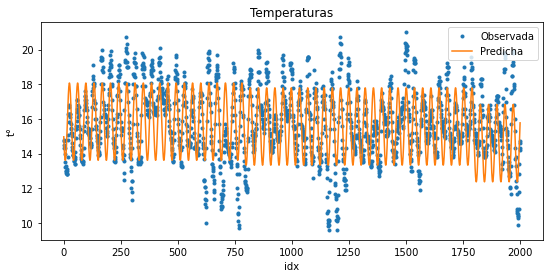

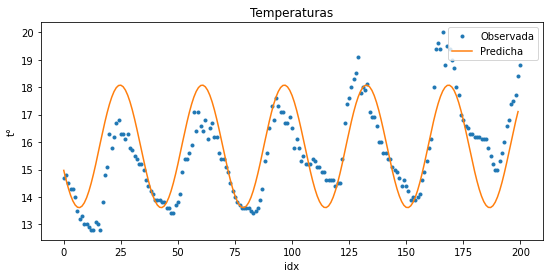

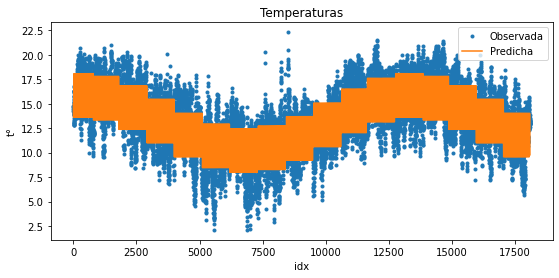

In [48]:
mysarimax(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [49]:
#AM o RA 1

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


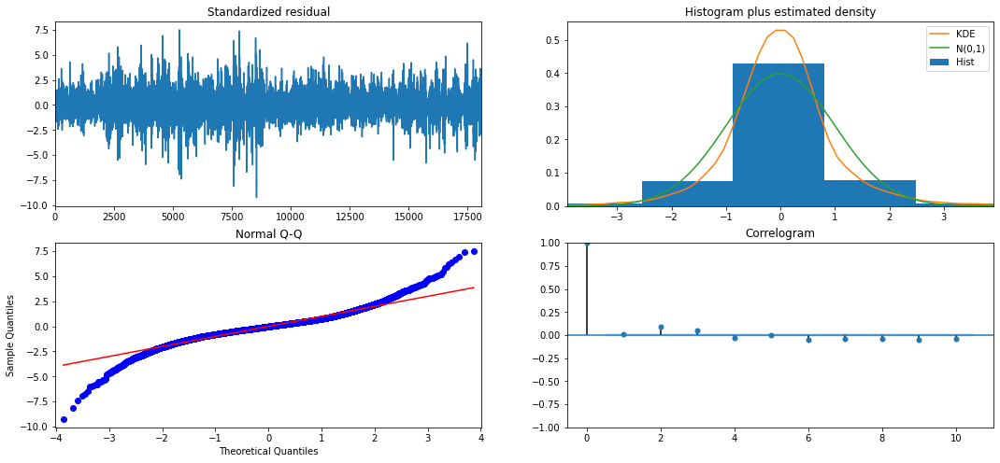

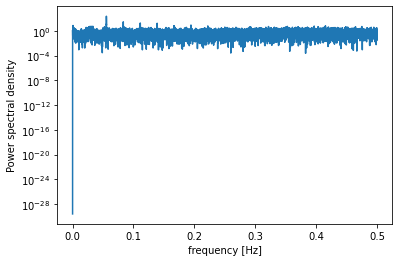

          freq         pow      delay
1005  0.055537  222.139113  18.005970
1007  0.055648   56.829161  17.970209
1507  0.083278   27.642795  12.007963
1506  0.083223   19.305951  12.015936
1008  0.055703   18.213099  17.952381
2010  0.111074   17.043379   9.002985
1510  0.083444   16.489583  11.984106
2515  0.138981   16.234324   7.195229
2013  0.111240   15.472016   8.989568
2512  0.138815   12.675958   7.203822
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:               SARIMAX(1, 0, 1)   Log Likelihood              -15894.416
Date:                Fri, 09 Oct 2020   AIC                          31804.833
Time:                        20:48:59   BIC                          31867.260
Sample:                             0   HQIC                         31825.356
                              - 18096                                         
Covariance Type:             

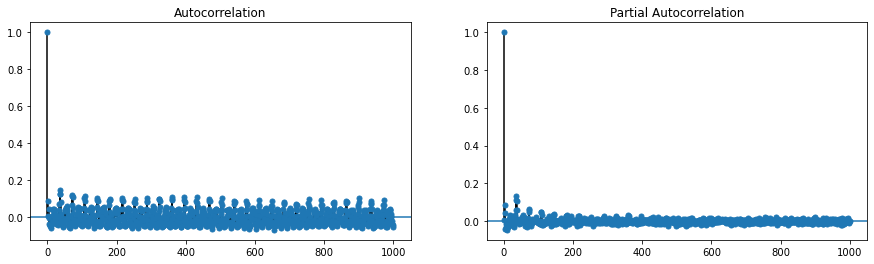

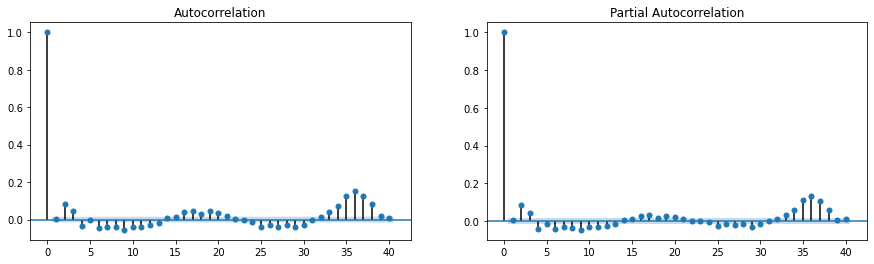

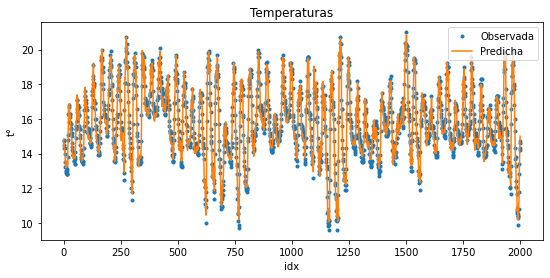

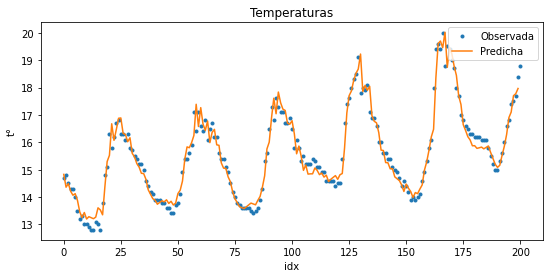

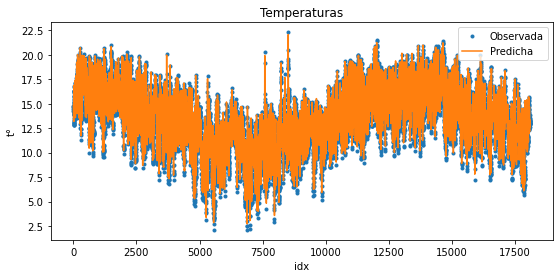

In [50]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [51]:
# Retirando x3

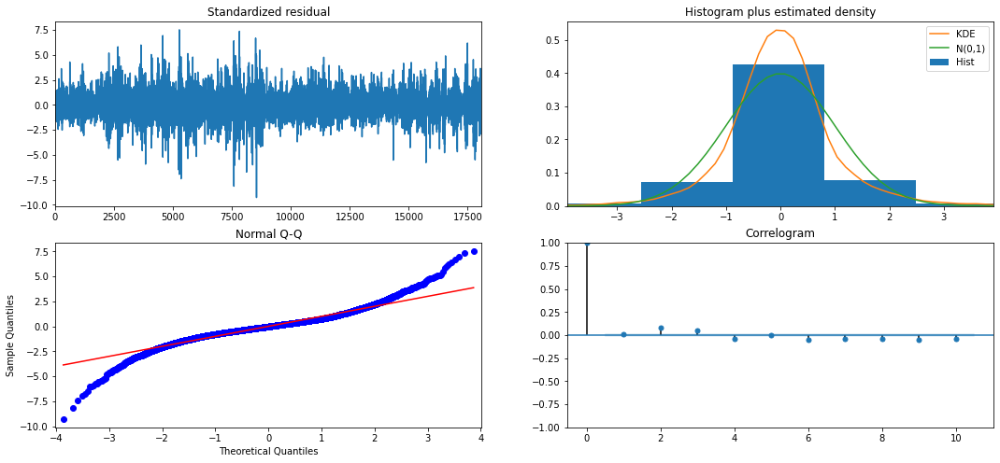

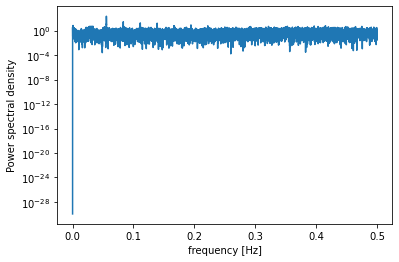

          freq         pow      delay
1005  0.055537  222.264037  18.005970
1007  0.055648   56.809723  17.970209
1507  0.083278   27.619879  12.007963
1506  0.083223   19.278170  12.015936
1008  0.055703   18.211183  17.952381
2010  0.111074   17.088934   9.002985
1510  0.083444   16.466913  11.984106
2515  0.138981   16.197223   7.195229
2013  0.111240   15.514477   8.989568
2512  0.138815   12.648999   7.203822
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:               SARIMAX(1, 0, 1)   Log Likelihood              -15896.356
Date:                Fri, 09 Oct 2020   AIC                          31806.712
Time:                        20:49:25   BIC                          31861.336
Sample:                             0   HQIC                         31824.670
                              - 18096                                         
Covariance Type:             

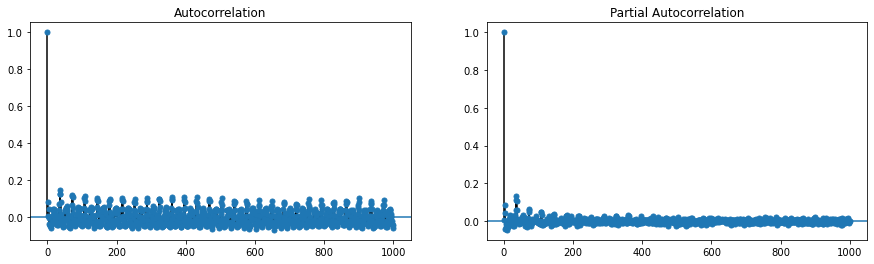

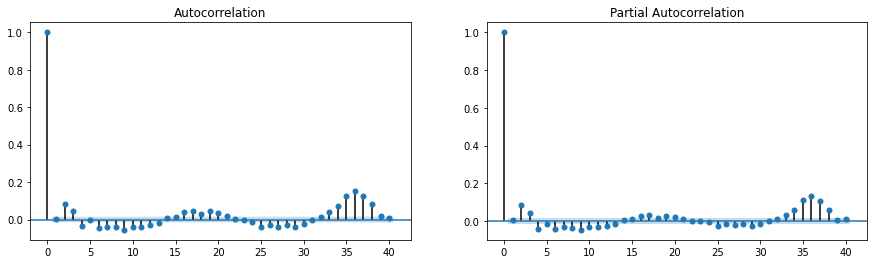

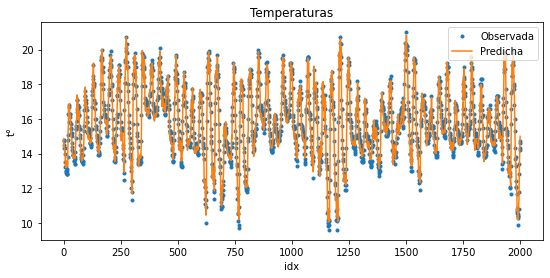

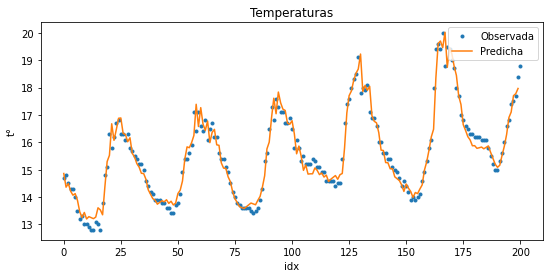

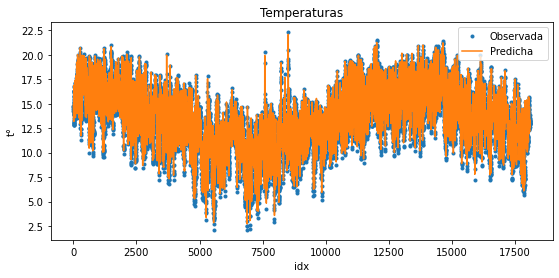

In [52]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

In [53]:
#AR o mA 24

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


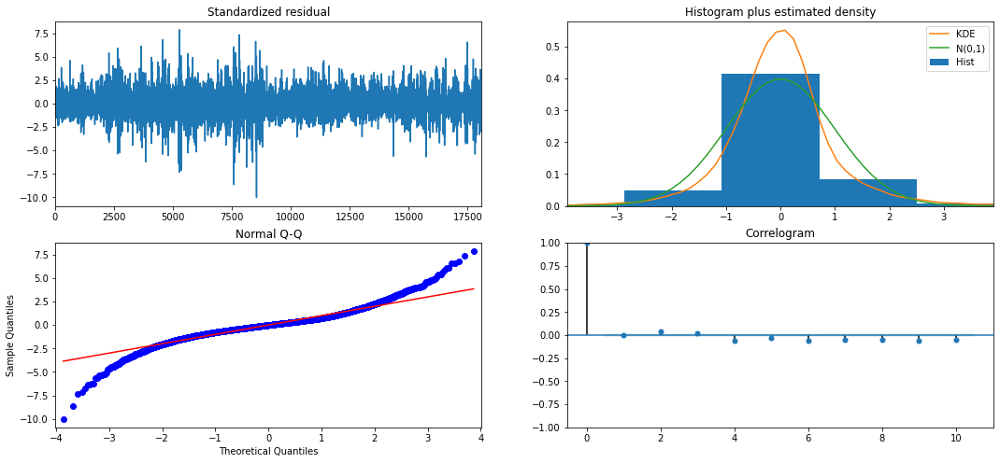

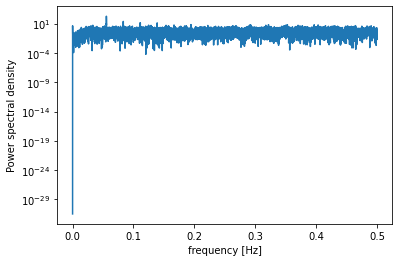

          freq         pow      delay
1005  0.055537  178.987016  18.005970
1007  0.055648   45.913052  17.970209
1507  0.083278   23.449281  12.007963
1506  0.083223   15.909023  12.015936
1008  0.055703   14.193614  17.952381
2010  0.111074   13.433735   9.002985
1510  0.083444   13.090148  11.984106
2515  0.138981   12.859496   7.195229
2013  0.111240   12.609070   8.989568
2512  0.138815   10.447343   7.203822
                                      SARIMAX Results                                      
Dep. Variable:                                  ts   No. Observations:                18096
Model:             SARIMAX(1, 0, 1)x(1, 0, [], 36)   Log Likelihood              -15897.128
Date:                             Sat, 10 Oct 2020   AIC                          31810.256
Time:                                     22:02:06   BIC                          31872.684
Sample:                                          0   HQIC                         31830.780
                              

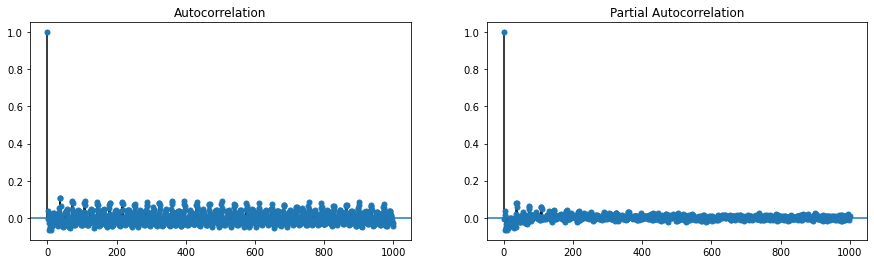

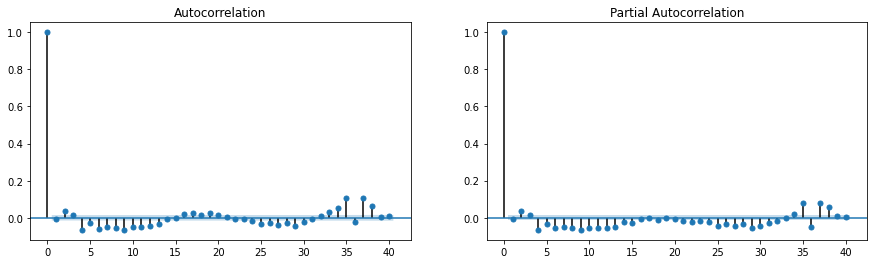

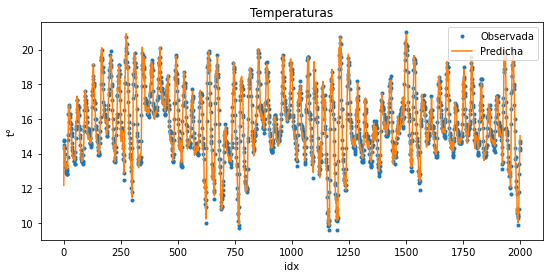

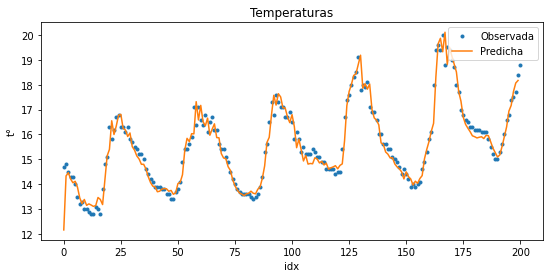

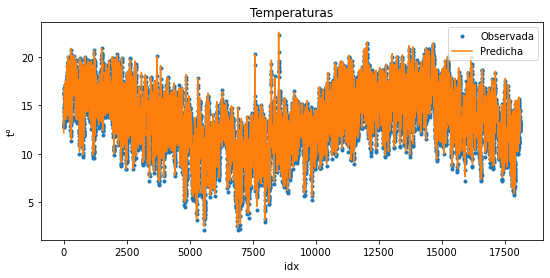

In [21]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(1,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

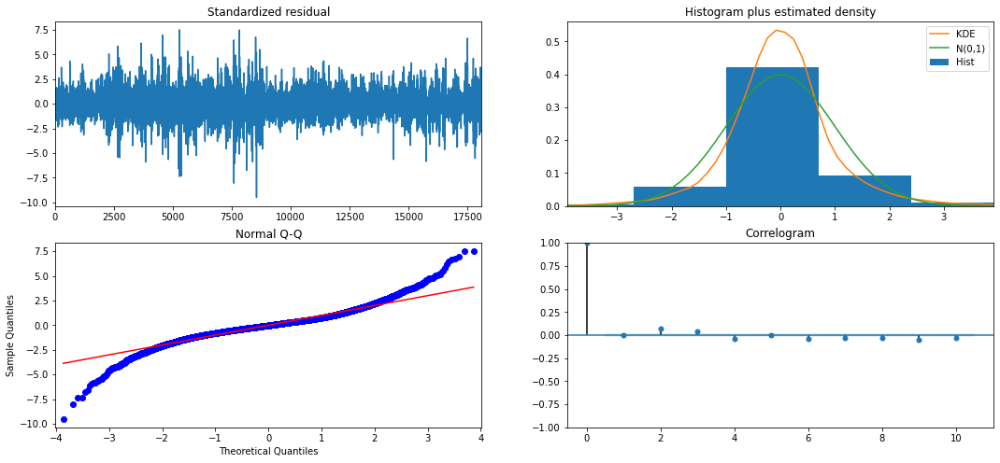

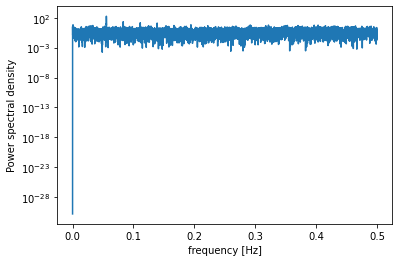

          freq         pow      delay
1005  0.055537  180.956638  18.005970
1007  0.055648   46.269285  17.970209
1507  0.083278   22.403809  12.007963
1506  0.083223   15.639825  12.015936
1008  0.055703   14.821367  17.952381
2010  0.111074   13.788869   9.002985
1510  0.083444   13.357585  11.984106
2515  0.138981   12.999947   7.195229
2013  0.111240   12.506231   8.989568
2512  0.138815   10.149270   7.203822
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 0, 1)x(0, 0, 1, 36)   Log Likelihood              -15716.527
Date:                            Sat, 10 Oct 2020   AIC                          31449.054
Time:                                    22:09:15   BIC                          31511.481
Sample:                                         0   HQIC                         31469.577
                                    

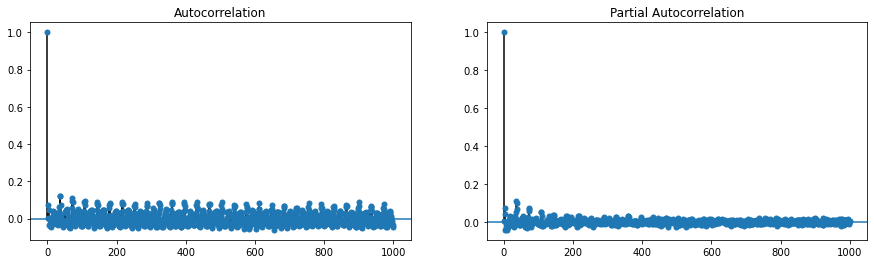

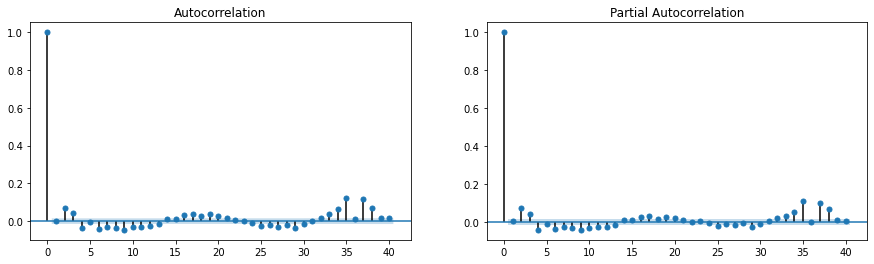

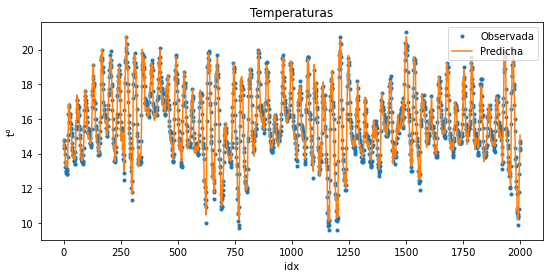

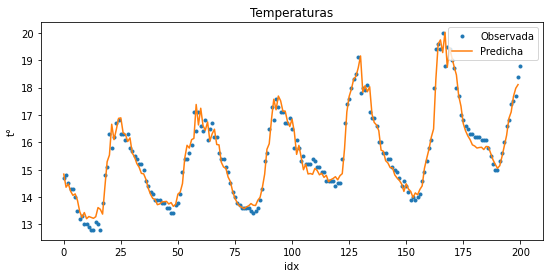

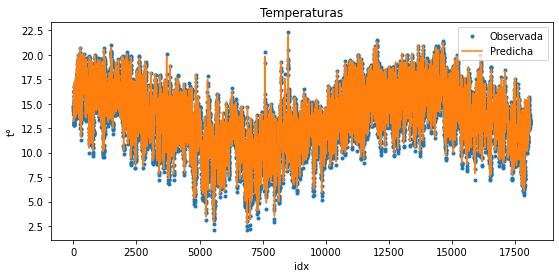

In [22]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(0,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

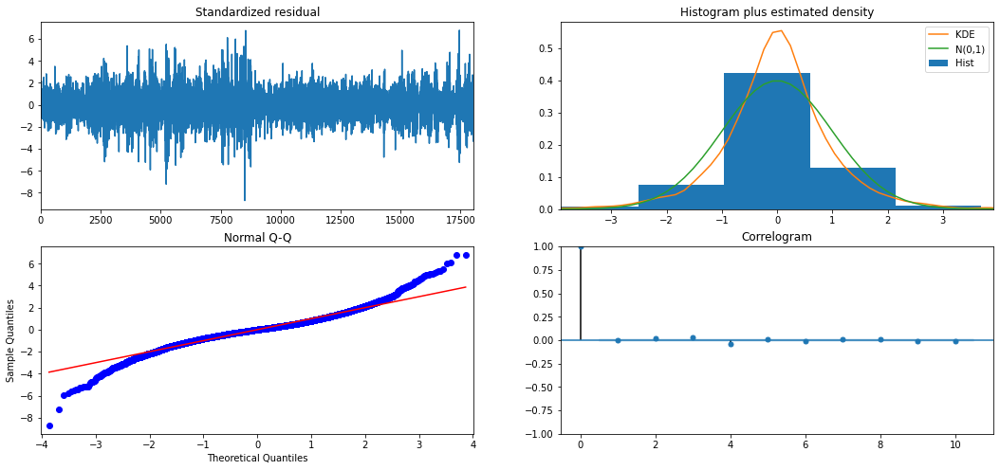

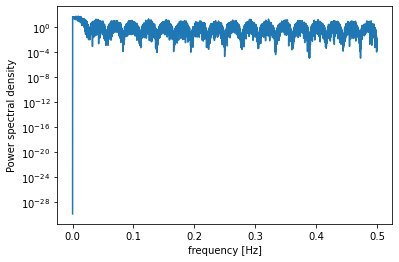

         freq        pow       delay
175  0.009671  50.644210  103.405714
108  0.005968  48.929621  167.555556
148  0.008179  47.927033  122.270270
106  0.005858  46.720551  170.716981
87   0.004808  45.618387  208.000000
233  0.012876  45.397267   77.665236
91   0.005029  44.440009  198.857143
58   0.003205  43.431634  312.000000
71   0.003924  43.211226  254.873239
113  0.006244  42.554219  160.141593
                                      SARIMAX Results                                      
Dep. Variable:                                  ts   No. Observations:                18096
Model:             SARIMAX(1, 0, 1)x(0, 1, [], 36)   Log Likelihood              -20395.928
Date:                             Sat, 10 Oct 2020   AIC                          40805.855
Time:                                     22:13:14   BIC                          40860.466
Sample:                                          0   HQIC                         40823.811
                                         

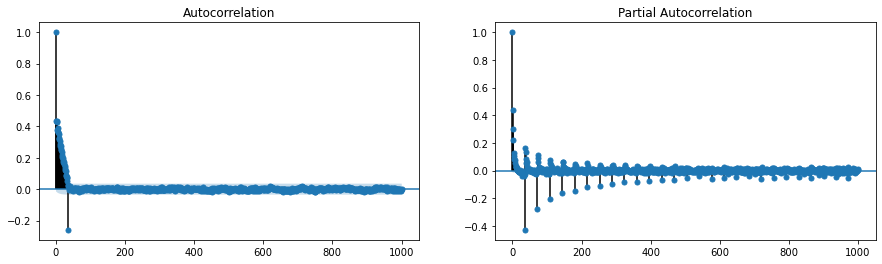

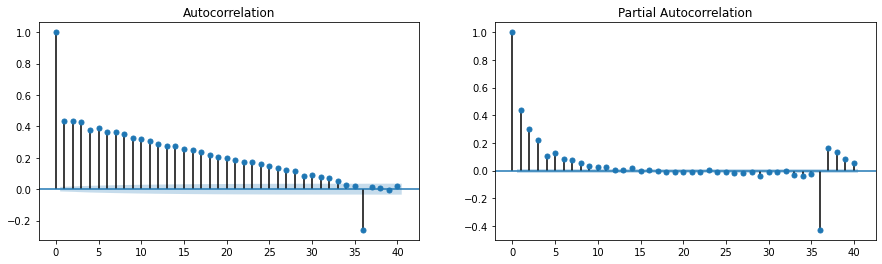

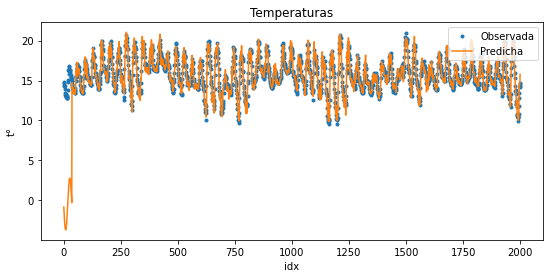

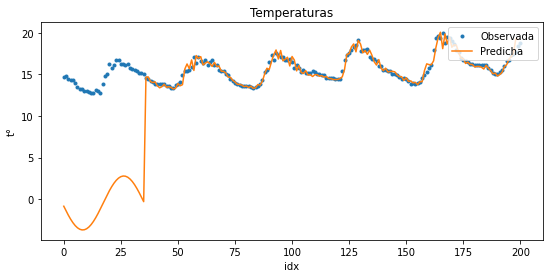

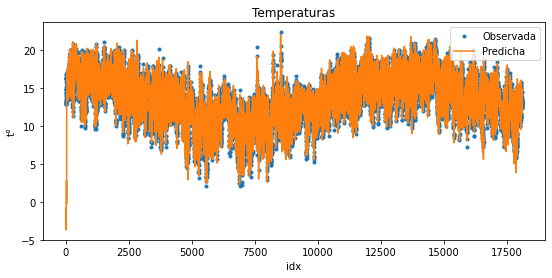

In [23]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(0,1,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


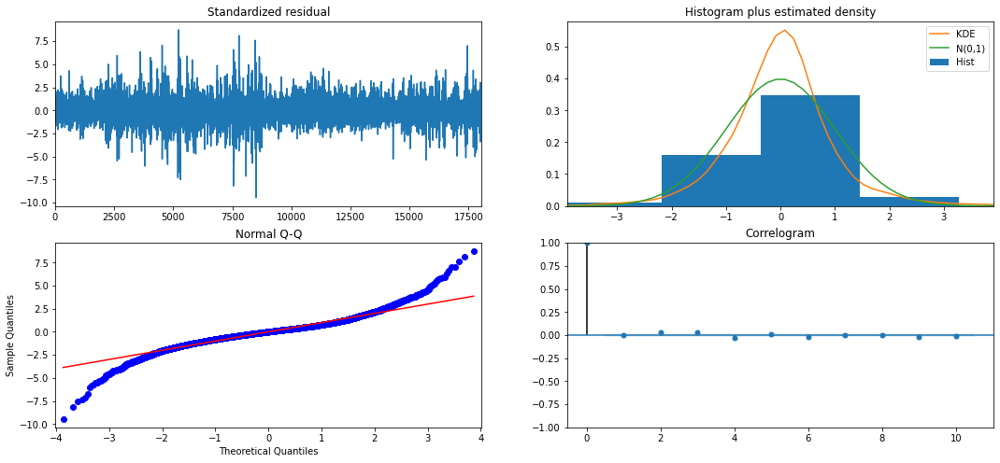

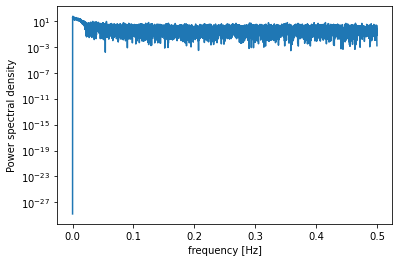

        freq        pow        delay
9   0.000497  52.675359  2010.666667
12  0.000663  42.870546  1508.000000
17  0.000939  40.348622  1064.470588
35  0.001934  39.635169   517.028571
18  0.000995  39.367807  1005.333333
26  0.001437  38.853463   696.000000
2   0.000111  37.746938  9048.000000
20  0.001105  37.238754   904.800000
36  0.001989  35.578967   502.666667
51  0.002818  35.059744   354.823529
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 0, 1)x(0, 1, 1, 36)   Log Likelihood              -15149.891
Date:                            Sun, 11 Oct 2020   AIC                          30315.781
Time:                                    11:35:00   BIC                          30378.193
Sample:                                         0   HQIC                         30336.302
                                          - 180

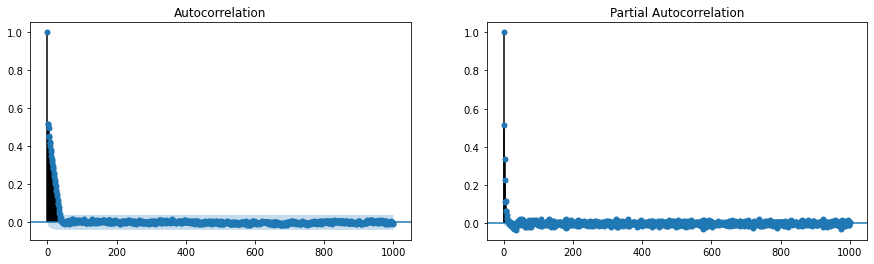

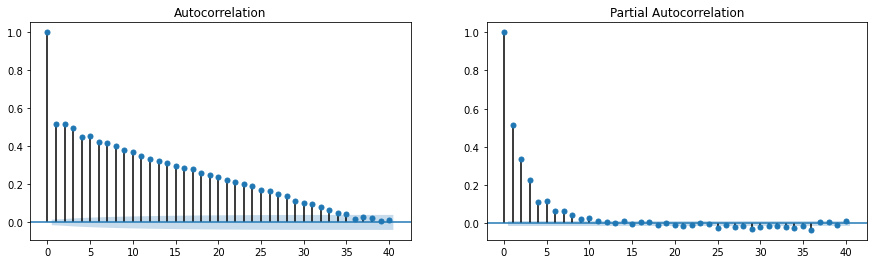

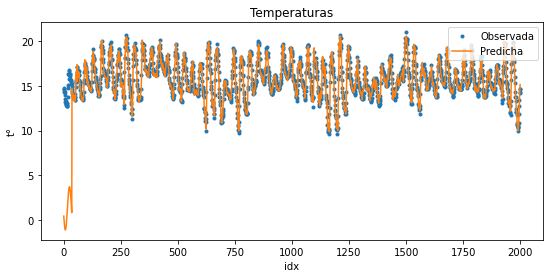

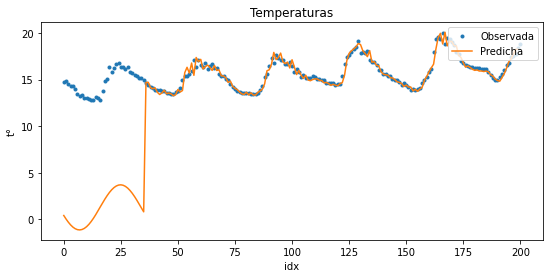

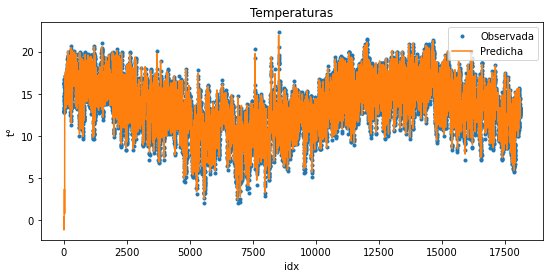

In [31]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(0,1,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

In [ ]:
#Estacionalidad 12 horas

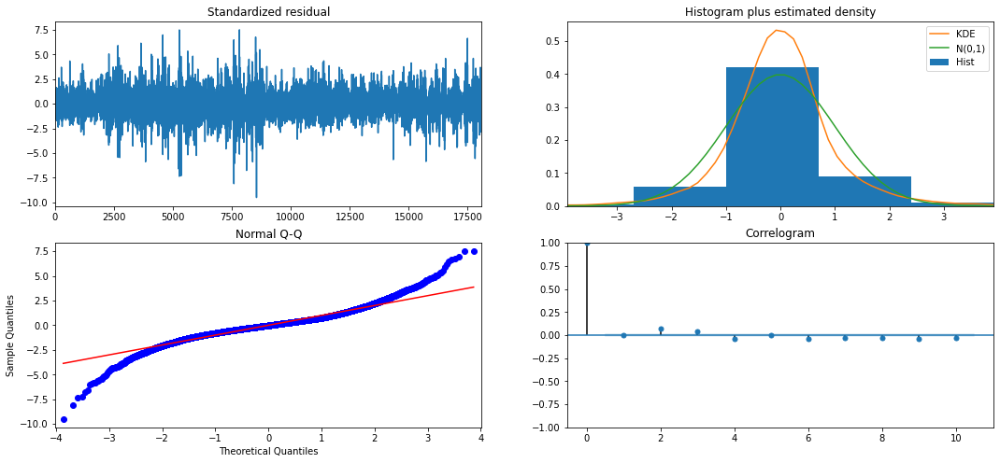

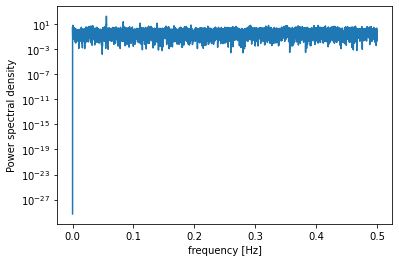

          freq         pow      delay
1005  0.055537  174.573051  18.005970
1007  0.055648   44.652587  17.970209
1507  0.083278   23.317778  12.007963
1506  0.083223   16.276899  12.015936
1008  0.055703   14.301748  17.952381
1510  0.083444   13.901927  11.984106
2515  0.138981   13.525040   7.195229
2010  0.111074   13.293663   9.002985
2013  0.111240   12.053300   8.989568
2512  0.138815   10.559653   7.203822
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                18096
Model:             SARIMAX(1, 0, 1)x(0, 0, [1, 2], 18)   Log Likelihood              -15712.377
Date:                                 Sun, 11 Oct 2020   AIC                          31442.754
Time:                                         12:26:58   BIC                          31512.985
Sample:                                              0   HQIC                         31465.844
      

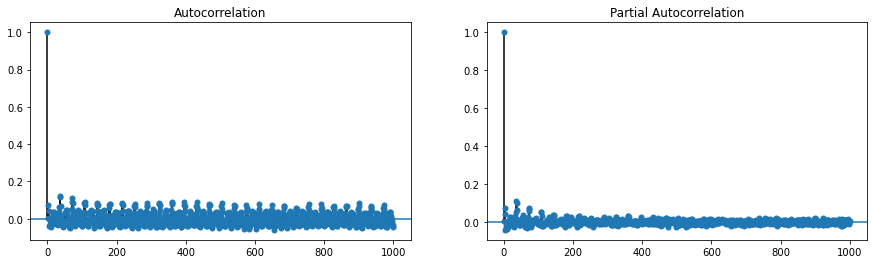

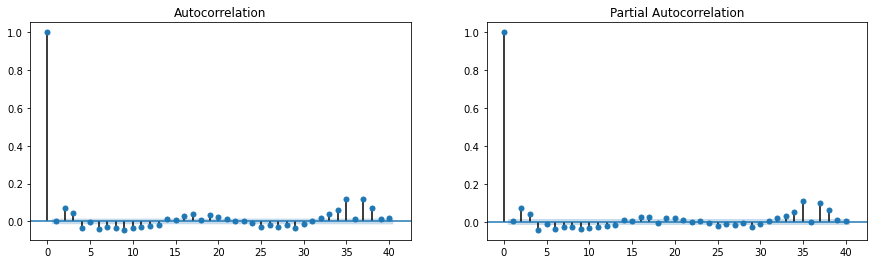

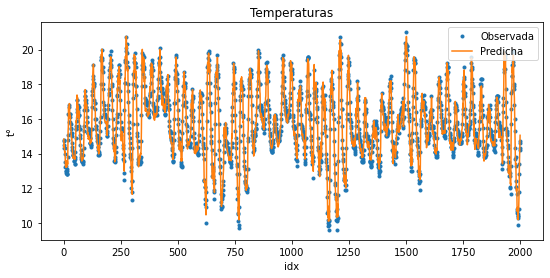

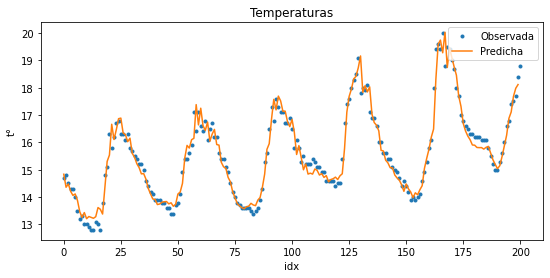

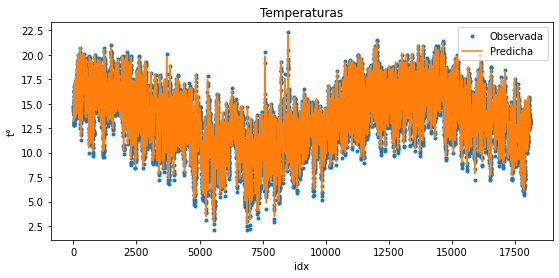

In [32]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(0,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


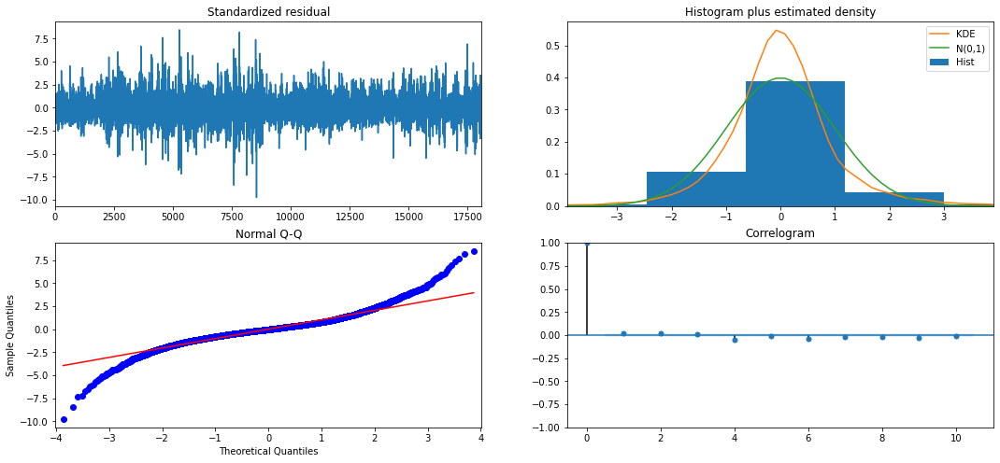

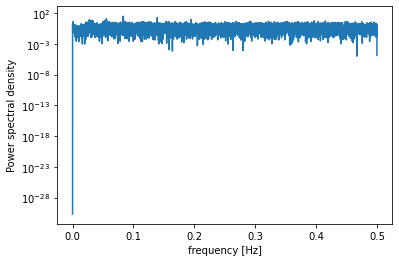

          freq        pow      delay
1507  0.083278  30.753547  12.007963
1506  0.083223  21.883464  12.015936
1510  0.083444  19.135992  11.984106
2515  0.138981  17.952749   7.195229
2512  0.138815  13.657138   7.203822
1005  0.055537  12.216434  18.005970
2516  0.139036  12.111824   7.192369
3519  0.194463   8.701161   5.142370
2510  0.138705   8.658582   7.209562
502   0.027741   8.338813  36.047809
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                18096
Model:             SARIMAX(1, 0, 1)x(1, 0, [1, 2], 18)   Log Likelihood              -15411.303
Date:                                 Sun, 11 Oct 2020   AIC                          30842.606
Time:                                         12:35:20   BIC                          30920.640
Sample:                                              0   HQIC                         30868.260
                 

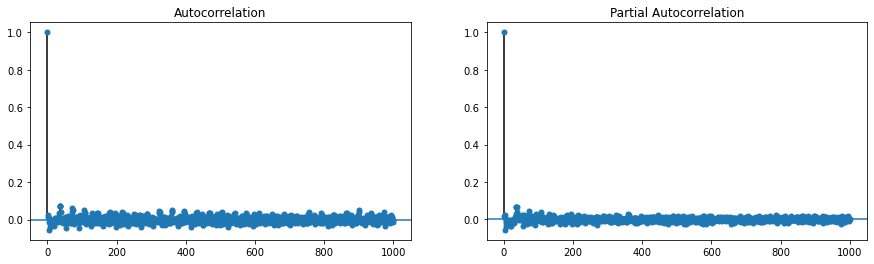

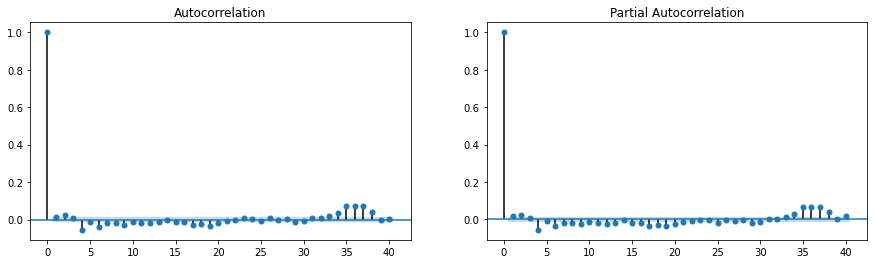

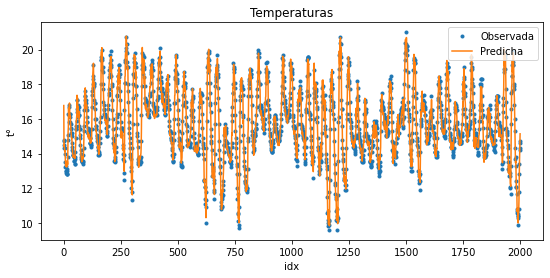

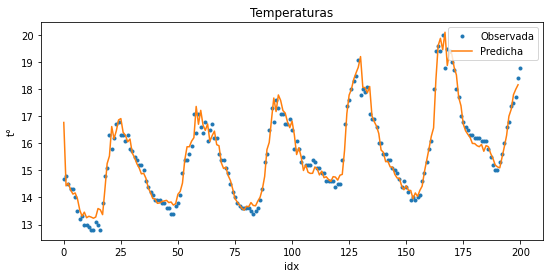

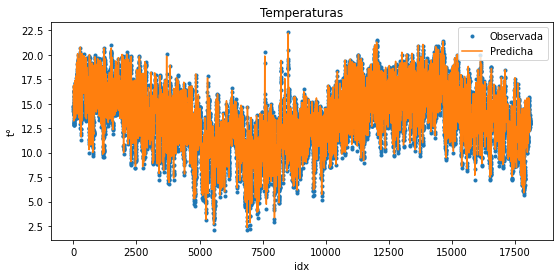

In [33]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(1,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

In [ ]:
#Aumentando el grado:

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


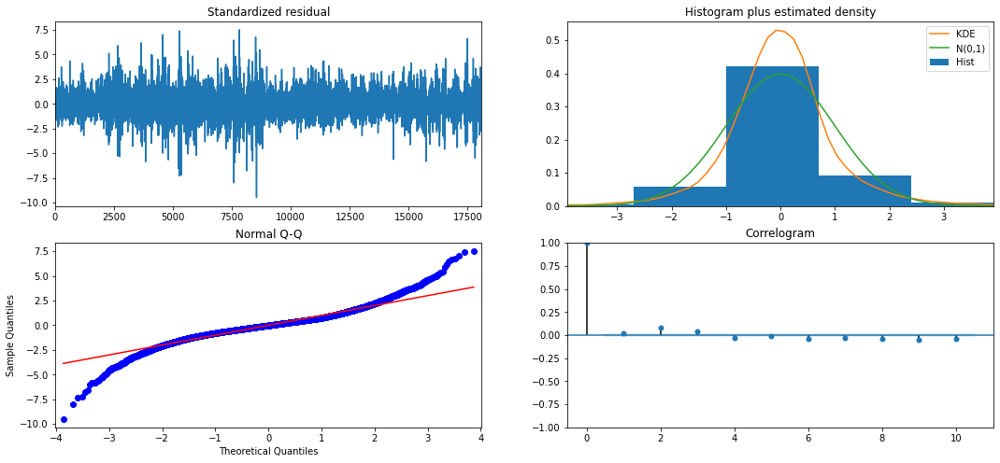

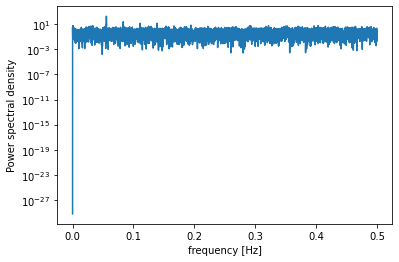

          freq         pow      delay
1005  0.055537  182.809735  18.005970
1007  0.055648   46.758923  17.970209
1507  0.083278   24.377886  12.007963
1506  0.083223   17.015234  12.015936
1008  0.055703   14.976483  17.952381
1510  0.083444   14.530624  11.984106
2515  0.138981   13.936070   7.195229
2010  0.111074   13.801415   9.002985
2013  0.111240   12.513658   8.989568
2512  0.138815   10.882796   7.203822
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                18096
Model:             SARIMAX(2, 0, 1)x(0, 0, [1, 2], 18)   Log Likelihood              -15722.288
Date:                                 Sun, 11 Oct 2020   AIC                          31464.576
Time:                                         16:25:20   BIC                          31542.610
Sample:                                              0   HQIC                         31490.230
      

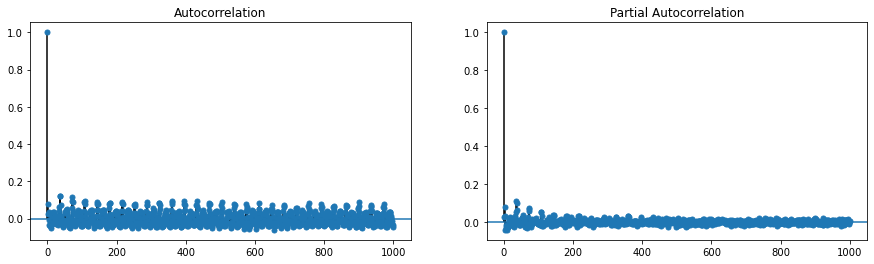

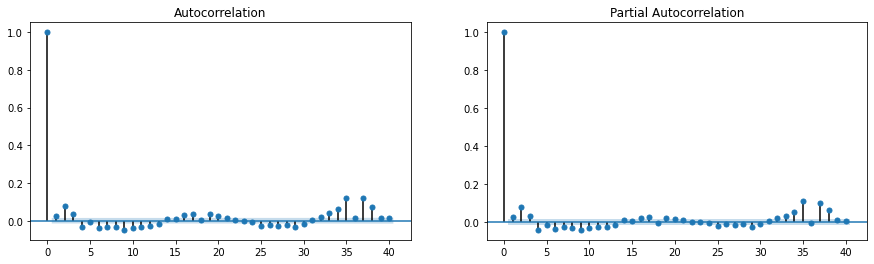

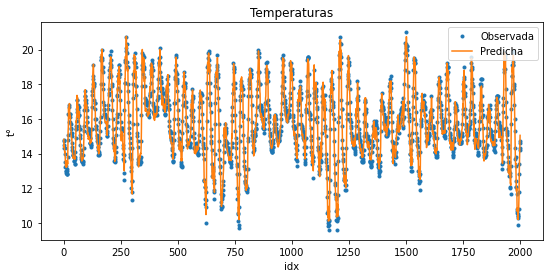

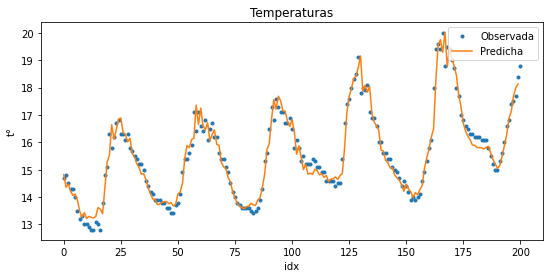

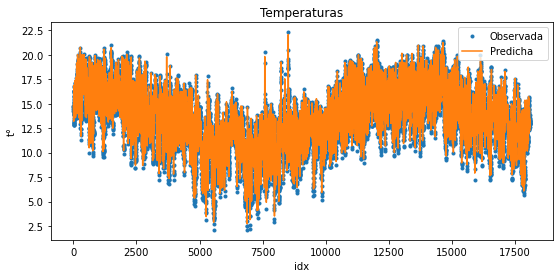

In [36]:
mysarimax(Y=Y_Ajuste,
         order=(2,0,1),
         seasonal_order=(0,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

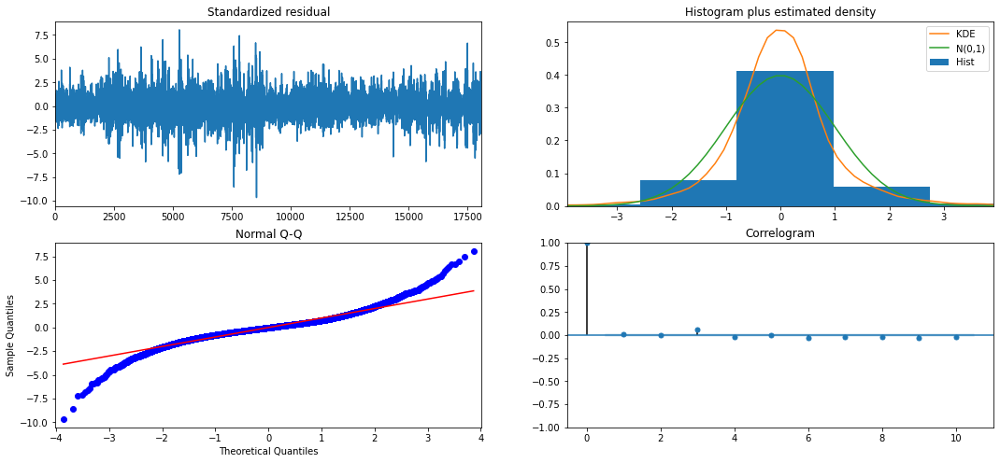

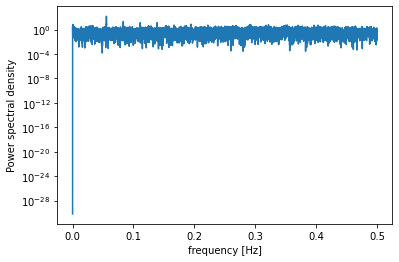

          freq         pow      delay
1005  0.055537  154.861792  18.005970
1007  0.055648   39.614702  17.970209
1507  0.083278   21.281418  12.007963
1506  0.083223   14.856996  12.015936
2515  0.138981   13.673330   7.195229
2010  0.111074   12.726730   9.002985
1510  0.083444   12.694790  11.984106
1008  0.055703   12.686640  17.952381
2013  0.111240   11.543907   8.989568
2512  0.138815   10.668408   7.203822
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 0, 2)x(0, 0, 2, 18)   Log Likelihood              -15658.379
Date:                            Sun, 11 Oct 2020   AIC                          31336.758
Time:                                    16:34:40   BIC                          31414.792
Sample:                                         0   HQIC                         31362.412
                                    

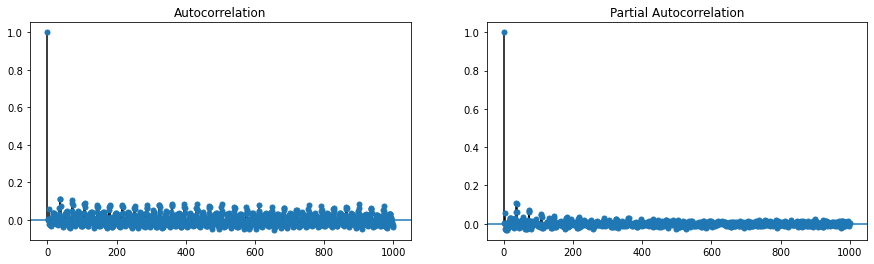

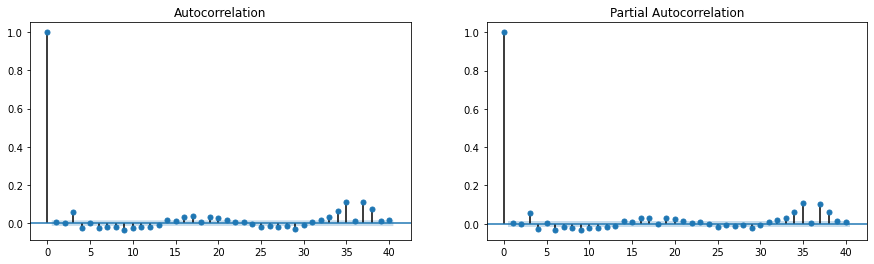

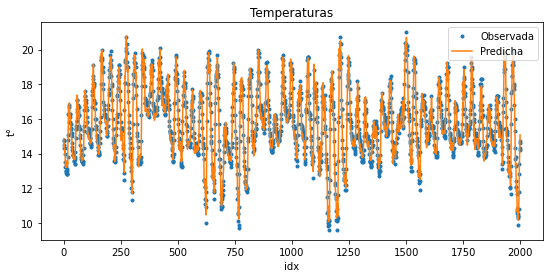

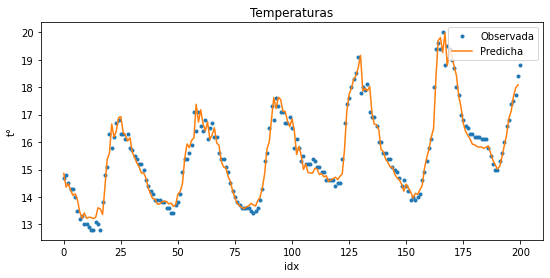

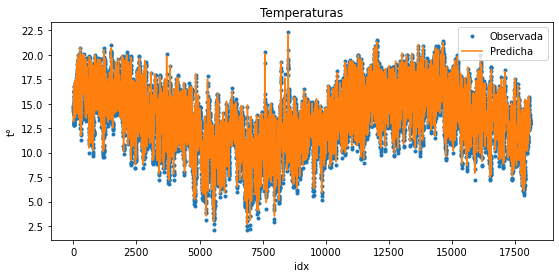

In [37]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,2),
         seasonal_order=(0,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

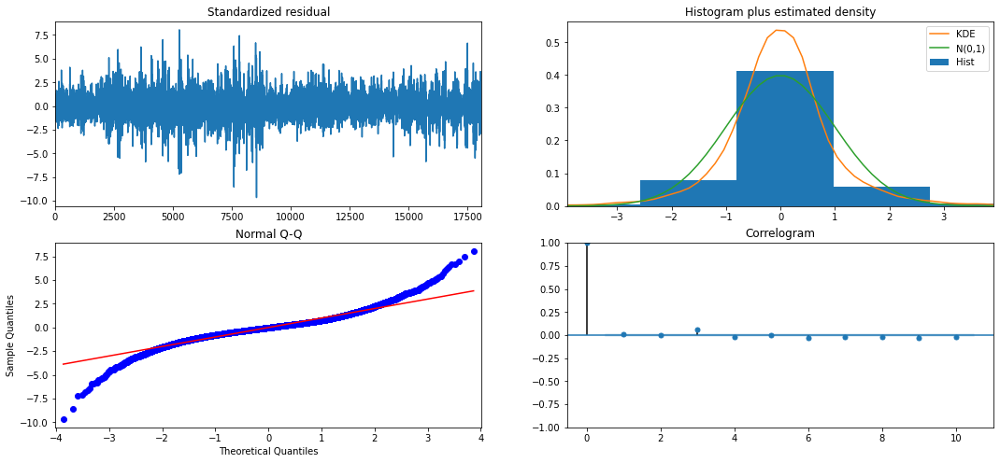

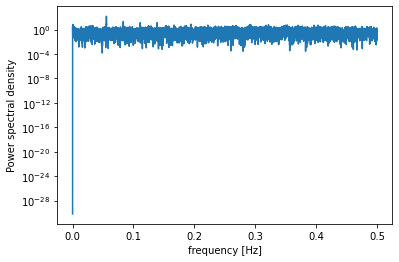

          freq         pow      delay
1005  0.055537  154.861792  18.005970
1007  0.055648   39.614702  17.970209
1507  0.083278   21.281418  12.007963
1506  0.083223   14.856996  12.015936
2515  0.138981   13.673330   7.195229
2010  0.111074   12.726730   9.002985
1510  0.083444   12.694790  11.984106
1008  0.055703   12.686640  17.952381
2013  0.111240   11.543907   8.989568
2512  0.138815   10.668408   7.203822
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 0, 2)x(0, 0, 2, 18)   Log Likelihood              -15658.379
Date:                            Tue, 17 Nov 2020   AIC                          31336.758
Time:                                    12:00:09   BIC                          31414.792
Sample:                                         0   HQIC                         31362.412
                                    

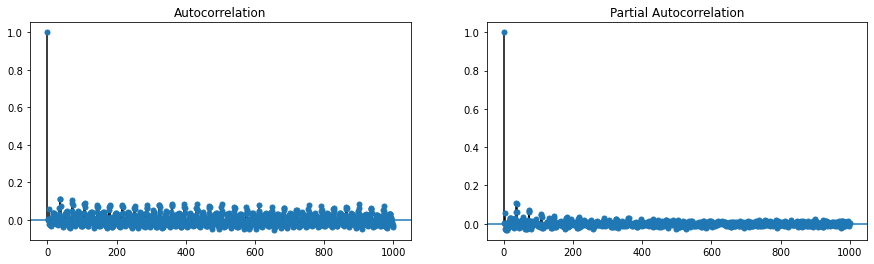

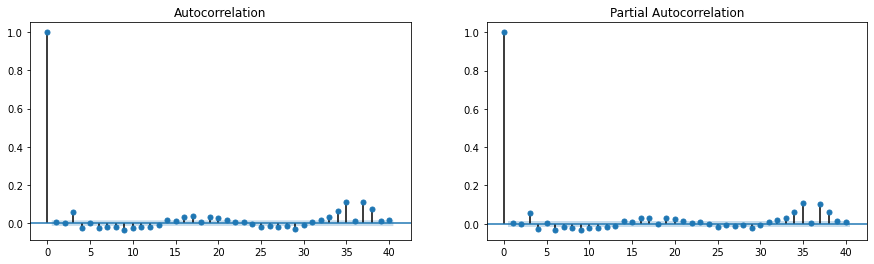

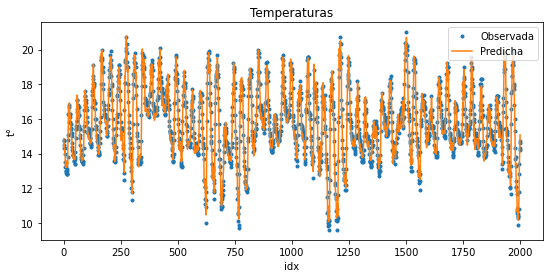

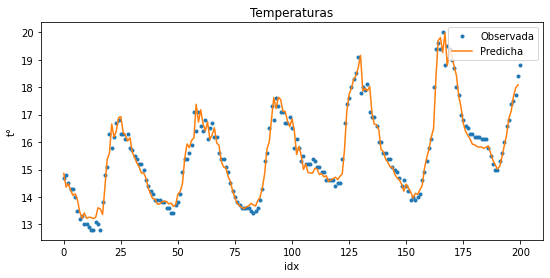

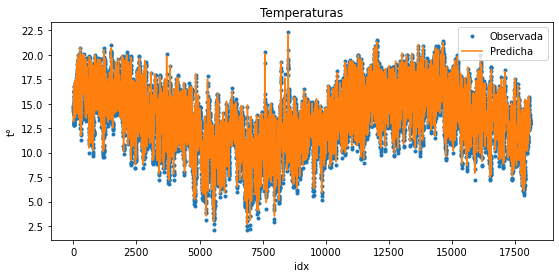

In [28]:
Res2=mysarimax(Y=Y_Ajuste,
         order=(1,0,2),
         seasonal_order=(0,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora','Cos_Mes']])

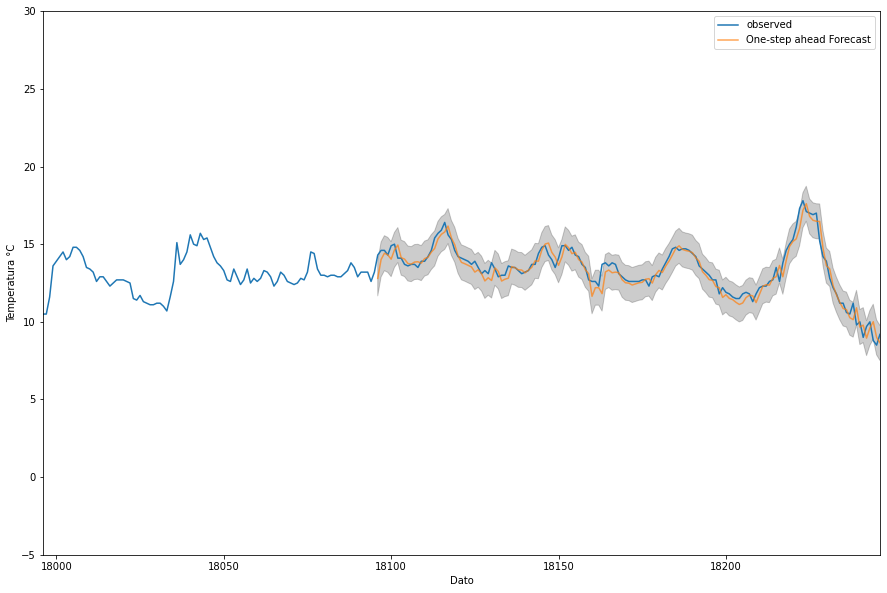

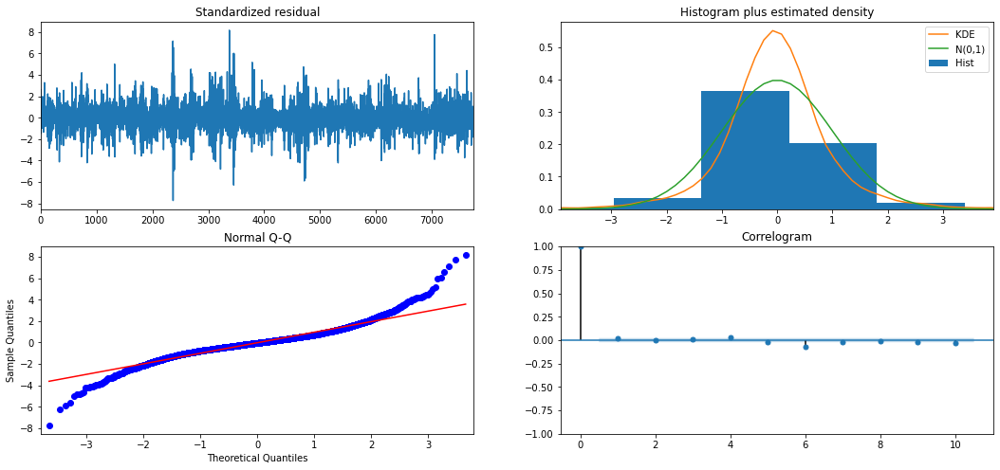

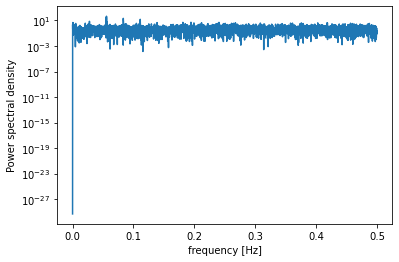

                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                 7755
Model:             SARIMAX(1, 0, 2)x(0, 0, 2, 18)   Log Likelihood               -6597.564
Date:                            Tue, 17 Nov 2020   AIC                          13215.128
Time:                                    12:00:22   BIC                          13284.689
Sample:                                         0   HQIC                         13238.975
                                           - 7755                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.0922      0.039     27.682      0.000       1.015       1.170
Sen_hora      -1.5428      0.029   

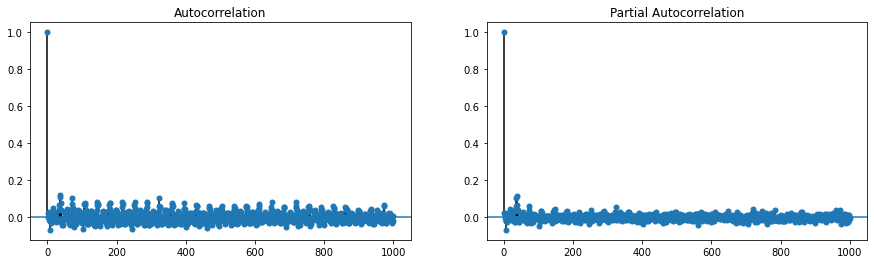

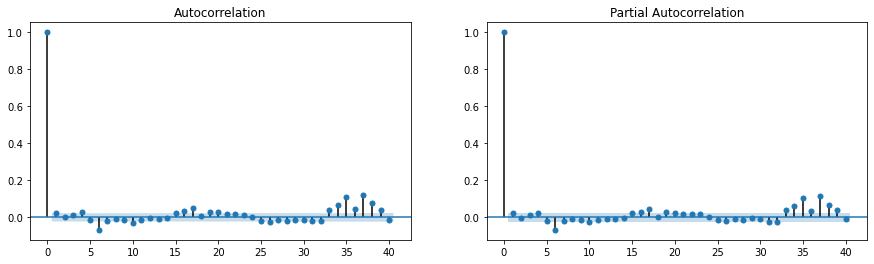

In [29]:
predecir_1(Res2,IG_Test.loc[:,['Sen_hora','Cos_hora','Cos_Mes']],Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
18096  14.3  1.501643         True        False        False
18097  14.6  0.584831        False        False        False
18098  14.6  0.180875        False        False        False
18099  14.3 -0.008667        False        False        False
18100  14.9  0.865412        False        False        False
...     ...       ...          ...          ...          ...
25846  16.5  0.032874        False        False        False
25847  16.9  0.500861        False        False        False
25848  16.7  0.042822        False        False        False
25849  16.5  0.055634        False        False        False
25850  15.9 -0.208826        False        False        False

[7755 rows x 5 columns]
Promedio Valor Absoluto Error: 0.3949997192218843
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0     7.466151     0.928433     0.128949


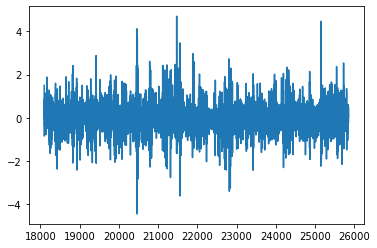

In [30]:
predecir_3(Res2,IG_Test.loc[:,['Sen_hora','Cos_hora','Cos_Mes']],Y_Test,limite)

In [69]:
#Comenzamos denuevo Esta vez sin sinusoides. 

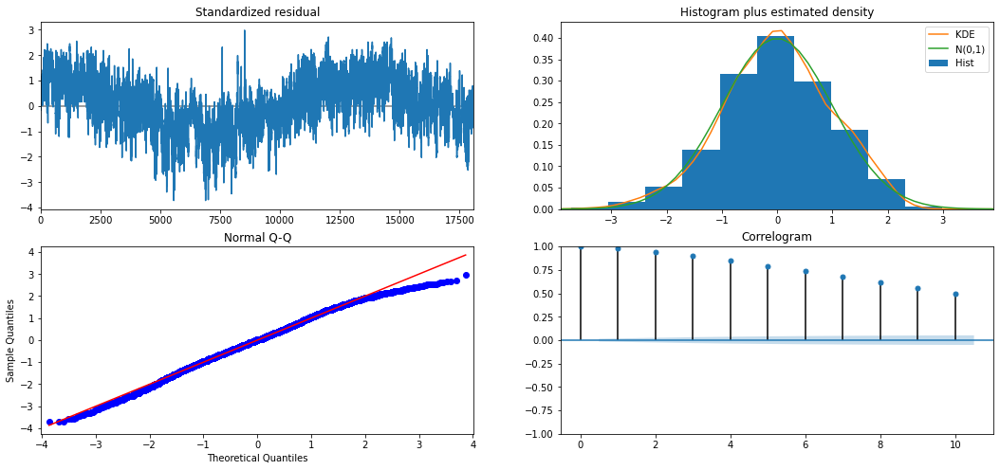

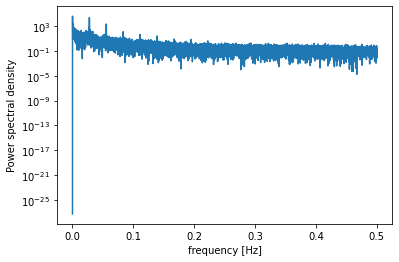

          freq           pow         delay
1     0.000055  38835.442482  18096.000000
502   0.027741  22789.603892     36.047809
2     0.000111  22159.472015   9048.000000
503   0.027796  10348.272030     35.976143
501   0.027686   4445.507034     36.119760
3     0.000166   3594.521679   6032.000000
9     0.000497   2728.523200   2010.666667
7     0.000387   2217.584244   2585.142857
1005  0.055537   2164.771702     18.005970
4     0.000221   1903.206300   4524.000000
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:                        SARIMAX   Log Likelihood              -45636.031
Date:                Fri, 09 Oct 2020   AIC                          91276.061
Time:                        22:00:29   BIC                          91291.668
Sample:                             0   HQIC                         91281.192
                              - 18096                

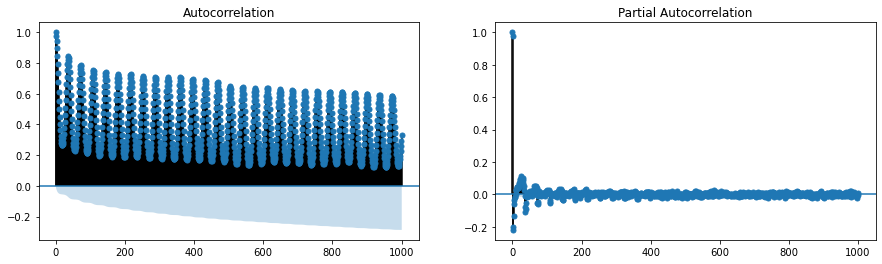

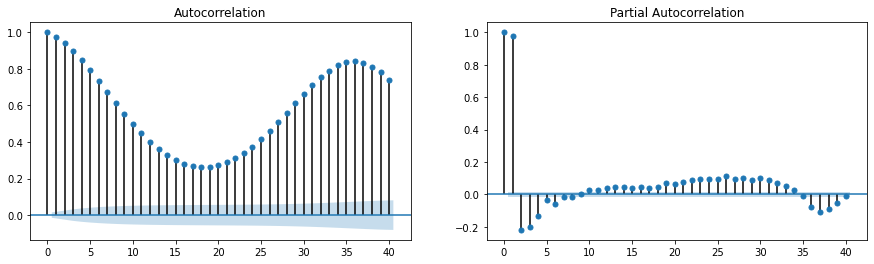

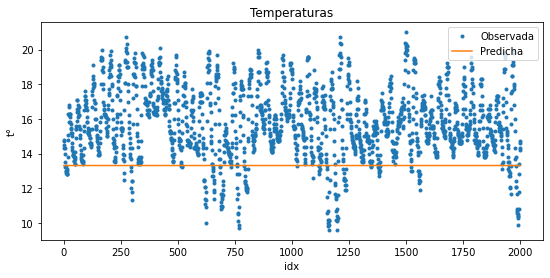

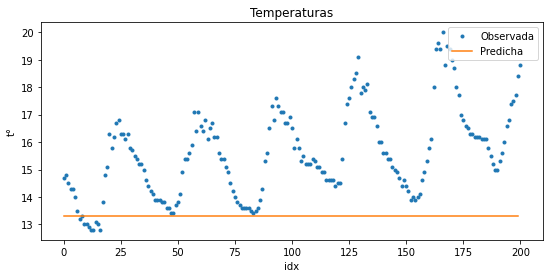

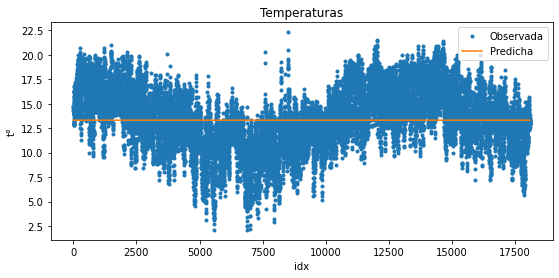

In [70]:
mysarima(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,0,0,60*24/Intervalo))

In [71]:
#ANalicis Espectral

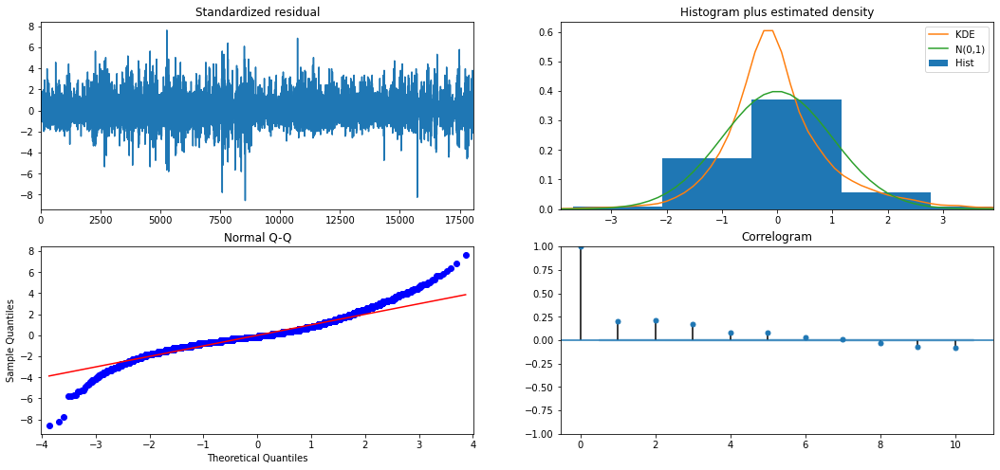

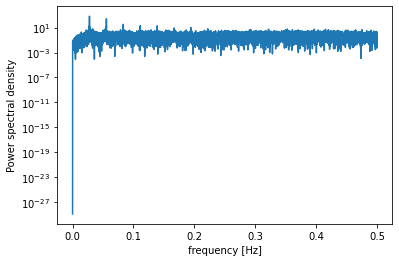

          freq         pow      delay
502   0.027741  691.974292  36.047809
503   0.027796  311.000707  35.976143
1005  0.055537  264.764735  18.005970
501   0.027686  131.723113  36.119760
1007  0.055648   64.285935  17.970209
504   0.027851   55.882325  35.904762
505   0.027907   38.891110  35.833663
506   0.027962   34.859906  35.762846
1507  0.083278   34.624372  12.007963
1506  0.083223   23.506573  12.015936
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:               SARIMAX(0, 1, 0)   Log Likelihood              -18010.500
Date:                Fri, 09 Oct 2020   AIC                          36025.000
Time:                        22:00:44   BIC                          36040.607
Sample:                             0   HQIC                         36030.131
                              - 18096                                         
Covariance Type:             

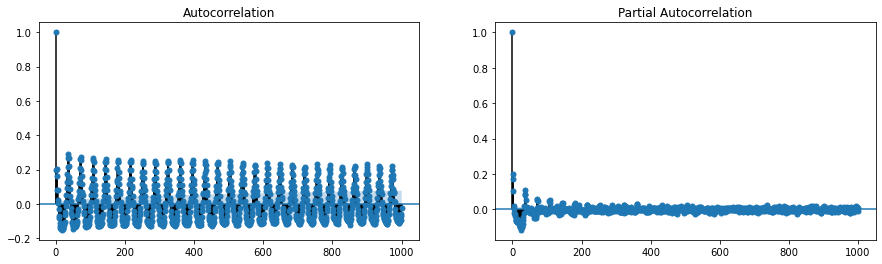

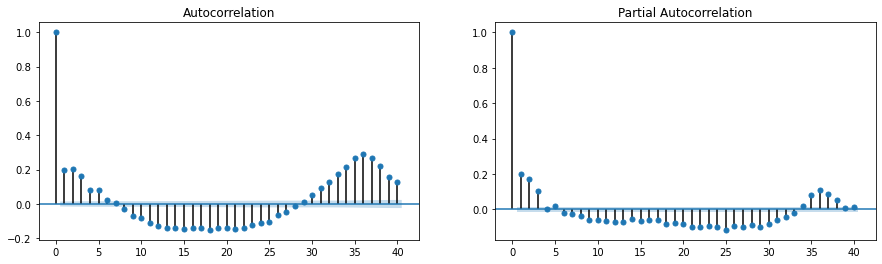

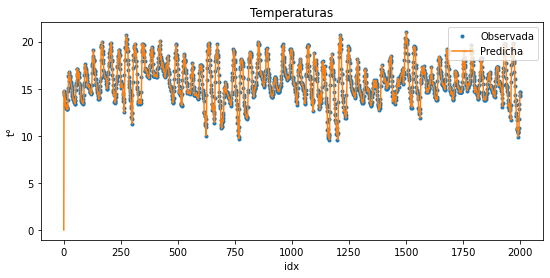

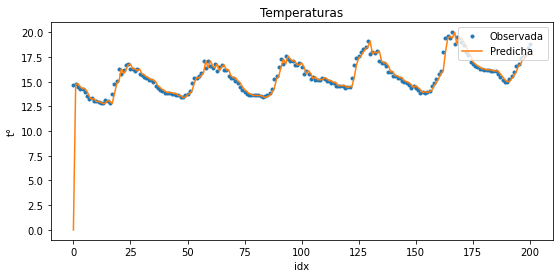

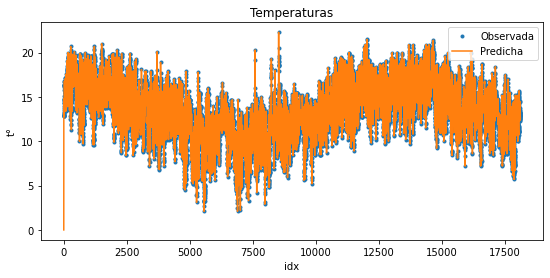

In [72]:
mysarima(Y=Y_Ajuste,
         order=(0,1,0),
         seasonal_order=(0,0,0,60*24/Intervalo))

In [73]:
#AR o MA 1

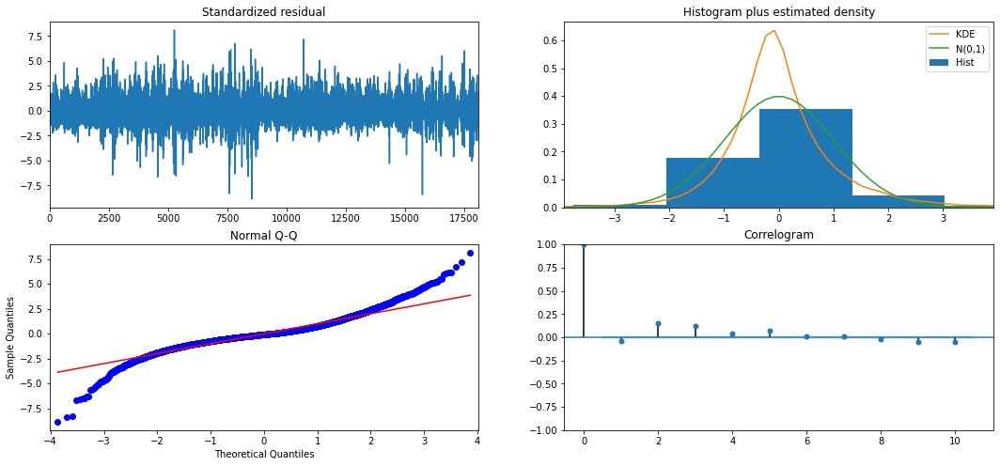

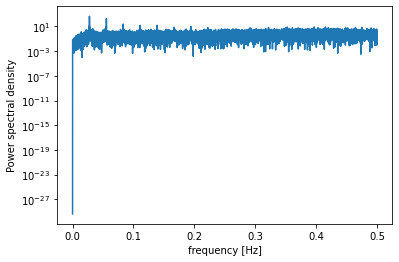

          freq         pow      delay
502   0.027741  443.105012  36.047809
503   0.027796  198.086337  35.976143
1005  0.055537  174.701598  18.005970
501   0.027686   83.873787  36.119760
1007  0.055648   41.881557  17.970209
504   0.027851   35.407085  35.904762
505   0.027907   24.742544  35.833663
1507  0.083278   24.136448  12.007963
506   0.027962   22.609635  35.762846
1506  0.083223   16.433933  12.015936
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:               SARIMAX(1, 1, 0)   Log Likelihood              -17625.391
Date:                Fri, 09 Oct 2020   AIC                          35256.781
Time:                        22:00:57   BIC                          35280.192
Sample:                             0   HQIC                         35264.478
                              - 18096                                         
Covariance Type:             

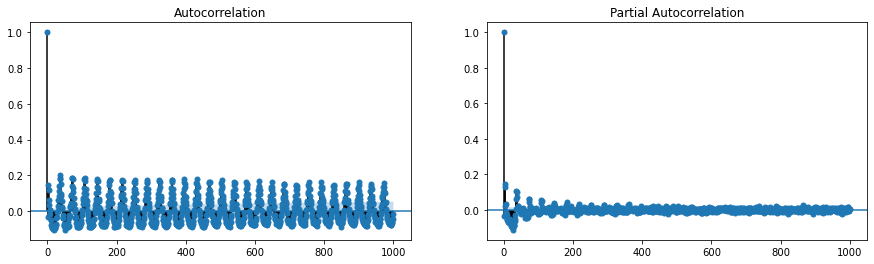

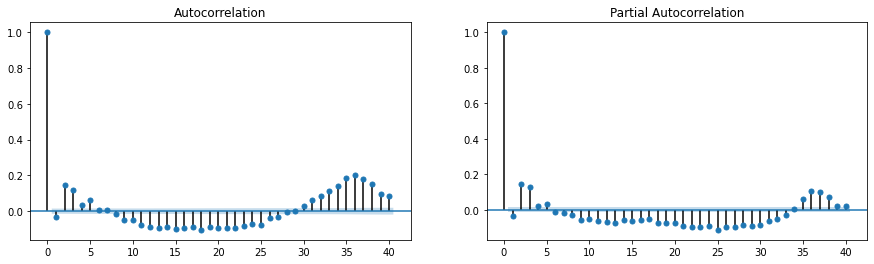

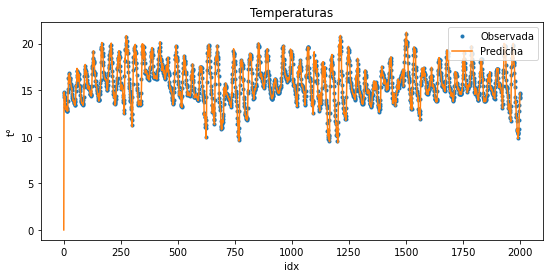

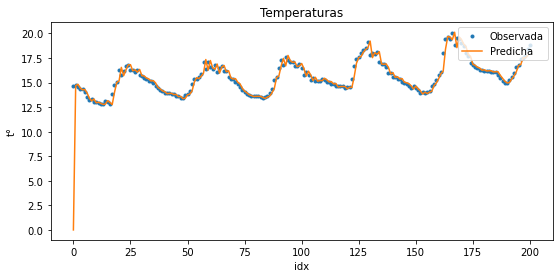

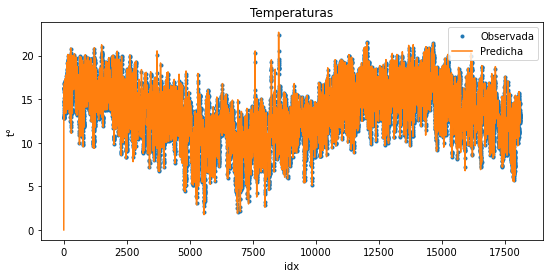

In [74]:
mysarima(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(0,0,0,60*24/Intervalo))

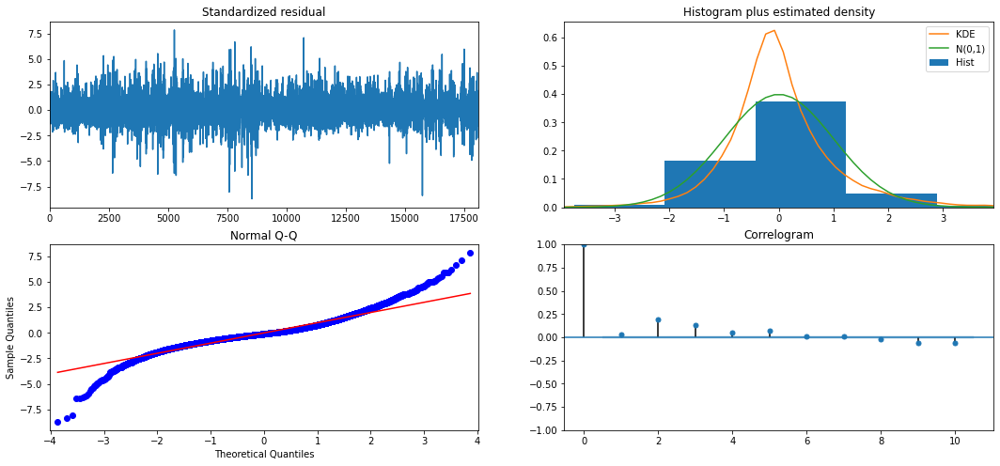

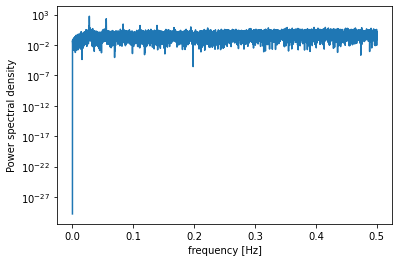

          freq         pow      delay
502   0.027741  521.452523  36.047809
503   0.027796  233.630519  35.976143
1005  0.055537  201.893341  18.005970
501   0.027686   98.916080  36.119760
1007  0.055648   48.628045  17.970209
504   0.027851   41.850267  35.904762
505   0.027907   29.183273  35.833663
1507  0.083278   27.040863  12.007963
506   0.027962   26.475462  35.762846
1506  0.083223   18.390490  12.015936
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:               SARIMAX(0, 1, 1)   Log Likelihood              -17725.922
Date:                Fri, 09 Oct 2020   AIC                          35457.844
Time:                        22:01:10   BIC                          35481.254
Sample:                             0   HQIC                         35465.540
                              - 18096                                         
Covariance Type:             

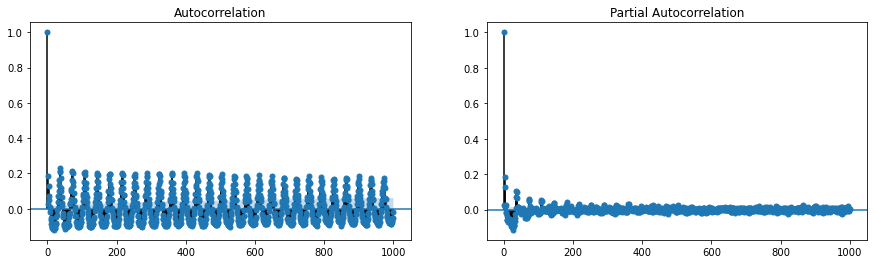

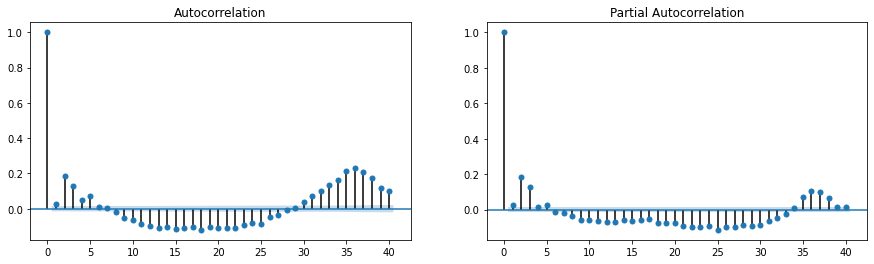

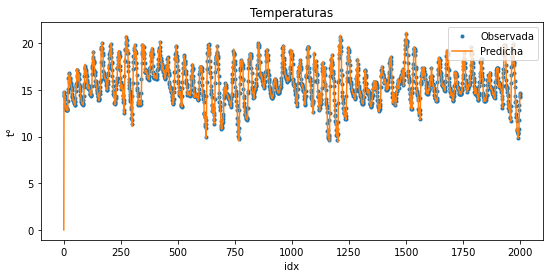

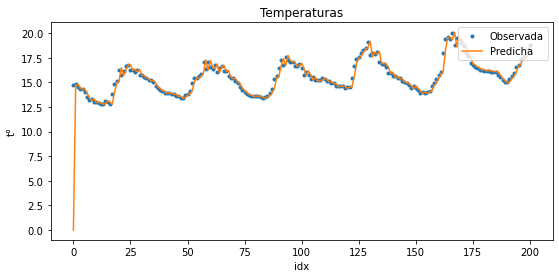

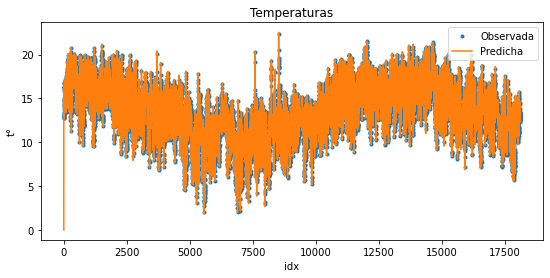

In [75]:
mysarima(Y=Y_Ajuste,
         order=(0,1,1),
         seasonal_order=(0,0,0,60*24/Intervalo))

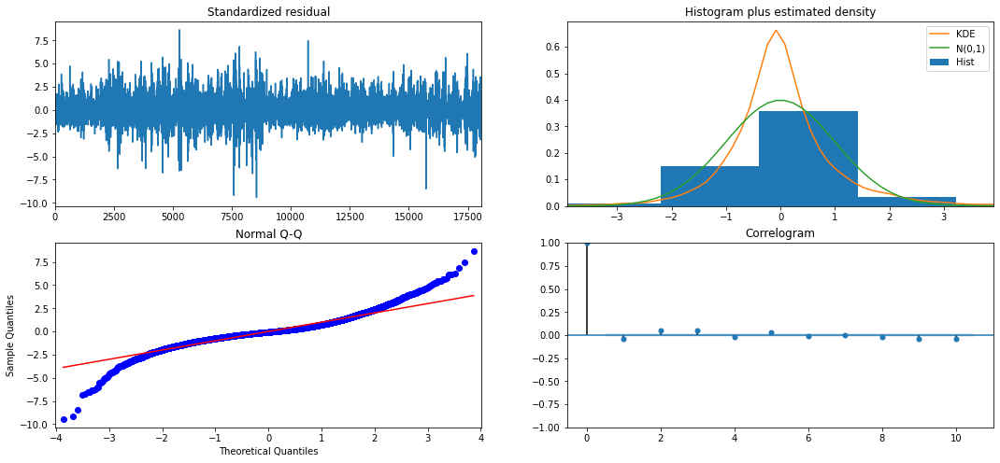

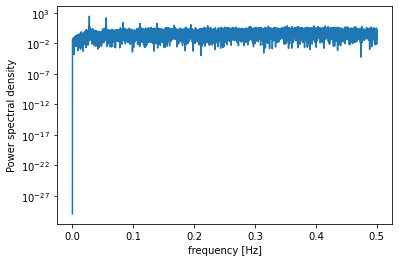

          freq         pow      delay
502   0.027741  283.494411  36.047809
1005  0.055537  155.151379  18.005970
503   0.027796  125.341871  35.976143
501   0.027686   53.398468  36.119760
1007  0.055648   37.131145  17.970209
1507  0.083278   26.836876  12.007963
504   0.027851   22.190533  35.904762
2515  0.138981   19.359873   7.195229
1506  0.083223   18.291662  12.015936
2013  0.111240   17.347605   8.989568
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                18096
Model:               SARIMAX(1, 1, 1)   Log Likelihood              -17303.929
Date:                Fri, 09 Oct 2020   AIC                          34615.858
Time:                        22:01:27   BIC                          34647.071
Sample:                             0   HQIC                         34626.119
                              - 18096                                         
Covariance Type:             

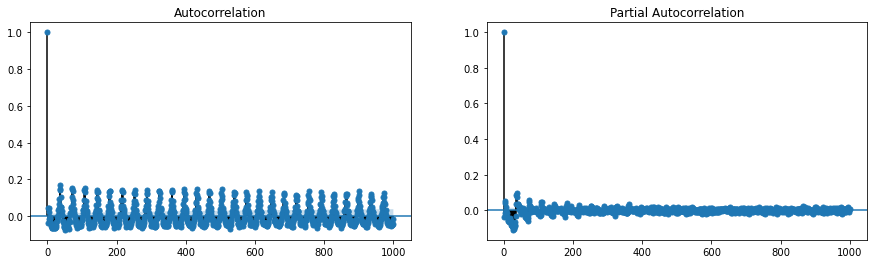

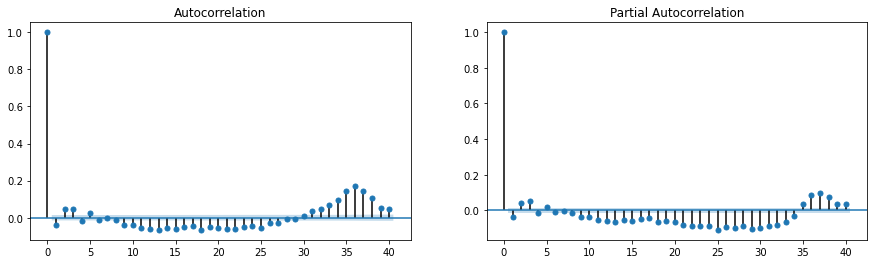

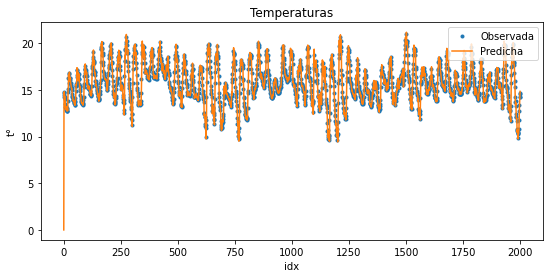

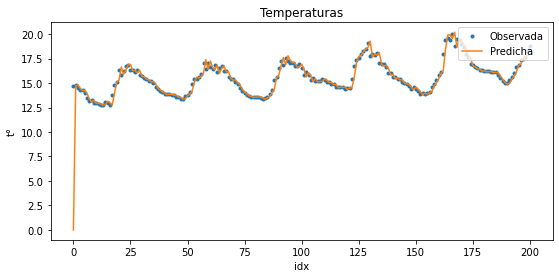

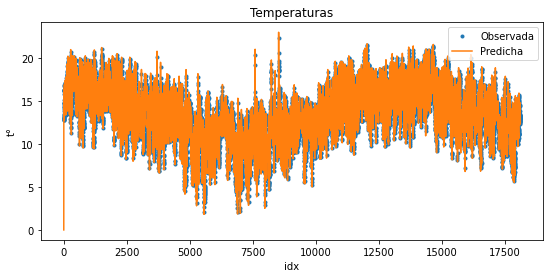

In [76]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,0,0,60*24/Intervalo))

In [77]:
#Elemento 24h:

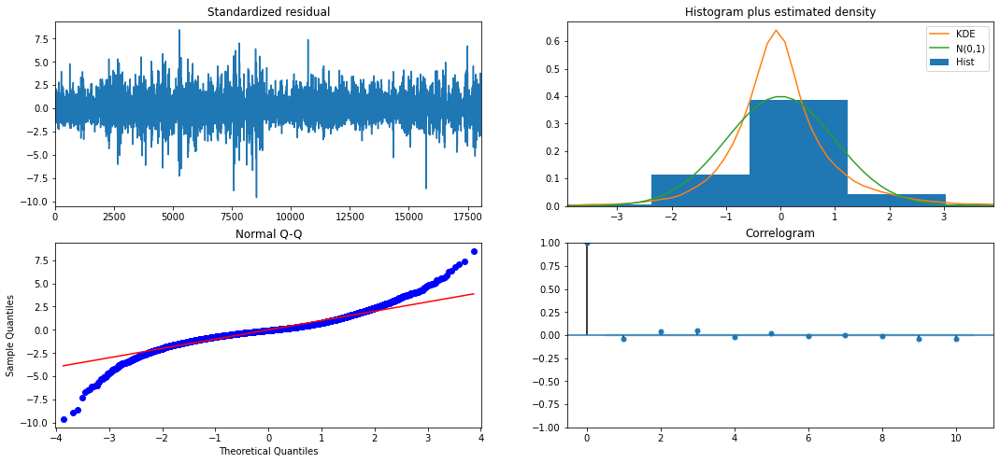

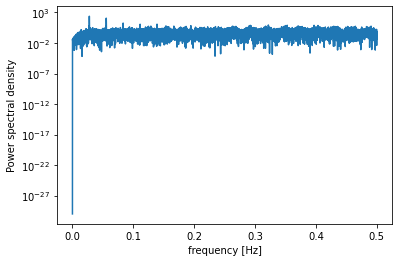

          freq         pow      delay
502   0.027741  243.477607  36.047809
1005  0.055537  117.195713  18.005970
503   0.027796  107.661151  35.976143
501   0.027686   45.691006  36.119760
1007  0.055648   27.734394  17.970209
504   0.027851   19.047536  35.904762
1507  0.083278   18.556655  12.007963
505   0.027907   13.531965  35.833663
506   0.027962   12.702973  35.762846
1506  0.083223   12.672997  12.015936
                                      SARIMAX Results                                      
Dep. Variable:                                  ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(1, 0, [], 36)   Log Likelihood              -16963.952
Date:                             Fri, 09 Oct 2020   AIC                          33937.905
Time:                                     22:03:45   BIC                          33976.922
Sample:                                          0   HQIC                         33950.732
                              

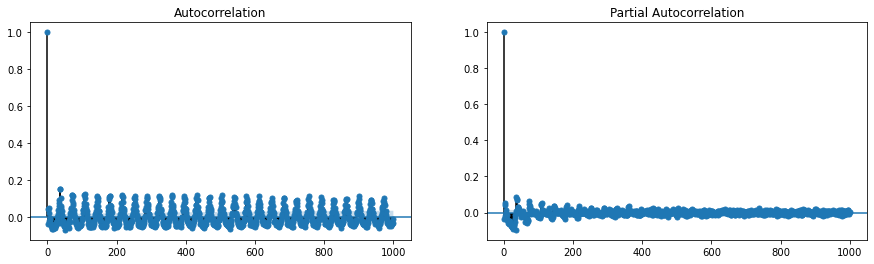

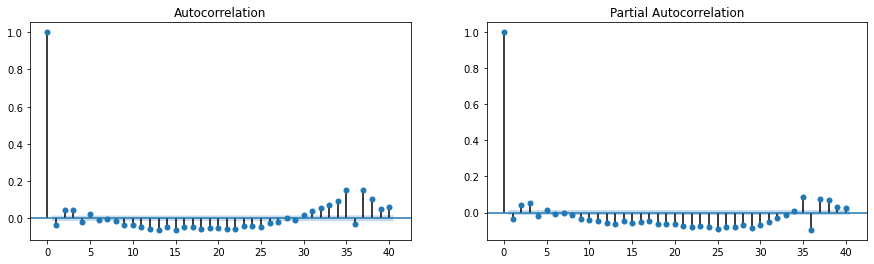

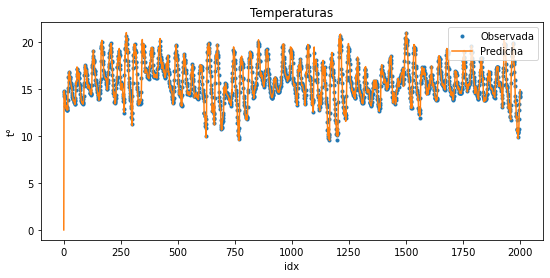

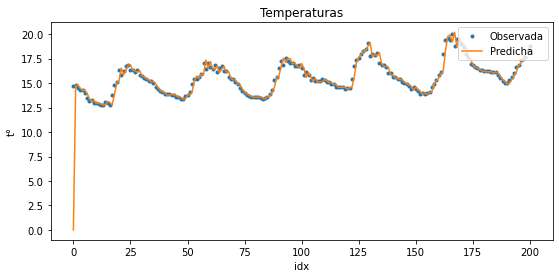

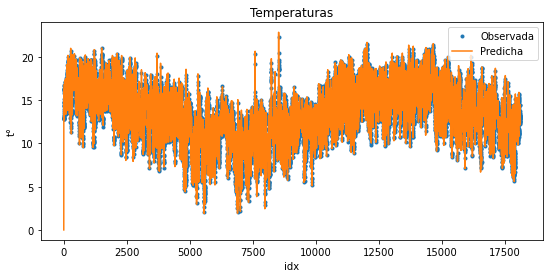

In [78]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,0,60*24/Intervalo))

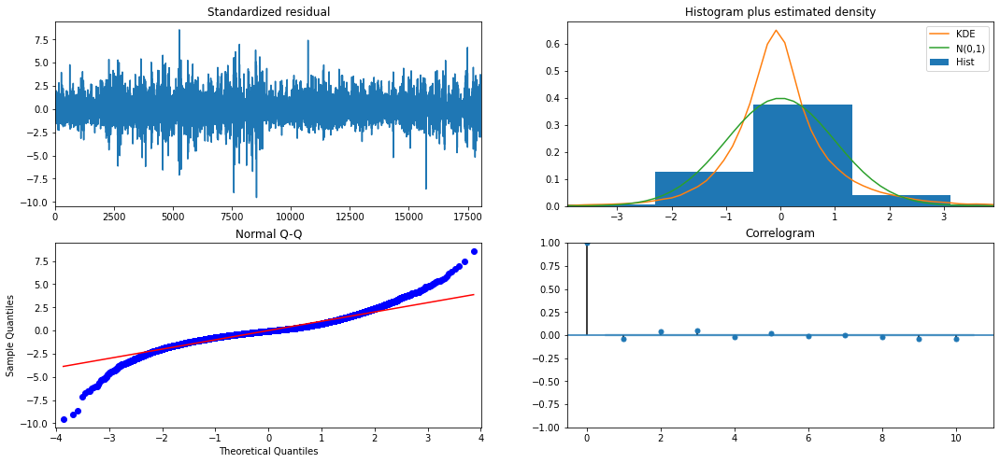

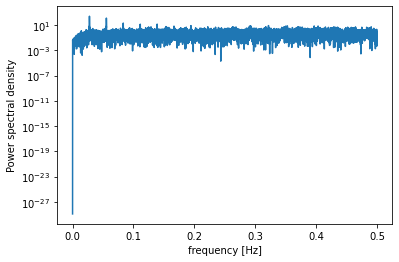

          freq         pow      delay
502   0.027741  259.438695  36.047809
1005  0.055537  131.295705  18.005970
503   0.027796  114.738329  35.976143
501   0.027686   48.757922  36.119760
1007  0.055648   31.212694  17.970209
1507  0.083278   21.511210  12.007963
504   0.027851   20.308526  35.904762
1506  0.083223   14.678473  12.015936
2515  0.138981   14.638150   7.195229
505   0.027907   14.459360  35.833663
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(0, 0, 1, 36)   Log Likelihood              -17053.713
Date:                            Sat, 10 Oct 2020   AIC                          34117.425
Time:                                    13:46:15   BIC                          34156.442
Sample:                                         0   HQIC                         34130.253
                                    

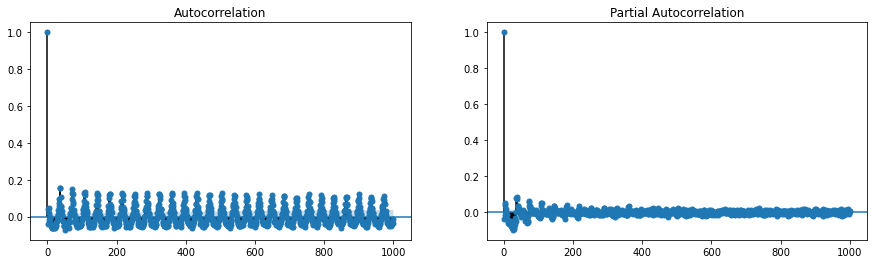

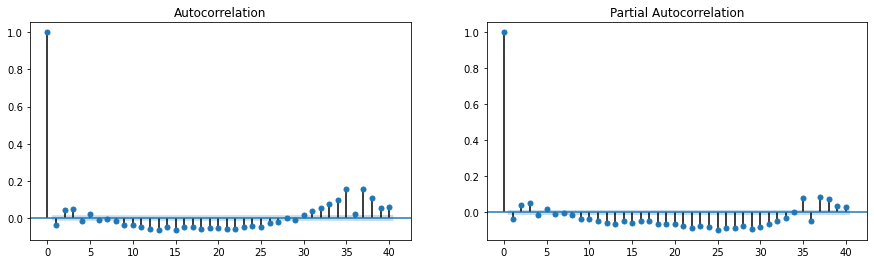

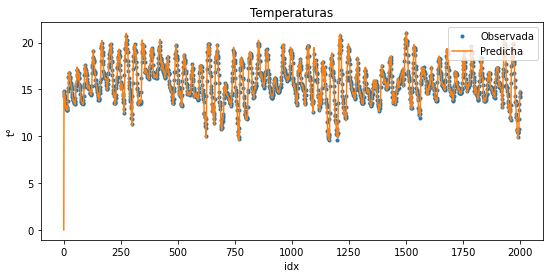

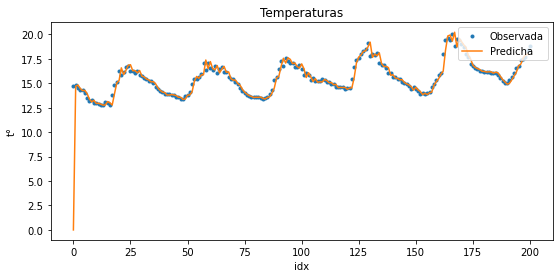

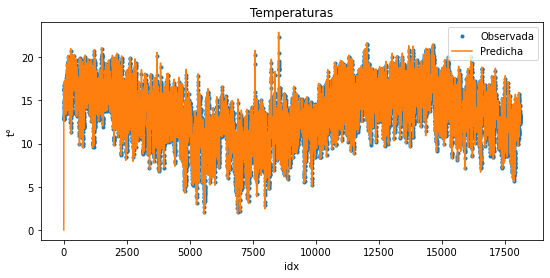

In [21]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,0,1,60*24/Intervalo))

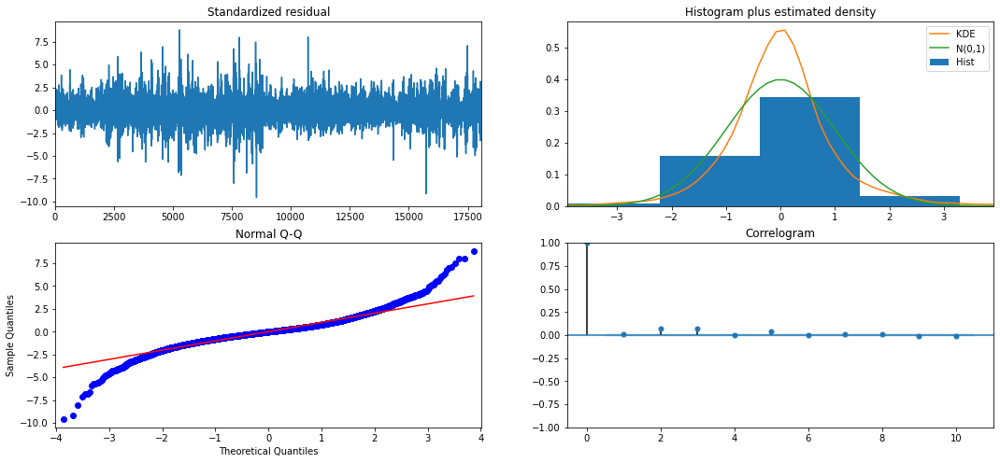

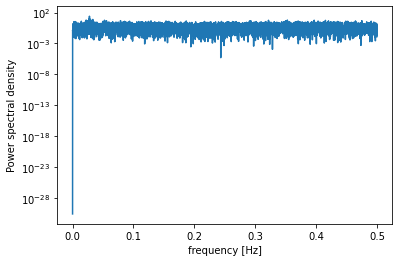

         freq        pow      delay
502  0.027741  25.428658  36.047809
501  0.027686  10.430163  36.119760
505  0.027907   9.543588  35.833663
494  0.027299   9.033019  36.631579
512  0.028294   8.113528  35.343750
506  0.027962   7.900331  35.762846
519  0.028680   7.808092  34.867052
601  0.033212   7.680493  30.109817
541  0.029896   6.329652  33.449168
498  0.027520   6.300151  36.337349
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood              -15396.836
Date:                            Sat, 10 Oct 2020   AIC                          30805.671
Time:                                    13:55:28   BIC                          30852.491
Sample:                                         0   HQIC                         30821.064
                                          - 18096         

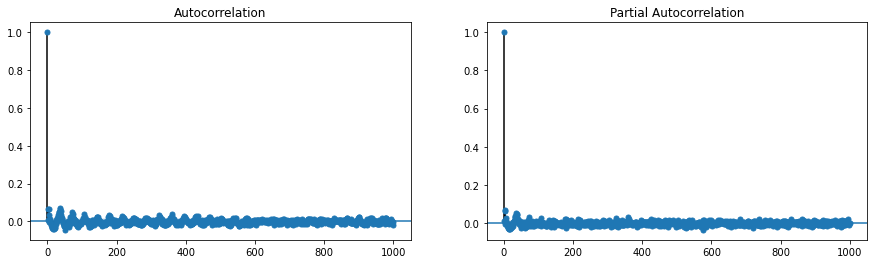

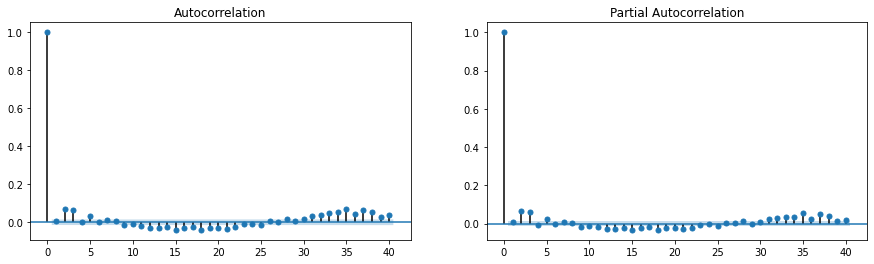

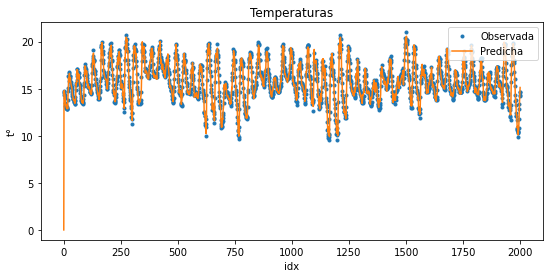

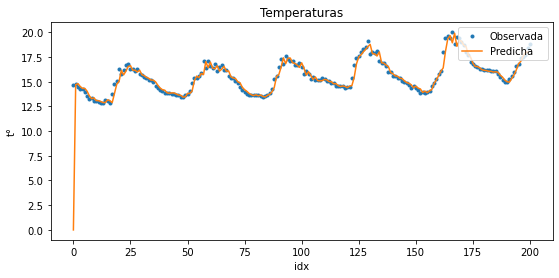

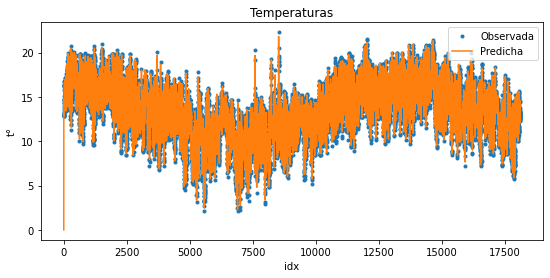

In [22]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*24/Intervalo))

In [23]:
#Componente de medio dia

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


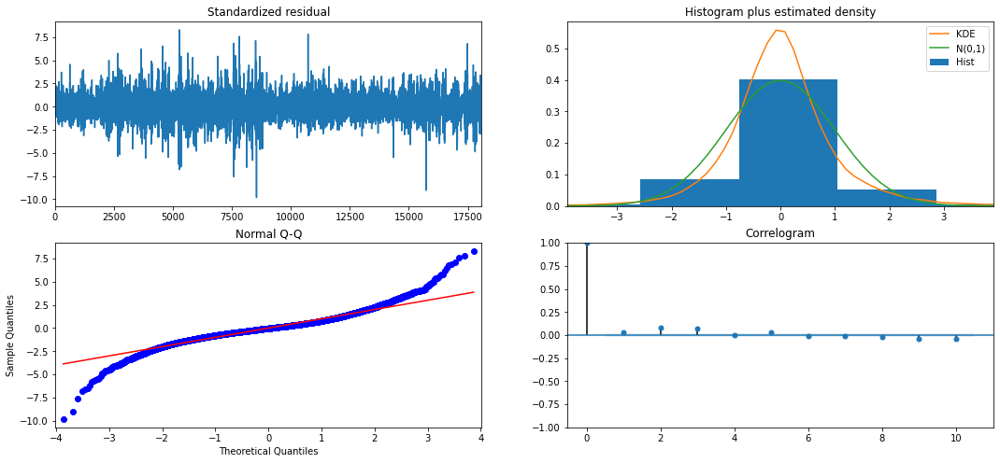

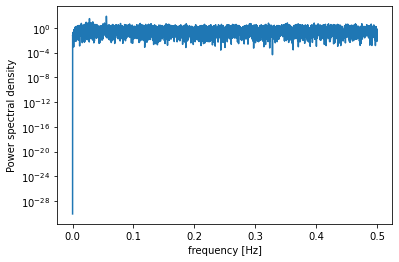

          freq        pow      delay
1005  0.055537  79.959162  18.005970
502   0.027741  33.023325  36.047809
1007  0.055648  19.364252  17.970209
503   0.027796  12.249893  35.976143
601   0.033212   9.817667  30.109817
404   0.022325   8.533713  44.792079
501   0.027686   6.743898  36.119760
541   0.029896   6.724287  33.449168
6385  0.352840   6.614176   2.834143
548   0.030283   6.532200  33.021898
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -15781.315
Date:                                 Sat, 10 Oct 2020   AIC                          31578.631
Time:                                         14:03:34   BIC                          31641.058
Sample:                                              0   HQIC                         31599.154
                 

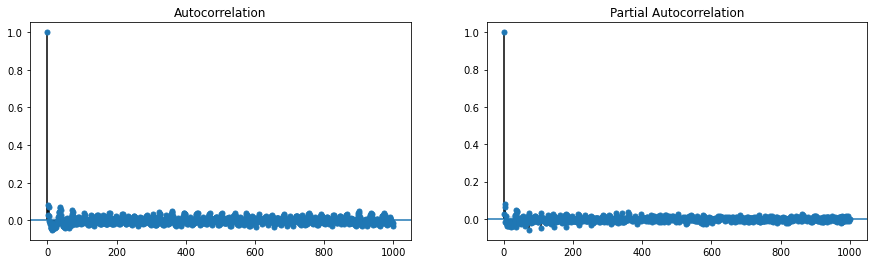

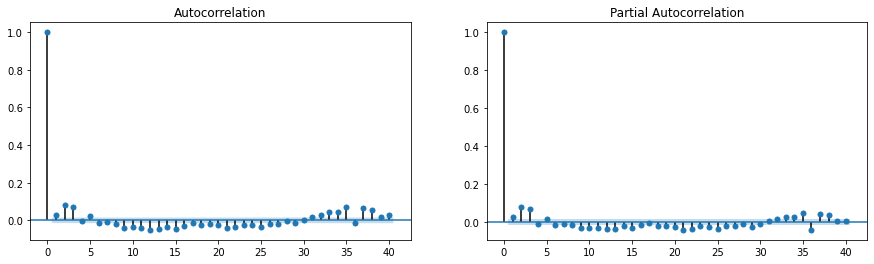

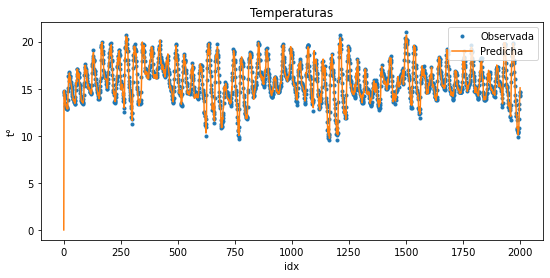

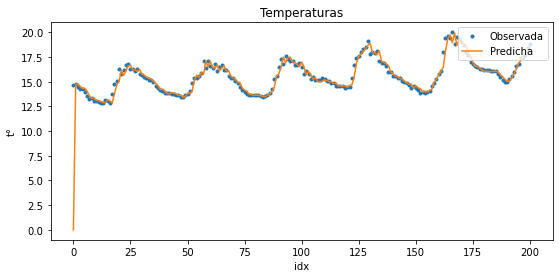

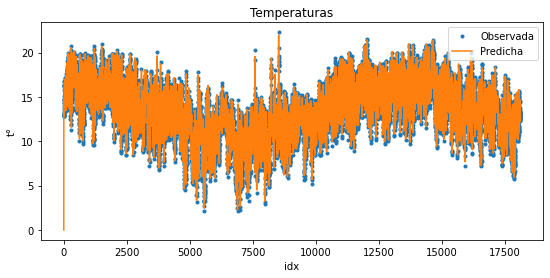

In [24]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo))

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


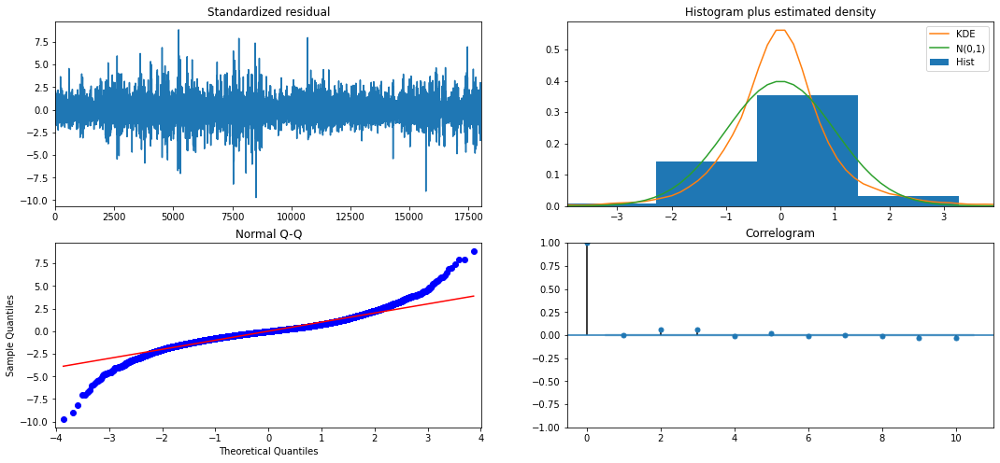

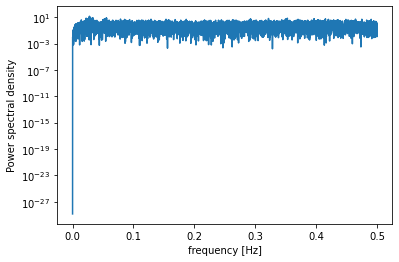

          freq        pow      delay
502   0.027741  13.613287  36.047809
505   0.027907  10.431822  35.833663
512   0.028294   9.688695  35.343750
494   0.027299   8.922354  36.631579
506   0.027962   8.498874  35.762846
601   0.033212   8.240072  30.109817
519   0.028680   7.960385  34.867052
515   0.028459   7.902668  35.137864
498   0.027520   7.794661  36.337349
1007  0.055648   7.559632  17.970209
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -15552.296
Date:                                 Sat, 10 Oct 2020   AIC                          31118.592
Time:                                         14:12:00   BIC                          31173.201
Sample:                                              0   HQIC                         31136.548
                 

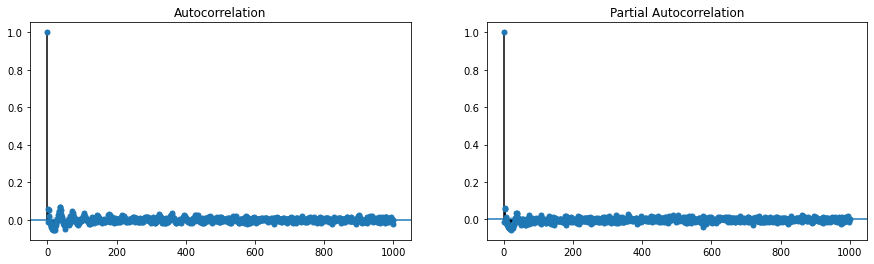

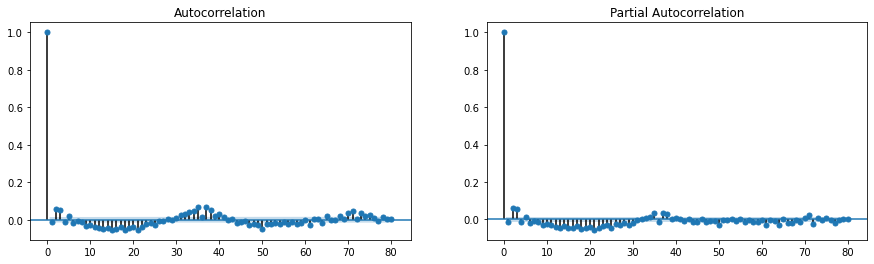

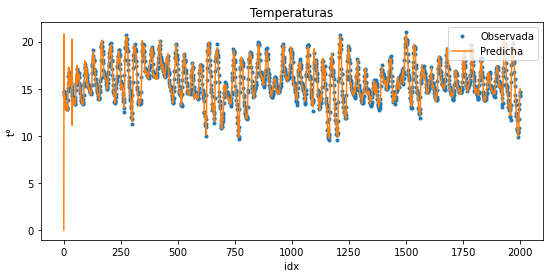

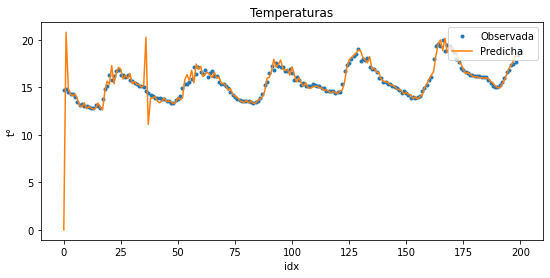

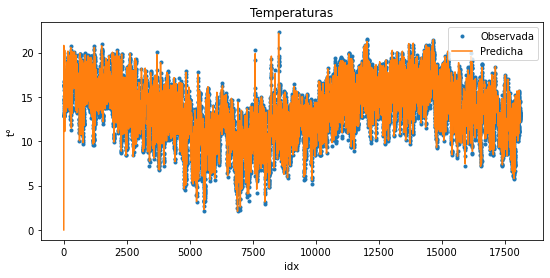

In [25]:
mysarima2(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo),
         restriccion={'ma.S.L18':0})

In [26]:
#Nos quedamos con:

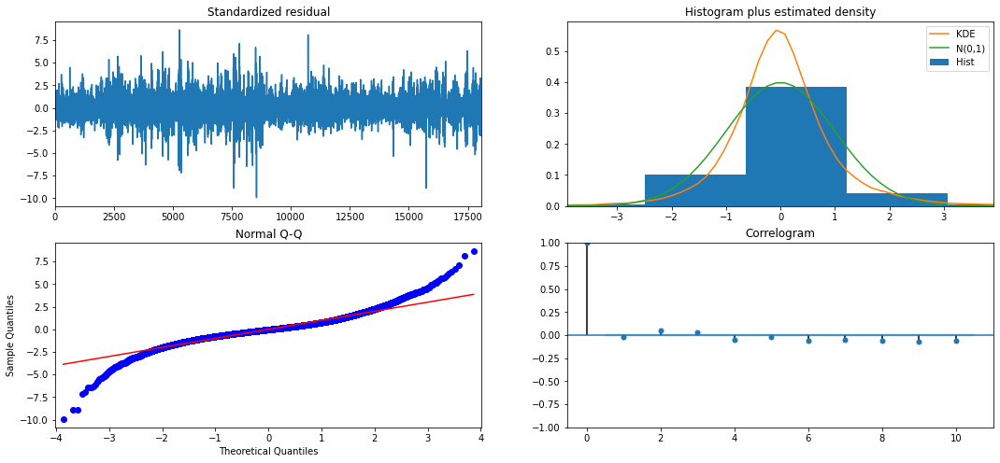

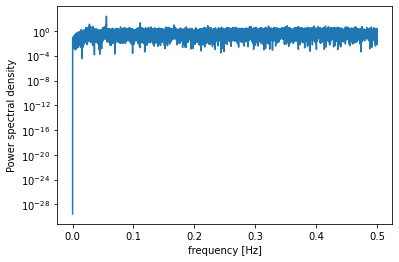

          freq         pow      delay
1005  0.055537  240.845768  18.005970
1007  0.055648   58.229619  17.970209
2013  0.111240   18.890395   8.989568
2010  0.111074   18.661541   9.002985
1008  0.055703   18.050427  17.952381
1003  0.055427   13.150809  18.041874
502   0.027741   12.628778  36.047809
2012  0.111185   12.099622   8.994036
2008  0.110964   11.257787   9.011952
2011  0.111130   10.735533   8.998508
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 18)   Log Likelihood              -16252.825
Date:                            Tue, 17 Nov 2020   AIC                          32517.650
Time:                                    12:01:36   BIC                          32564.470
Sample:                                         0   HQIC                         32533.043
                                    

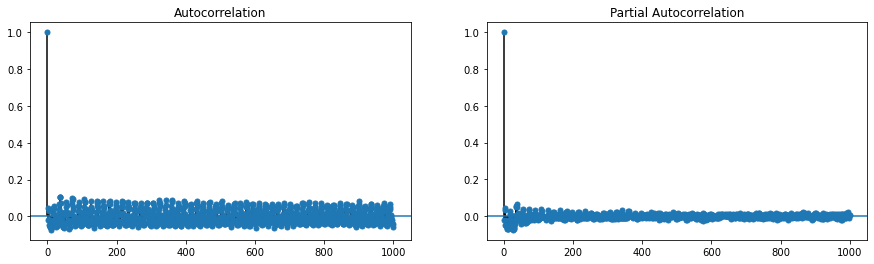

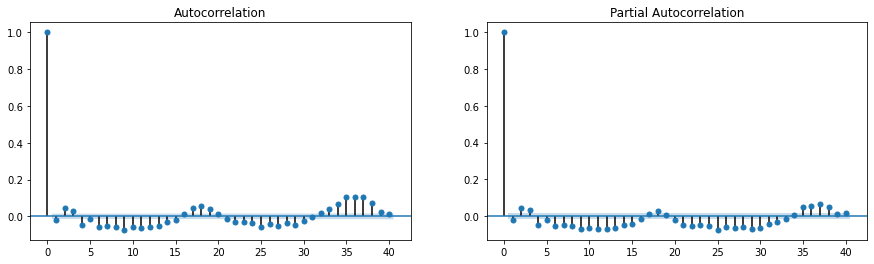

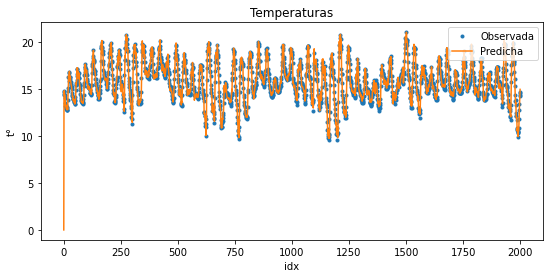

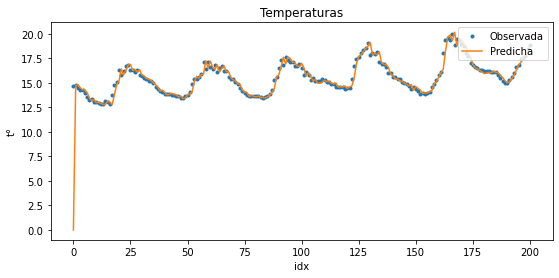

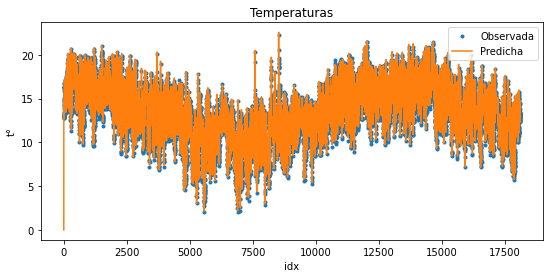

In [31]:
Res3=mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*12/Intervalo))

In [32]:
#Validamos

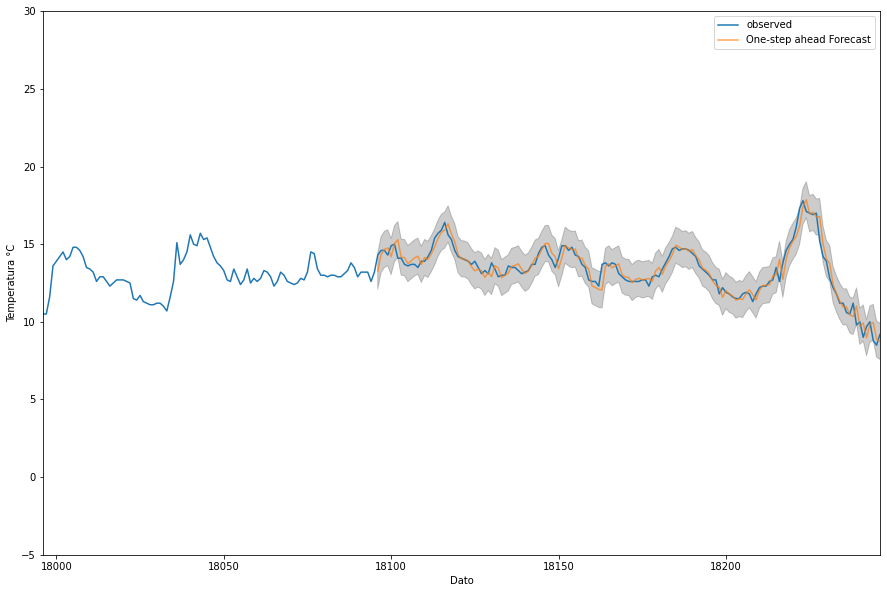

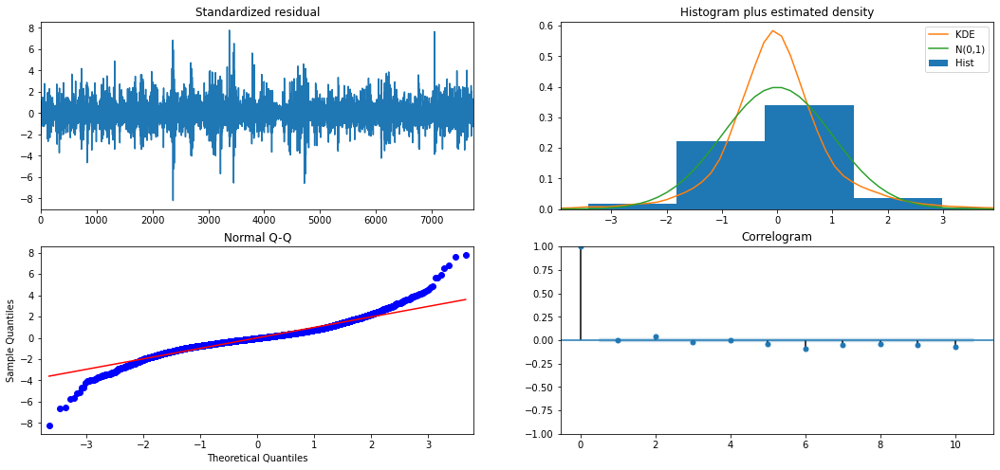

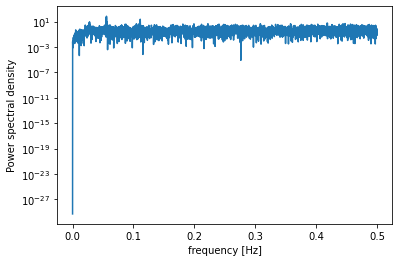

                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                 7755
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 18)   Log Likelihood               -6842.717
Date:                            Tue, 17 Nov 2020   AIC                          13697.434
Time:                                    12:01:48   BIC                          13739.169
Sample:                                         0   HQIC                         13711.741
                                           - 7755                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -3.621e-05      0.005     -0.007      0.994      -0.010       0.010
ar.L1          0.5077      0.077   

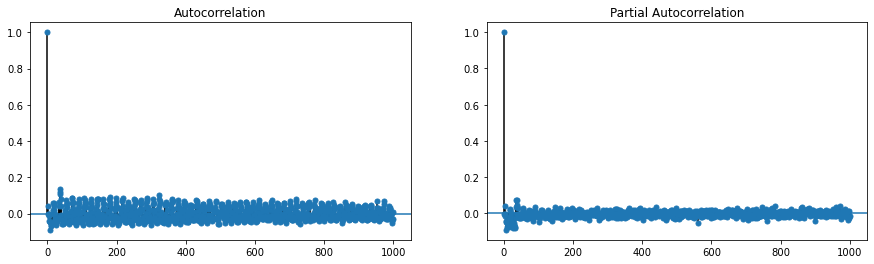

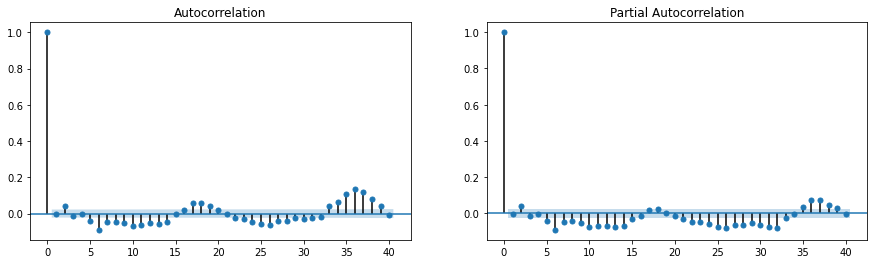

In [33]:
predecir_2(Res3,Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
18096  14.3  1.041635         True        False        False
18097  14.6  0.273231        False        False        False
18098  14.6 -0.064596        False        False        False
18099  14.3 -0.461956        False        False        False
18100  14.9  0.697690        False        False        False
...     ...       ...          ...          ...          ...
25846  16.5 -0.193536        False        False        False
25847  16.9  0.562322        False        False        False
25848  16.7 -0.031372        False        False        False
25849  16.5  0.357496        False        False        False
25850  15.9  0.120966        False        False        False

[7755 rows x 5 columns]
Promedio Valor Absoluto Error: 0.40353772816383787
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0     8.459059     1.018698     0.180529


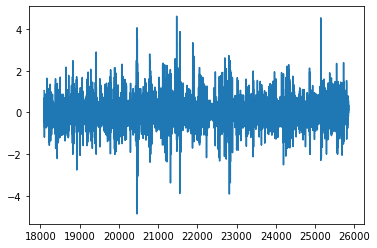

In [34]:
predecir_4(Res3,Y_Test,limite)

In [30]:
#Más pruebas:

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


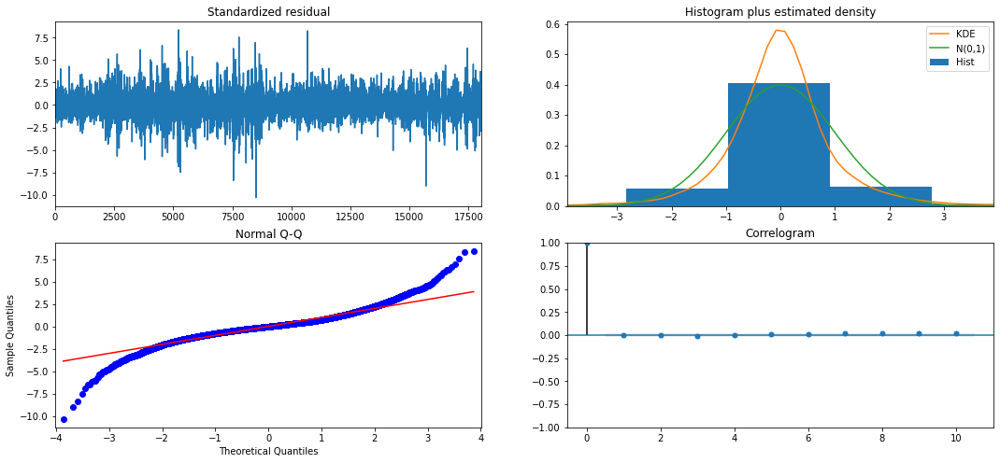

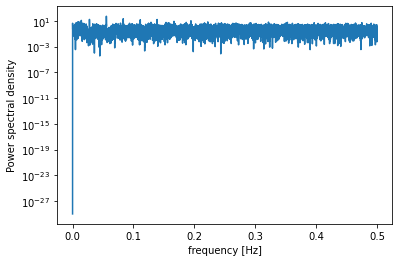

          freq        pow      delay
1005  0.055537  50.313226  18.005970
1507  0.083278  21.026461  12.007963
502   0.027741  16.197000  36.047809
2515  0.138981  15.680192   7.195229
1506  0.083223  14.328263  12.015936
2013  0.111240  13.066872   8.989568
2010  0.111074  13.043325   9.002985
2512  0.138815  12.572622   7.203822
1007  0.055648  12.118144  17.970209
1510  0.083444  11.991455  11.984106
                                       SARIMAX Results                                       
Dep. Variable:                                    ts   No. Observations:                18096
Model:             SARIMAX(36, 0, 0)x(0, 0, [1], 36)   Log Likelihood              -15587.665
Date:                               Sat, 10 Oct 2020   AIC                          31253.330
Time:                                       15:50:55   BIC                          31557.584
Sample:                                            0   HQIC                         31353.367
                             

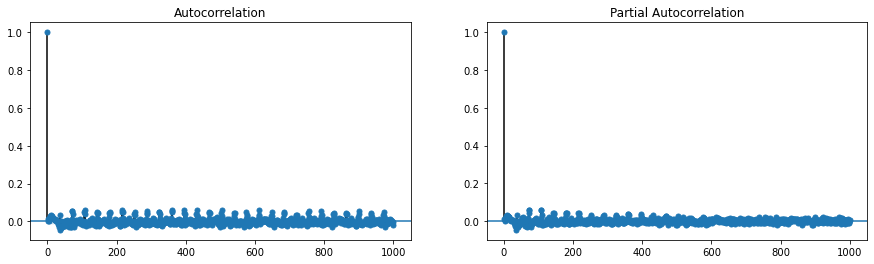

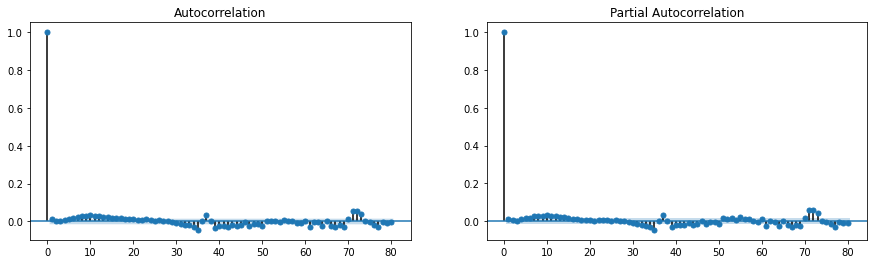

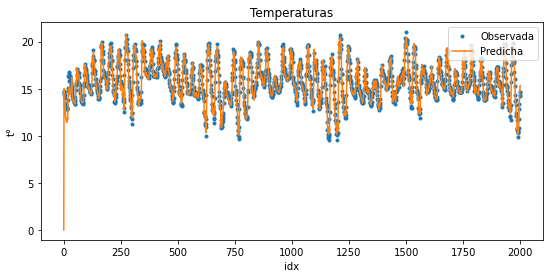

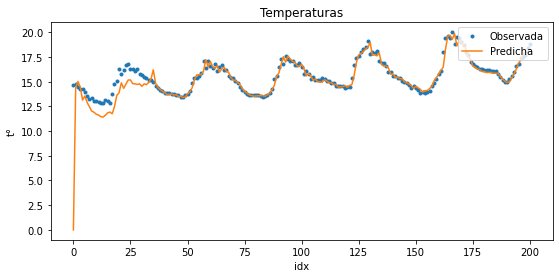

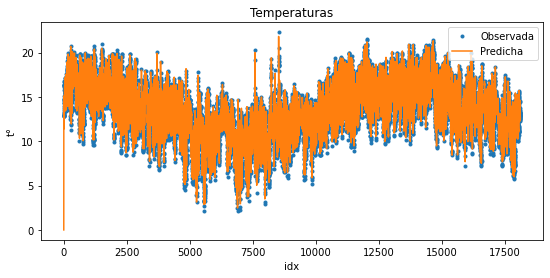

In [31]:
mysarima2(Y=Y_Ajuste,
         order=(60*24/Intervalo,0,0),
         seasonal_order=(0,0,1,60*24/Intervalo))

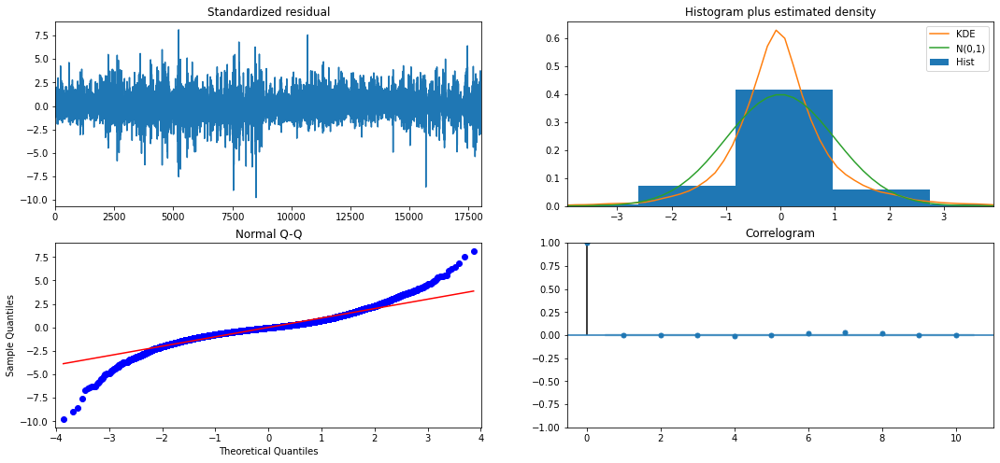

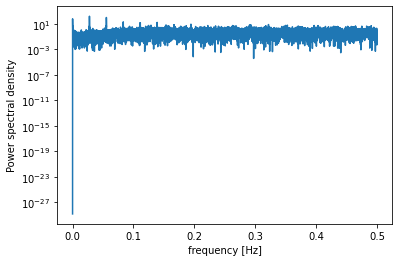

          freq         pow         delay
502   0.027741  165.358639     36.047809
1005  0.055537  105.019036     18.005970
503   0.027796   75.103740     35.976143
1     0.000055   64.572913  18096.000000
2     0.000111   36.081377   9048.000000
501   0.027686   31.321797     36.119760
1007  0.055648   25.240681     17.970209
1507  0.083278   21.608096     12.007963
2515  0.138981   17.722155      7.195229
2013  0.111240   15.689787      8.989568
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                18096
Model:             SARIMAX(6, 0, 0)x(0, 0, [1], 36)   Log Likelihood              -16624.710
Date:                              Sat, 10 Oct 2020   AIC                          33267.419
Time:                                      16:20:23   BIC                          33337.632
Sample:                                           0   HQIC                         3

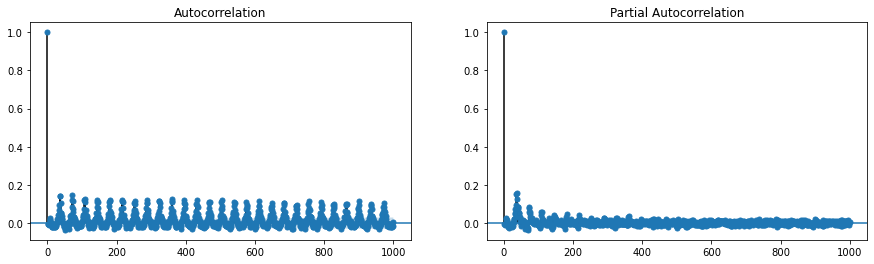

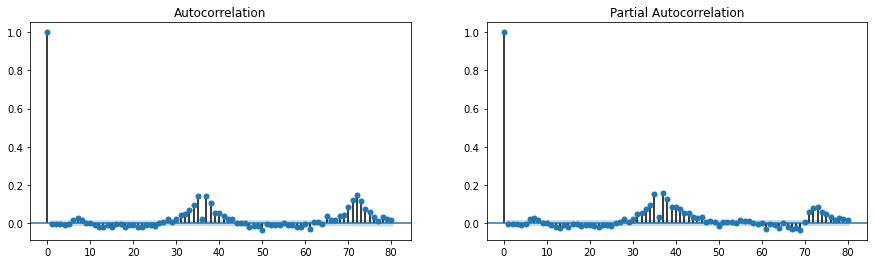

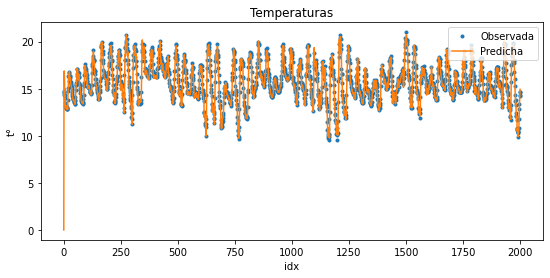

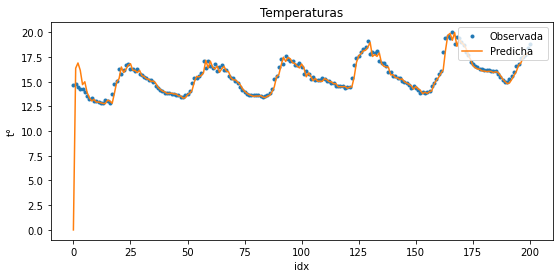

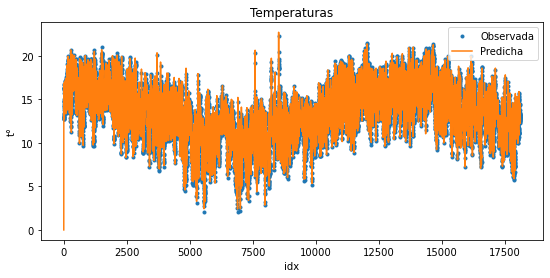

In [38]:
mysarima2(Y=Y_Ajuste,
         order=(6,0,0),
         seasonal_order=(0,0,1,60*24/Intervalo))

In [39]:
#Estacionalidad 24h:

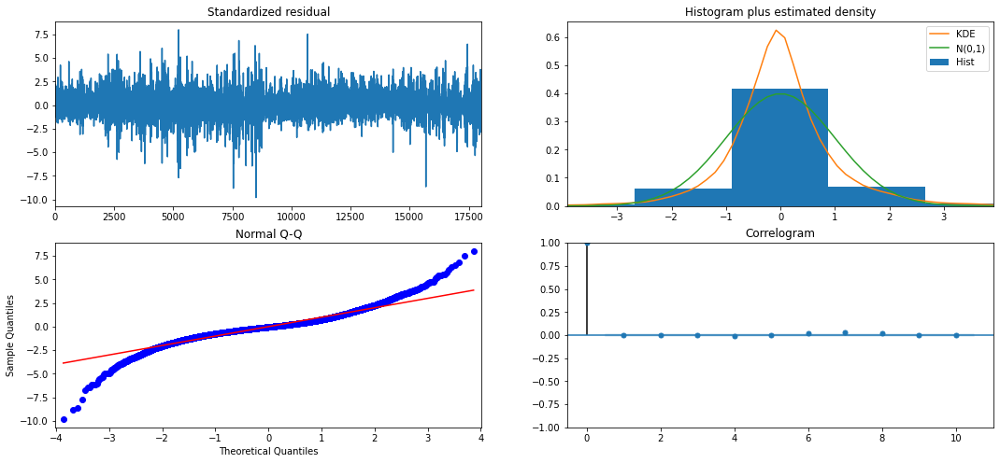

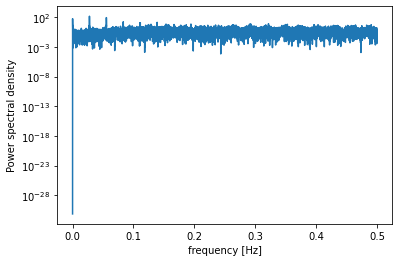

          freq         pow         delay
502   0.027741  158.648499     36.047809
1005  0.055537   92.990494     18.005970
503   0.027796   72.007859     35.976143
1     0.000055   60.512058  18096.000000
2     0.000111   33.456022   9048.000000
501   0.027686   30.148996     36.119760
1007  0.055648   22.579486     17.970209
1507  0.083278   18.433782     12.007963
2515  0.138981   14.716997      7.195229
2013  0.111240   13.095055      8.989568
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(6, 0, 0)x(1, 0, 0, 36)   Log Likelihood              -16540.555
Date:                            Sun, 11 Oct 2020   AIC                          33099.110
Time:                                    18:39:51   BIC                          33169.321
Sample:                                         0   HQIC                         33122.195
   

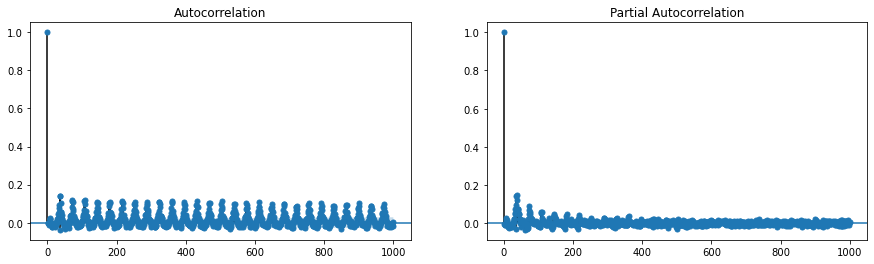

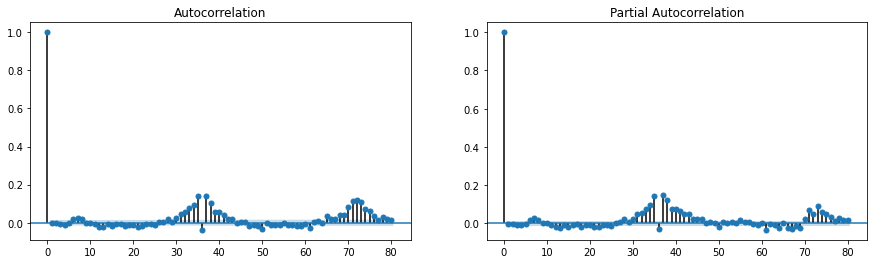

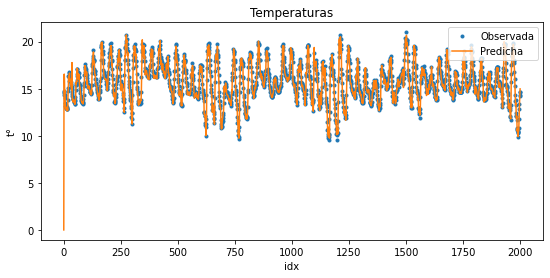

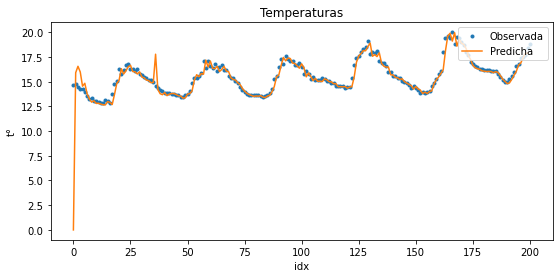

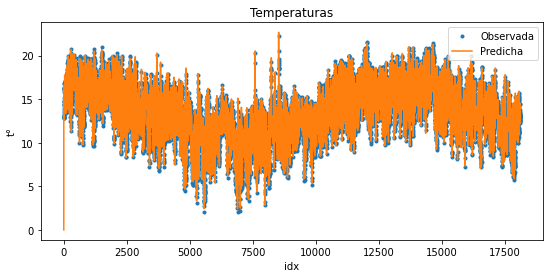

In [42]:
mysarima2(Y=Y_Ajuste,
         order=(6,0,0),
         seasonal_order=(1,0,0,60*24/Intervalo))

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


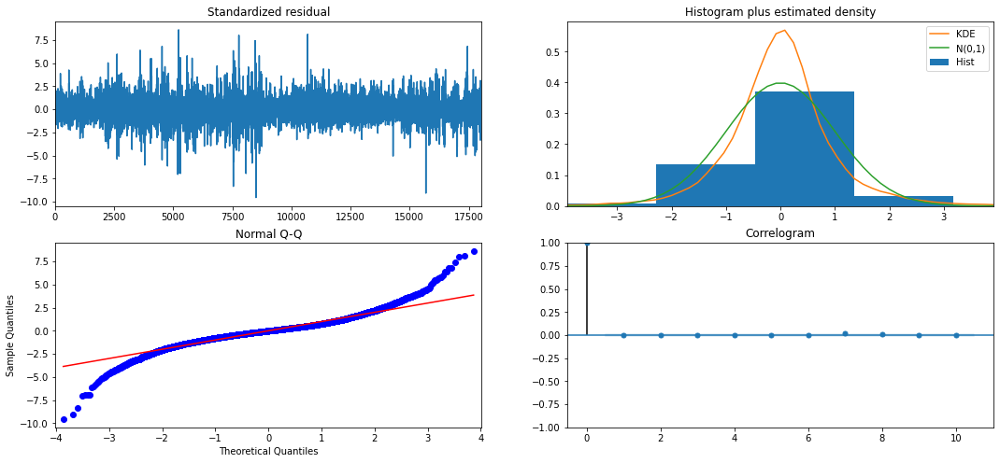

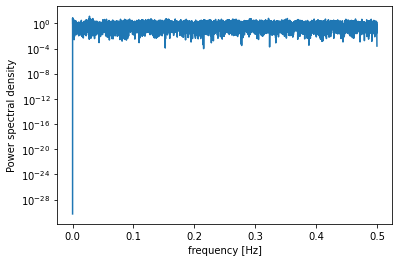

          freq        pow         delay
502   0.027741  13.699678     36.047809
9     0.000497   7.038193   2010.666667
1     0.000055   6.994791  18096.000000
505   0.027907   6.362718     35.833663
5824  0.321839   6.294495      3.107143
512   0.028294   6.052064     35.343750
6385  0.352840   5.994993      2.834143
601   0.033212   5.906354     30.109817
2     0.000111   5.803420   9048.000000
494   0.027299   5.566530     36.631579
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                18096
Model:             SARIMAX(6, 0, 0)x(1, 0, [1], 36)   Log Likelihood              -15306.966
Date:                              Sun, 11 Oct 2020   AIC                          30633.932
Time:                                      18:51:47   BIC                          30711.943
Sample:                                           0   HQIC                         30659.582
  

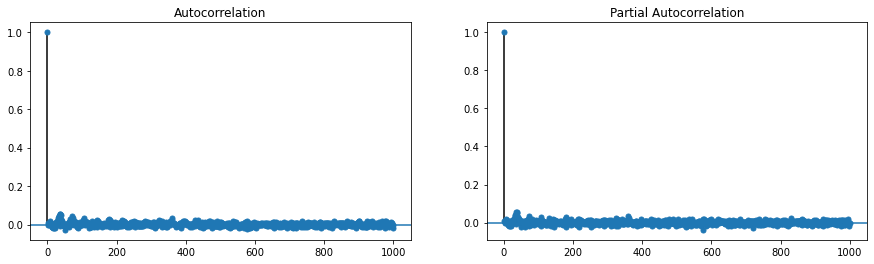

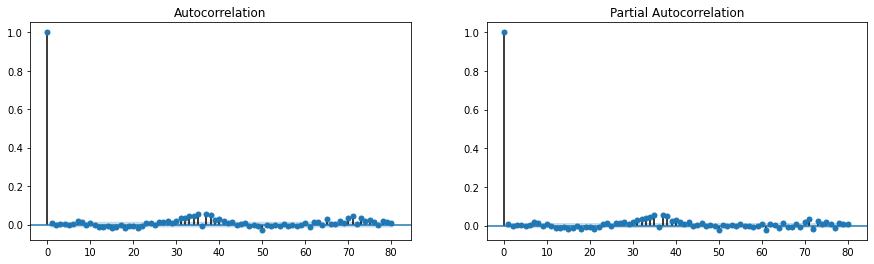

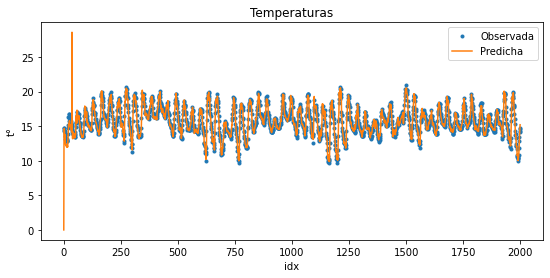

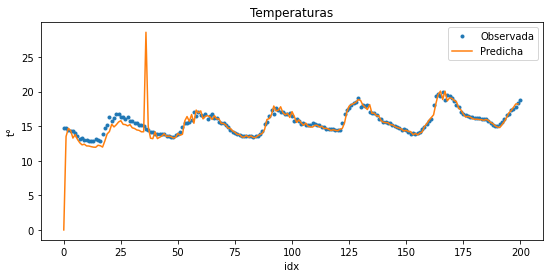

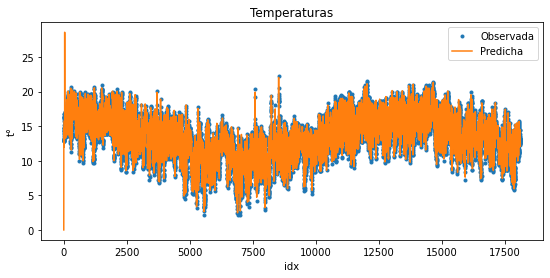

In [43]:
mysarima2(Y=Y_Ajuste,
         order=(6,0,0),
         seasonal_order=(1,0,1,60*24/Intervalo))

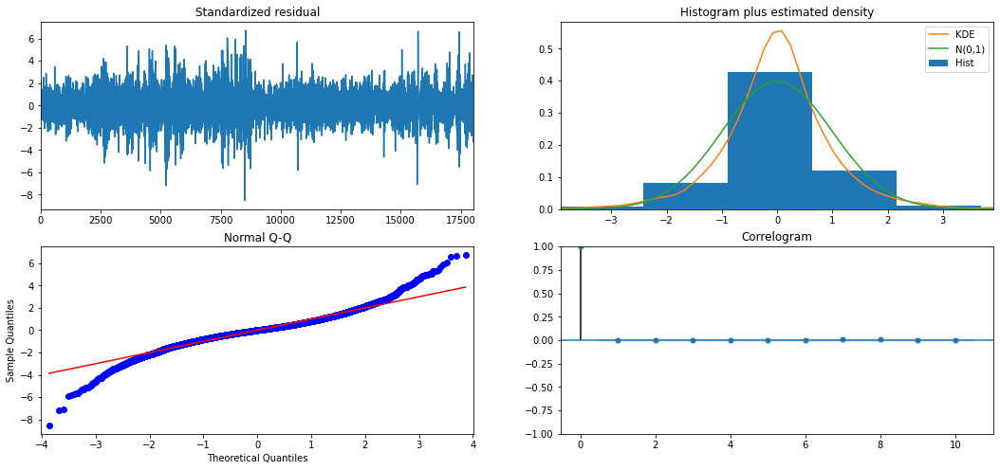

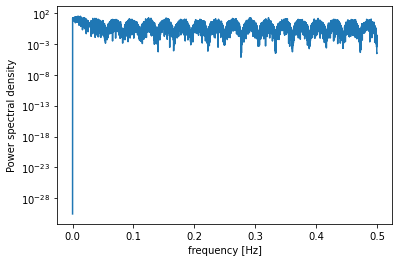

         freq        pow       delay
233  0.012876  30.293592   77.665236
175  0.009671  30.059484  103.405714
148  0.008179  29.180762  122.270270
208  0.011494  24.892598   87.000000
108  0.005968  24.229260  167.555556
106  0.005858  23.767459  170.716981
234  0.012931  23.762422   77.333333
87   0.004808  23.030002  208.000000
91   0.005029  22.456738  198.857143
199  0.010997  21.768556   90.934673
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(6, 0, 0)x(0, 1, 0, 36)   Log Likelihood              -20449.521
Date:                            Mon, 12 Oct 2020   AIC                          40915.042
Time:                                    09:51:30   BIC                          40977.451
Sample:                                         0   HQIC                         40935.562
                                          - 180

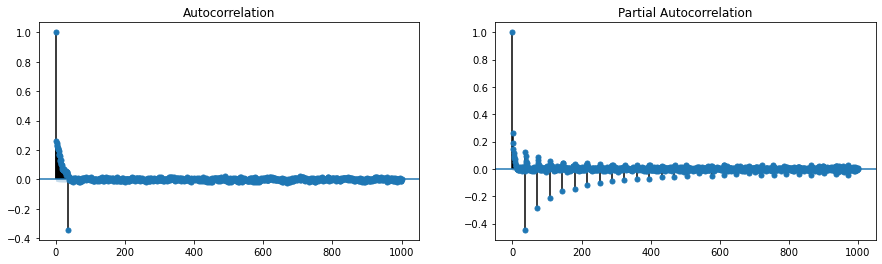

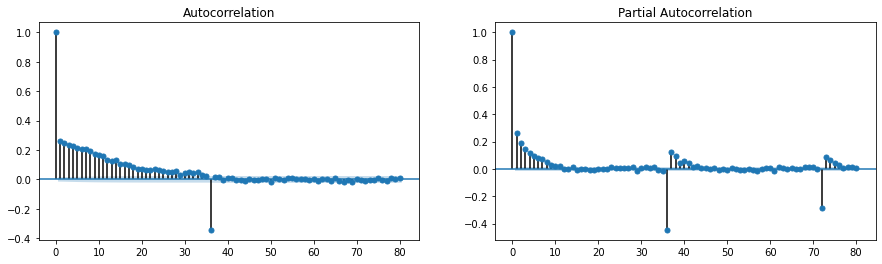

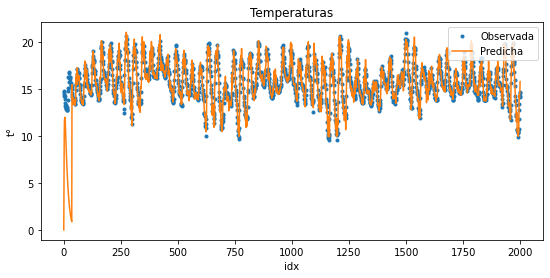

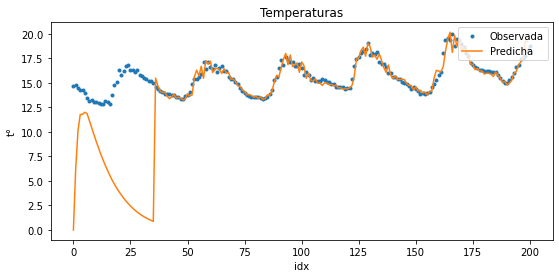

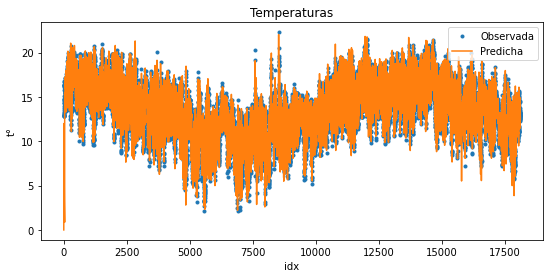

In [21]:
mysarima2(Y=Y_Ajuste,
         order=(6,0,0),
         seasonal_order=(0,1,0,60*24/Intervalo))

In [ ]:
#Probando con 12 horas:

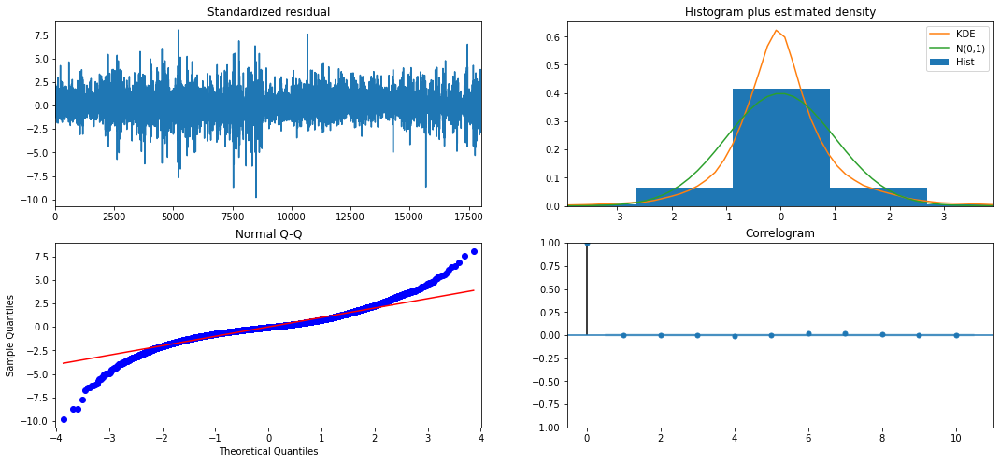

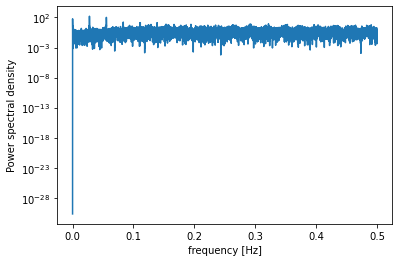

          freq         pow         delay
502   0.027741  157.529603     36.047809
1005  0.055537  101.649600     18.005970
503   0.027796   71.480983     35.976143
1     0.000055   58.137983  18096.000000
2     0.000111   32.123272   9048.000000
501   0.027686   29.932484     36.119760
1007  0.055648   24.678140     17.970209
1507  0.083278   16.868146     12.007963
2013  0.111240   13.731781      8.989568
2010  0.111074   13.574373      9.002985
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(6, 0, 0)x(2, 0, 0, 18)   Log Likelihood              -16534.524
Date:                            Mon, 12 Oct 2020   AIC                          33089.047
Time:                                    11:44:10   BIC                          33167.058
Sample:                                         0   HQIC                         33114.697
   

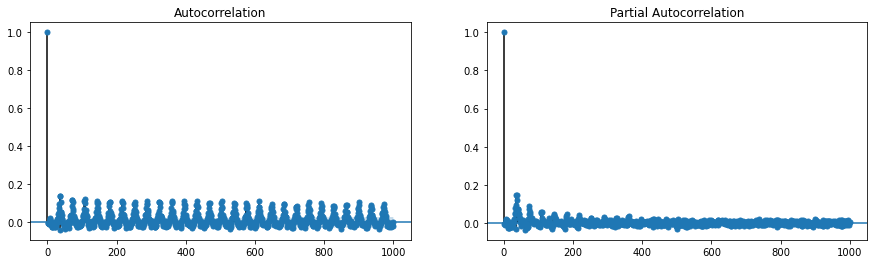

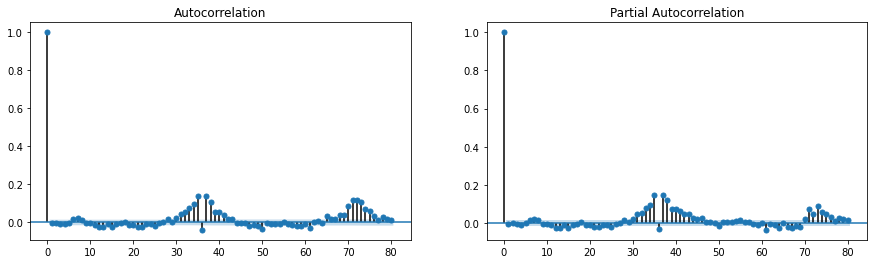

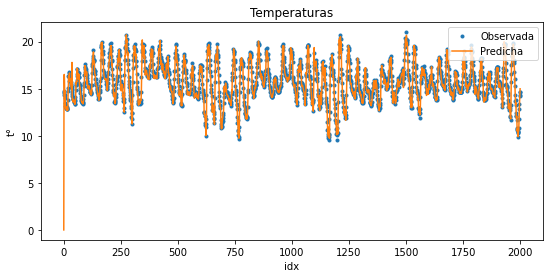

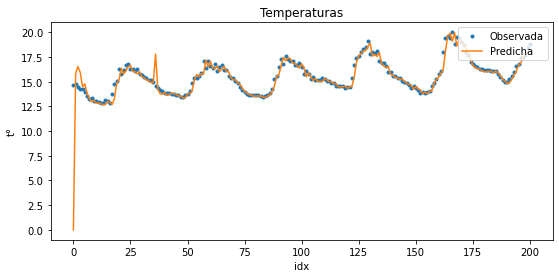

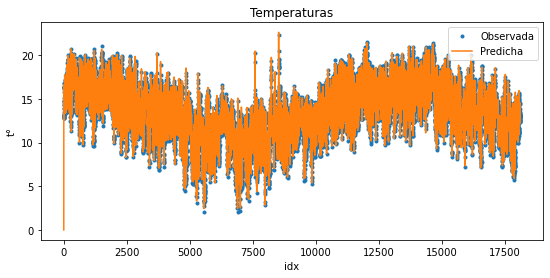

In [22]:
mysarima2(Y=Y_Ajuste,
         order=(6,0,0),
         seasonal_order=(2,0,0,60*12/Intervalo))

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


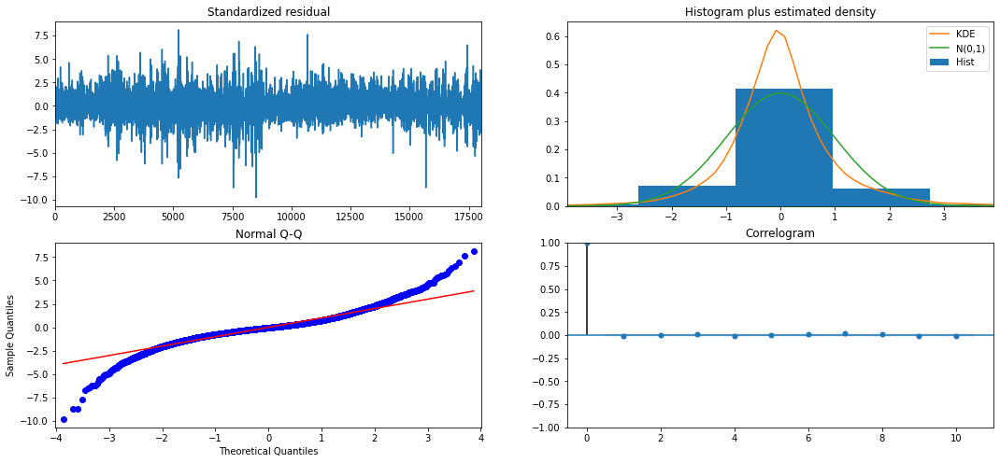

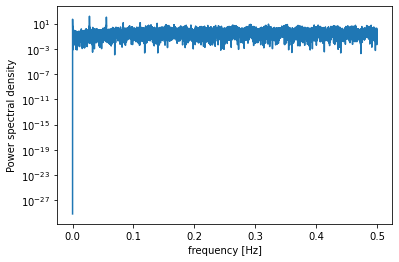

          freq         pow         delay
502   0.027741  153.187605     36.047809
1005  0.055537  109.768534     18.005970
503   0.027796   69.605722     35.976143
1     0.000055   51.045159  18096.000000
501   0.027686   29.150345     36.119760
2     0.000111   28.137838   9048.000000
1007  0.055648   26.388983     17.970209
1507  0.083278   14.799834     12.007963
2013  0.111240   14.068630      8.989568
2010  0.111074   13.618808      9.002985
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                18096
Model:             SARIMAX(6, 0, 0)x(2, 0, [1], 18)   Log Likelihood              -16524.570
Date:                              Mon, 12 Oct 2020   AIC                          33071.140
Time:                                      11:54:23   BIC                          33156.952
Sample:                                           0   HQIC                         3

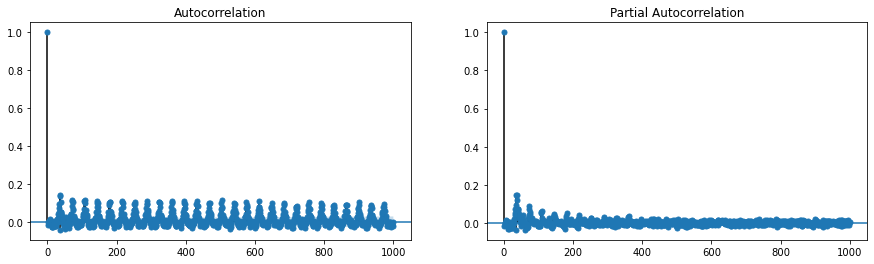

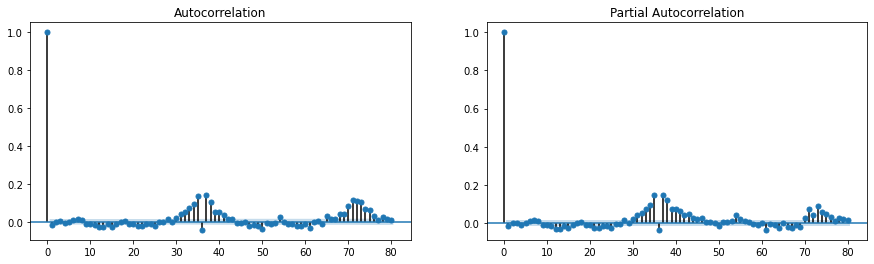

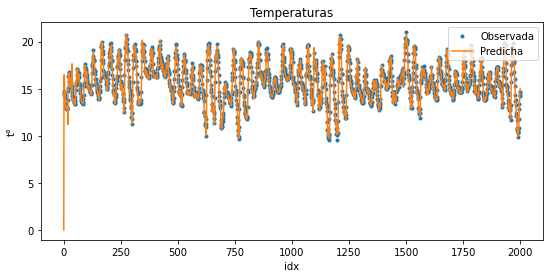

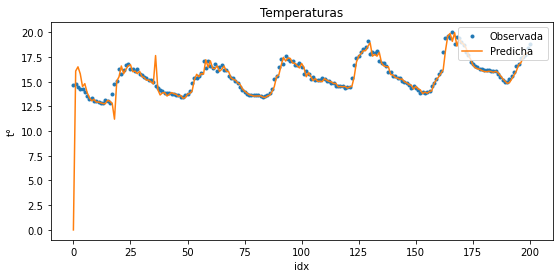

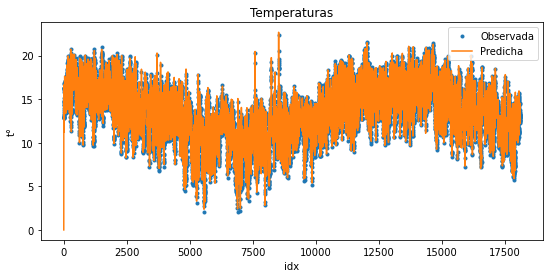

In [23]:
mysarima2(Y=Y_Ajuste,
         order=(6,0,0),
         seasonal_order=(2,0,1,60*12/Intervalo))

In [35]:
#Nos quedamos con:

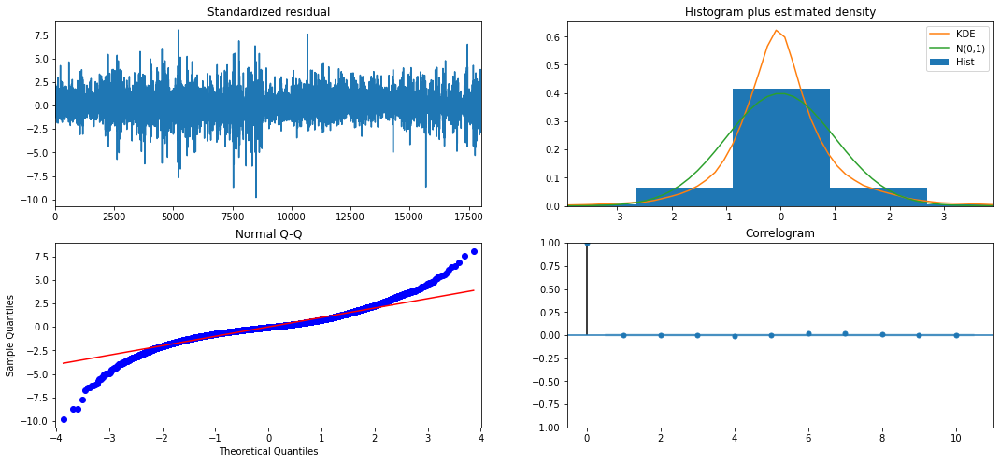

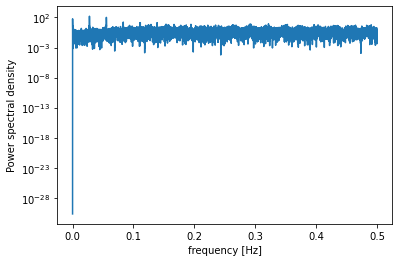

          freq         pow         delay
502   0.027741  157.529603     36.047809
1005  0.055537  101.649600     18.005970
503   0.027796   71.480983     35.976143
1     0.000055   58.137983  18096.000000
2     0.000111   32.123272   9048.000000
501   0.027686   29.932484     36.119760
1007  0.055648   24.678140     17.970209
1507  0.083278   16.868146     12.007963
2013  0.111240   13.731781      8.989568
2010  0.111074   13.574373      9.002985
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                18096
Model:             SARIMAX(6, 0, 0)x(2, 0, 0, 18)   Log Likelihood              -16534.524
Date:                            Tue, 17 Nov 2020   AIC                          33089.047
Time:                                    12:16:07   BIC                          33167.058
Sample:                                         0   HQIC                         33114.697
   

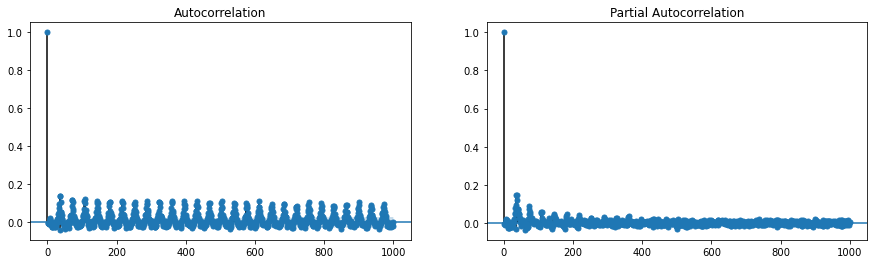

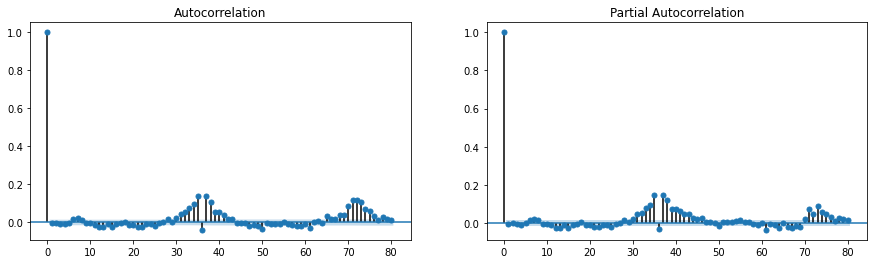

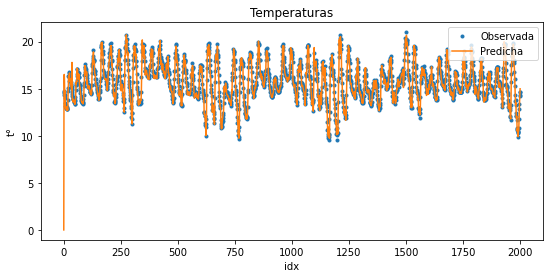

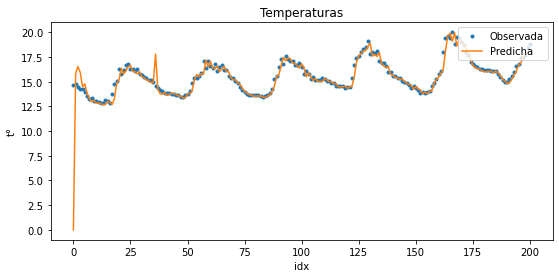

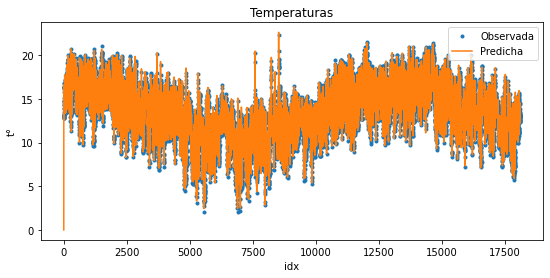

In [36]:
Res4=mysarima2(Y=Y_Ajuste,
         order=(6,0,0),
         seasonal_order=(2,0,0,60*12/Intervalo))

In [37]:
#Validamos

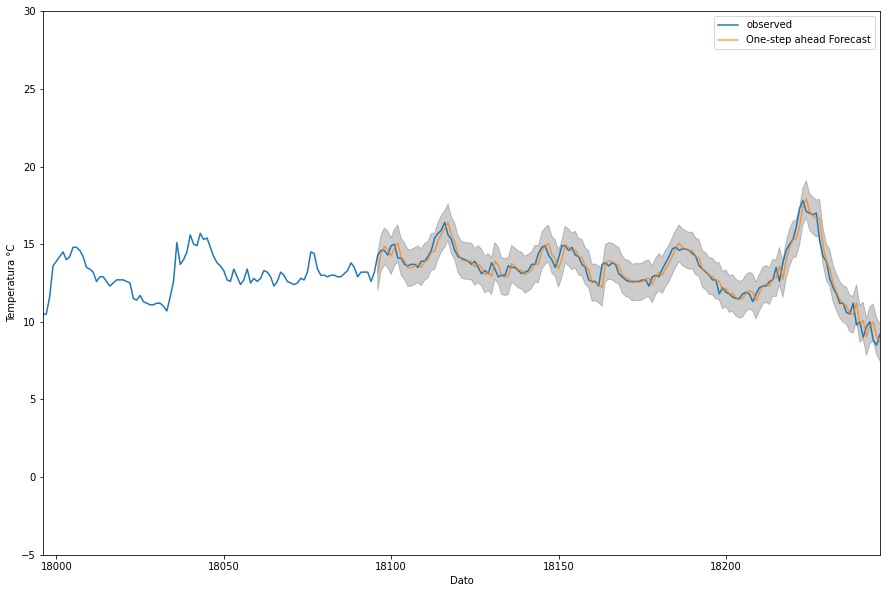

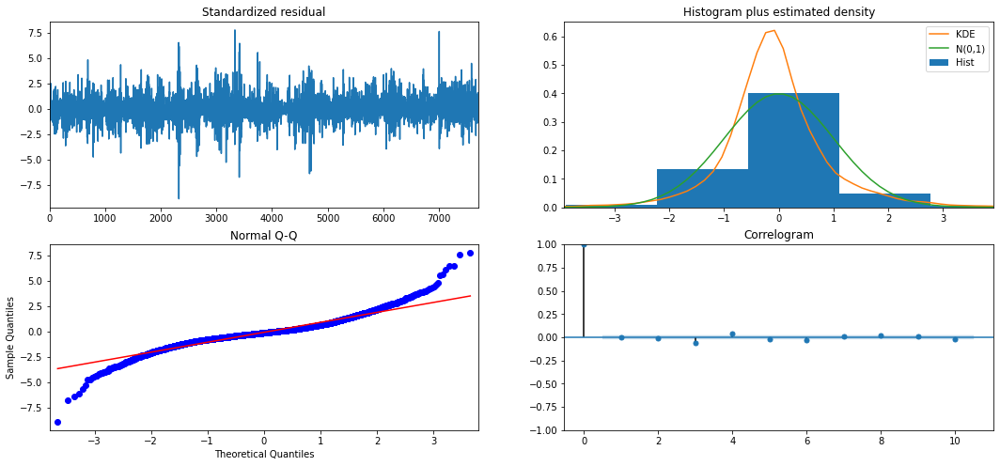

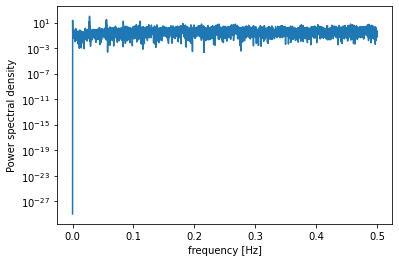

                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                 7755
Model:             SARIMAX(6, 0, 0)x(2, 0, 0, 18)   Log Likelihood               -6929.626
Date:                            Tue, 17 Nov 2020   AIC                          13879.253
Time:                                    12:16:21   BIC                          13948.760
Sample:                                         0   HQIC                         13903.087
                                           - 7755                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.5099      0.019     27.483      0.000       0.474       0.546
ar.L1          1.0446      0.005   

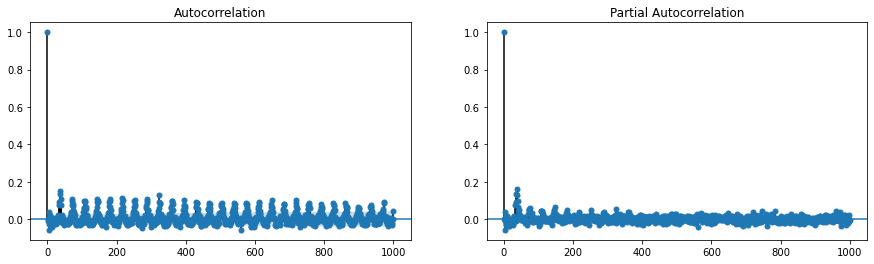

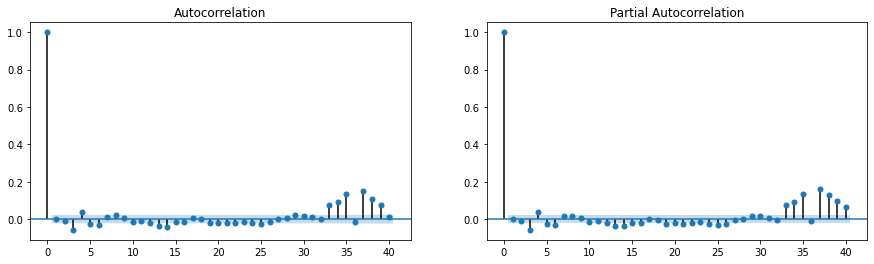

In [38]:
predecir_2(Res4,Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
18096  14.3  1.110589         True        False        False
18097  14.6  0.177117        False        False        False
18098  14.6 -0.248214        False        False        False
18099  14.3 -0.362903        False        False        False
18100  14.9  0.670335        False        False        False
...     ...       ...          ...          ...          ...
25846  16.5 -0.005266        False        False        False
25847  16.9  0.531368        False        False        False
25848  16.7 -0.083472        False        False        False
25849  16.5 -0.059045        False        False        False
25850  15.9 -0.332451        False        False        False

[7755 rows x 5 columns]
Promedio Valor Absoluto Error: 0.4077503511449205
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0     8.742747     1.108962     0.167634


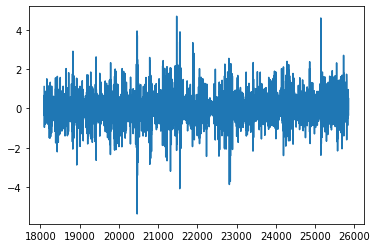

In [39]:
predecir_4(Res4,Y_Test,limite)